# ----- PALETTES AND ARRAY STUFF -----

In [1]:
!ls photos

0028xxx.jpg  0127insta.jpg  0215insta.jpg  0417insta.jpg  photos.png
0037xxx.jpg  0136insta.jpg  0292insta.jpg  0442insta.jpg
003.jpg      0147xxx.jpg    0348insta.jpg  38.jpg


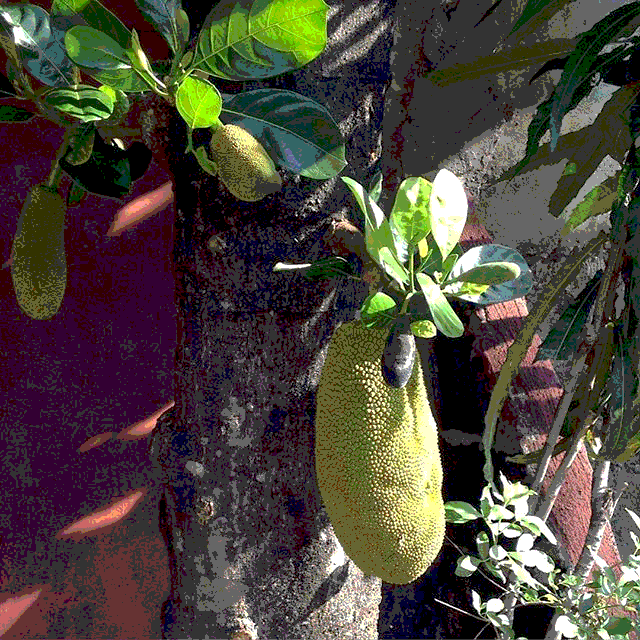

In [4]:
from PIL import Image
oldimage = Image.open("photos/photos.png")
palettedata = [0, 0, 0, 102, 102, 102, 176, 176, 176, 255, 255, 255]
expanded_palettedata = palettedata * 64
newimage = oldimage.convert('P', dither=Image.NONE, palette=palettedata)
#newimage.show()
newimage

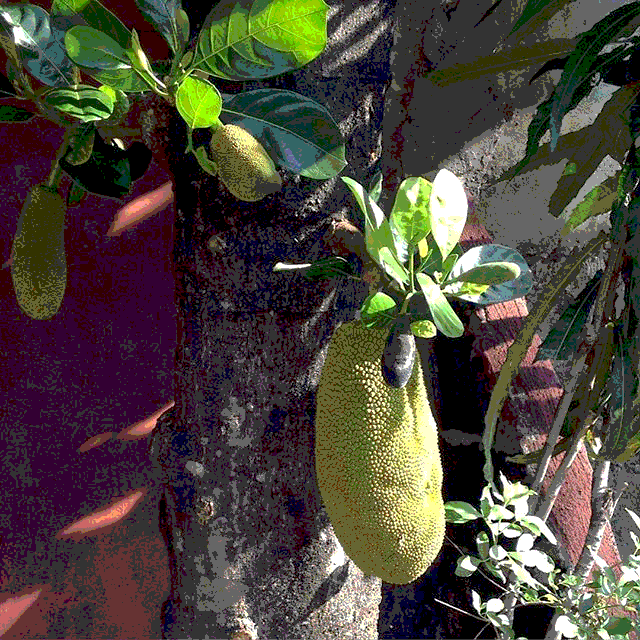

In [10]:
from PIL import Image
oldimage = Image.open("photos/photos.png")
palettedata = [230, 0, 0, 102, 202, 102, 176, 76, 176, 205, 255, 25]
expanded_palettedata = palettedata 
newimage = oldimage.convert('P', dither=Image.NONE, palette=palettedata)
#newimage.show()
newimage

In [ ]:
http://pillow.readthedocs.io/en/4.0.x/reference/Image.html
https://pillow.readthedocs.io/en/3.0.0/_modules/PIL/ImageOps.html
https://pillow.readthedocs.io/en/3.0.0/_modules/PIL/ImageOps.html   

In [9]:
from PIL import Image
oldimage = Image.open("photos/photos.png")
palettedata = [230, 0, 0, 102, 202, 102, 176, 76, 176, 205, 255, 25]
newimage = Image.new('P', oldimage.size)
newimage.putpalette(palettedata * 64)
newimage.paste(oldimage, (0, 0) + oldimage.size)
newimage.show()    

In [11]:
from PIL import Image
palettedata = [0, 0, 0, 102, 102, 102, 176, 176, 176, 255, 255, 255]
palimage = Image.new('P', (16, 16))
palimage.putpalette(palettedata * 64)
oldimage = Image.open("photos/photos.png")
newimage = oldimage.quantize(palette=palimage)
newimage.show()

# -- SWAP PALETTES with another image -- start

In [42]:
src_handle = Image.open("junk/bb.png")
dst_handle = Image.open("junk/aa.png")
x=src_handle.size
y=dst_handle.size
print x, y

(640, 640) (640, 640)


In [17]:
!wget -O flower.jpg http://www.flowergardenpictures.com/wp-content/uploads/2014/03/spring-flower-garden.jpg

--2017-08-28 13:28:29--  http://www.flowergardenpictures.com/wp-content/uploads/2014/03/spring-flower-garden.jpg
Resolving www.flowergardenpictures.com (www.flowergardenpictures.com)... 69.89.31.178
Connecting to www.flowergardenpictures.com (www.flowergardenpictures.com)|69.89.31.178|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 225855 (221K) [image/jpeg]
Saving to: ‘flower.jpg’

flower.jpg          100%[===================>] 220.56K   207KB/s    in 1.1s    

2017-08-28 13:28:30 (207 KB/s) - ‘flower.jpg’ saved [225855/225855]



In [8]:
import os
import sys
from PIL import Image
import shutil
#input2='/home/jack/Desktop/deep-dream-generator/notebooks/bugs/butterflies/000163.jpg'
input1='myra.png'
#input1='/home/jack/Desktop/imagebot/colorful/20170824124329.jpg'
input2='flower.png'
shutil.copy2(input1, 'instagram/') # complete target filename given
shutil.copy2(input2, 'instagram/')# target filename is /dst/dir/file.ext

aa = Image.open(input1).convert("RGB")
#bb = Image.open("/home/jack/Documents/GG.jpg").convert("RGB")
bb = Image.open(input2).convert("RGB")
xx=aa.resize((640,640), Image.NEAREST)
yy=bb.resize((640,640), Image.NEAREST)
xx.save("junk/aa.png")
yy.save("junk/bb.png")
src = Image.open('junk/aa.png').convert('RGB')
dst = Image.open('junk/bb.png').convert('RGB')
src.save("junk/aa.png")
dst.save("junk/bb.png")


In [15]:
import os
import sys
from PIL import Image
import shutil
import time
import random
#input2='/home/jack/Desktop/deep-dream-generator/notebooks/bugs/butterflies/000163.jpg'
#input1='/home/jack/Desktop/deep-dream-generator/notebooks/context-free/output/20170828154222.png'

path = r"photos/"
base_image = random.choice([
    x for x in os.listdir(path)
    if os.path.isfile(os.path.join(path, x))
])
filename0=(path+base_image)

#custom = "junk/mixpalette.png"
#filename0=(filename0)

path2 = r"images/"
base_image2 = random.choice([
    x for x in os.listdir(path2)
    if os.path.isfile(os.path.join(path2, x))
])
filename1=(path2+base_image2)

#custom = "junk/mixpalette.png"
#filename0=(filename0)




#input1='/home/jack/Desktop/imagebot/colorful/20170824124329.jpg'
#input2='/home/jack/Desktop/imagebot/posted/'
shutil.copy2(filename0, 'temp/') # complete target filename given
shutil.copy2(filename1, 'temp/')# target filename is /dst/dir/file.ext

aa = Image.open(filename0).convert("RGB")
#bb = Image.open("/home/jack/Documents/GG.jpg").convert("RGB")
bb = Image.open(filename1).convert("RGB")
xx=aa.resize((640,640), Image.NEAREST)
yy=bb.resize((640,640), Image.NEAREST)
xx.save("TEMP/aa.png")
yy.save("TEMP/bb.png")
src = Image.open('TEMP/aa.png').convert('RGB')
dst = Image.open('TEMP/bb.png').convert('RGB')
src.save("TEMP/aa.png")
dst.save("TEMP/bb.png")



n = 5 #number of partitions per channel.


src_handle = Image.open("TEMP/bb.png")
dst_handle = Image.open("TEMP/aa.png")
src = src_handle.load()
dst = dst_handle.load()
assert src_handle.size[0]*src_handle.size[1] == dst_handle.size[0]*dst_handle.size[1],"images must be same size"

def makePixelList(img):
    l = []
    for x in range(img.size[0]):
        for y in range(img.size[1]):
            l.append((x,y))
    return l

lsrc = makePixelList(src_handle)
ldst = makePixelList(dst_handle)

def sortAndDivide(coordlist,pixelimage,channel): #core
    global src,dst,n
    retlist = []
    #sort
    coordlist.sort(key=lambda t: pixelimage[t][channel])
    #divide
    partitionLength = int(len(coordlist)/n)
    if partitionLength <= 0:
        partitionLength = 1
    if channel < 2:
        for i in range(0,len(coordlist),partitionLength):
            retlist += sortAndDivide(coordlist[i:i+partitionLength],pixelimage,channel+1)
    else:
        retlist += coordlist
    return retlist

print(src[lsrc[0]])

lsrc = sortAndDivide(lsrc,src,0)
ldst = sortAndDivide(ldst,dst,0)

for i in range(len(ldst)):
    dst[ldst[i]] = src[lsrc[i]]
    
    
filename = time.strftime("TEMP/PalletteTemp.png")

dst_handle.save(filename)

shutil.copy2(filename, "temp/")
print filename

(59, 52, 44)
TEMP/PalletteTemp.png


In [16]:
!showme TEMP/PalletteTemp.png

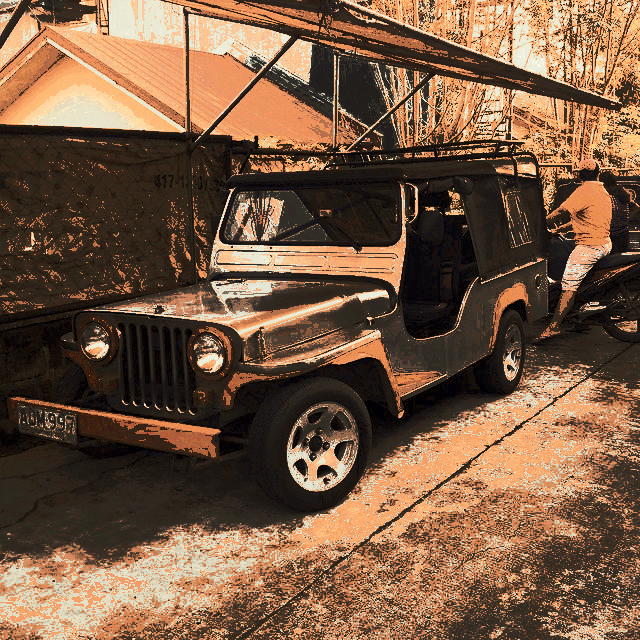

In [17]:
from PIL import Image
im = Image.open("TEMP/PalletteTemp.png")
im

In [35]:
import os
import sys
from PIL import Image
import shutil
import time
import random
#input2='/home/jack/Desktop/deep-dream-generator/notebooks/bugs/butterflies/000163.jpg'
#input1='/home/jack/Desktop/deep-dream-generator/notebooks/context-free/output/20170828154222.png'

path = r"photos/"
base_image = random.choice([
    x for x in os.listdir(path)
    if os.path.isfile(os.path.join(path, x))
])
filename0=(path+base_image)

#custom = "junk/mixpalette.png"
#filename0=(filename0)

path2 = r"images/"
base_image2 = random.choice([
    x for x in os.listdir(path2)
    if os.path.isfile(os.path.join(path2, x))
])
filename1=(path2+base_image2)

#custom = "junk/mixpalette.png"
#filename0=(filename0)




#input1='/home/jack/Desktop/imagebot/colorful/20170824124329.jpg'
#input2='/home/jack/Desktop/imagebot/posted/'
shutil.copy2(filename0, 'temp/') # complete target filename given
shutil.copy2(filename1, 'temp/')# target filename is /dst/dir/file.ext

aa = Image.open(filename0).convert("RGB")
#bb = Image.open("/home/jack/Documents/GG.jpg").convert("RGB")
bb = Image.open(filename1).convert("RGB")
xx=aa.resize((640,640), Image.NEAREST)
yy=bb.resize((640,640), Image.NEAREST)
xx.save("TEMP/aa.png")
yy.save("TEMP/bb.png")
src = Image.open('TEMP/aa.png').convert('RGB')
dst = Image.open('TEMP/bb.png').convert('RGB')
src.save("TEMP/aa.png")
dst.save("TEMP/bb.png")



n = 5 #number of partitions per channel.


src_handle = Image.open("TEMP/bb.png")
dst_handle = Image.open("TEMP/aa.png")
src = src_handle.load()
dst = dst_handle.load()
assert src_handle.size[0]*src_handle.size[1] == dst_handle.size[0]*dst_handle.size[1],"images must be same size"

def makePixelList(img):
    l = []
    for x in range(img.size[0]):
        for y in range(img.size[1]):
            l.append((x,y))
    return l

lsrc = makePixelList(src_handle)
ldst = makePixelList(dst_handle)

def sortAndDivide(coordlist,pixelimage,channel): #core
    global src,dst,n
    retlist = []
    #sort
    coordlist.sort(key=lambda t: pixelimage[t][channel])
    #divide
    partitionLength = int(len(coordlist)/n)
    if partitionLength <= 0:
        partitionLength = 1
    if channel < 2:
        for i in range(0,len(coordlist),partitionLength):
            retlist += sortAndDivide(coordlist[i:i+partitionLength],pixelimage,channel+1)
    else:
        retlist += coordlist
    return retlist

print(src[lsrc[0]])

lsrc = sortAndDivide(lsrc,src,0)
ldst = sortAndDivide(ldst,dst,0)

for i in range(len(ldst)):
    dst[ldst[i]] = src[lsrc[i]]
    
    
filename = time.strftime("TEMP/PalletteTemp3.png")

dst_handle.save(filename)

shutil.copy2(filename, "temp/")
print filename

(124, 134, 136)
TEMP/PalletteTemp3.png


In [36]:
!showme TEMP/PalletteTemp3.png

# -- SWAP PALETTES with another image -- END

In [27]:
%%writefile palettize.py
#!/home/jack/anaconda2/bin/python
from PIL import Image
import time
import os
import sys
from optparse import OptionParser
n=5
# Parse options from the command line
parser = OptionParser()
parser.add_option("-d", "--dst", dest="dst",
                      help="transfer palette palette to ..", metavar="FILE")
parser.add_option("-s", "--src", dest="src", metavar="FILE",
                      help="transfer palette palette from ..")
parser.add_option("-o", "--out", dest="output", metavar="FILE",
                      help="save output to FILE", default="output.png")
(options, args) = parser.parse_args()
if not options.dst or not options.src:
        raise Exception("Missing arguments. See help for more info.")
#dst = "/home/jack/Documents/MechanicalChaos3.png"
#src ="outBorgPalette.jpg"
class Palettize():

    aa = Image.open(options.dst).convert("RGB")
    #bb = Image.open("/home/jack/Documents/GG.jpg").convert("RGB")
    bb = Image.open(options.src).convert("RGB")
    xx=aa.resize((640,640), Image.NEAREST)
    yy=bb.resize((640,640), Image.NEAREST)
    xx.save("junk/aa.png")
    yy.save("junk/bb.png")
    src = Image.open('junk/aa.png').convert('RGB')
    dst = Image.open('junk/bb.png').convert('RGB')
    src.save("junk/aa.png")
    dst.save("junk/bb.png")
    n = 5 #number of partitions per channel.
    src_handle = Image.open("junk/bb.png")
    dst_handle = Image.open("junk/aa.png")
    src = src_handle.load()
    dst = dst_handle.load()
    assert src_handle.size[0]*src_handle.size[1] == dst_handle.size[0]*dst_handle.size[1],"images must be same size"

    def makePixelList(img):
        l = []
        for x in range(img.size[0]):
            for y in range(img.size[1]):
                l.append((x,y))
        return l

    lsrc = makePixelList(src_handle)
    ldst = makePixelList(dst_handle)

    def sortAndDivide(coordlist,pixelimage,channel): #core
        global src,dst,n
        retlist = []
        #sort
        coordlist.sort(key=lambda t: pixelimage[t][channel])
        #divide
        partitionLength = int(len(coordlist)/n)
        if partitionLength <= 0:
            partitionLength = 1
        if channel < 2:
            for i in range(0,len(coordlist),partitionLength):
                retlist += sortAndDivide(coordlist[i:i+partitionLength],pixelimage,channel+1)
        else:
            retlist += coordlist
        

        print(src[lsrc[0]])
        lsrc = sortAndDivide(lsrc,src,0)
        ldst = sortAndDivide(ldst,dst,0)

        for i in range(len(ldst)):
            dst[ldst[i]] = src[lsrc[i]]
            
    def resize640(src):
        Bp=Image.open(src)
        width, height = Bp.size
        w1=int((width-height)/2)
        w2 = int(width-w1)
        h1=height-height
        h2=height
        Cc=Bp.crop((w1,h1,w2,h2))
        result = Cc.resize((640,640), Image.NEAREST)
        return result

 
    dst_handle.save(options.output)
    print options.output

Writing palettize.py


In [42]:
%%writefile testpal.py
from PIL import Image
import time
import os
import sys
from optparse import OptionParser
n=5
# Parse options from the command line
parser = OptionParser()
parser.add_option("-d", "--dst", dest="dst",
                      help="transfer palette palette to ..", metavar="FILE")
parser.add_option("-s", "--src", dest="src", metavar="FILE",
                      help="transfer palette palette from ..")
parser.add_option("-o", "--out", dest="output", metavar="FILE",
                      help="save output to FILE", default="output.png")
(options, args) = parser.parse_args()
if not options.dst or not options.src:
        raise Exception("Missing arguments. See help for more info.")
#dst = "/home/jack/Documents/MechanicalChaos3.png"
#src ="outBorgPalette.jpg"

aa = Image.open(options.dst).convert("RGB")
#bb = Image.open("/home/jack/Documents/GG.jpg").convert("RGB")
bb = Image.open(options.src).convert("RGB")
xx=aa.resize((640,640), Image.NEAREST)
yy=bb.resize((640,640), Image.NEAREST)
xx.save("junk/Pala.png")
yy.save("junk/Palb.png")
src = Image.open('junk/Pala.png').convert('RGB')
dst = Image.open('junk/Palb.png').convert('RGB')
src.save("junk/aa.png")
dst.save("junk/bb.png")
n = 5 #number of partitions per channel.
src_handle = Image.open("junk/bb.png")
dst_handle = Image.open("junk/aa.png")
src = src_handle.load()
dst = dst_handle.load()
assert src_handle.size[0]*src_handle.size[1] == dst_handle.size[0]*dst_handle.size[1],"images must be same size"

def makePixelList(img):
    l = []
    for x in range(img.size[0]):
        for y in range(img.size[1]):
            l.append((x,y))
    return l

lsrc = makePixelList(src_handle)
ldst = makePixelList(dst_handle)
print ldst

Overwriting testpal.py


In [43]:
!python testpal.py -d junk/aa1.png -s junk/bb1.png =o TEMP/test-aa-bb.jpg

[(0, 0), (0, 1), (0, 2), (0, 3), (0, 4), (0, 5), (0, 6), (0, 7), (0, 8), (0, 9), (0, 10), (0, 11), (0, 12), (0, 13), (0, 14), (0, 15), (0, 16), (0, 17), (0, 18), (0, 19), (0, 20), (0, 21), (0, 22), (0, 23), (0, 24), (0, 25), (0, 26), (0, 27), (0, 28), (0, 29), (0, 30), (0, 31), (0, 32), (0, 33), (0, 34), (0, 35), (0, 36), (0, 37), (0, 38), (0, 39), (0, 40), (0, 41), (0, 42), (0, 43), (0, 44), (0, 45), (0, 46), (0, 47), (0, 48), (0, 49), (0, 50), (0, 51), (0, 52), (0, 53), (0, 54), (0, 55), (0, 56), (0, 57), (0, 58), (0, 59), (0, 60), (0, 61), (0, 62), (0, 63), (0, 64), (0, 65), (0, 66), (0, 67), (0, 68), (0, 69), (0, 70), (0, 71), (0, 72), (0, 73), (0, 74), (0, 75), (0, 76), (0, 77), (0, 78), (0, 79), (0, 80), (0, 81), (0, 82), (0, 83), (0, 84), (0, 85), (0, 86), (0, 87), (0, 88), (0, 89), (0, 90), (0, 91), (0, 92), (0, 93), (0, 94), (0, 95), (0, 96), (0, 97), (0, 98), (0, 99), (0, 100), (0, 101), (0, 102), (0, 103), (0, 104), (0, 105), (0, 106), (0, 107), (0, 108), (0, 109), (0, 110),

2), (12, 123), (12, 124), (12, 125), (12, 126), (12, 127), (12, 128), (12, 129), (12, 130), (12, 131), (12, 132), (12, 133), (12, 134), (12, 135), (12, 136), (12, 137), (12, 138), (12, 139), (12, 140), (12, 141), (12, 142), (12, 143), (12, 144), (12, 145), (12, 146), (12, 147), (12, 148), (12, 149), (12, 150), (12, 151), (12, 152), (12, 153), (12, 154), (12, 155), (12, 156), (12, 157), (12, 158), (12, 159), (12, 160), (12, 161), (12, 162), (12, 163), (12, 164), (12, 165), (12, 166), (12, 167), (12, 168), (12, 169), (12, 170), (12, 171), (12, 172), (12, 173), (12, 174), (12, 175), (12, 176), (12, 177), (12, 178), (12, 179), (12, 180), (12, 181), (12, 182), (12, 183), (12, 184), (12, 185), (12, 186), (12, 187), (12, 188), (12, 189), (12, 190), (12, 191), (12, 192), (12, 193), (12, 194), (12, 195), (12, 196), (12, 197), (12, 198), (12, 199), (12, 200), (12, 201), (12, 202), (12, 203), (12, 204), (12, 205), (12, 206), (12, 207), (12, 208), (12, 209), (12, 210), (12, 211), (12, 212), (12, 2

(37, 457), (37, 458), (37, 459), (37, 460), (37, 461), (37, 462), (37, 463), (37, 464), (37, 465), (37, 466), (37, 467), (37, 468), (37, 469), (37, 470), (37, 471), (37, 472), (37, 473), (37, 474), (37, 475), (37, 476), (37, 477), (37, 478), (37, 479), (37, 480), (37, 481), (37, 482), (37, 483), (37, 484), (37, 485), (37, 486), (37, 487), (37, 488), (37, 489), (37, 490), (37, 491), (37, 492), (37, 493), (37, 494), (37, 495), (37, 496), (37, 497), (37, 498), (37, 499), (37, 500), (37, 501), (37, 502), (37, 503), (37, 504), (37, 505), (37, 506), (37, 507), (37, 508), (37, 509), (37, 510), (37, 511), (37, 512), (37, 513), (37, 514), (37, 515), (37, 516), (37, 517), (37, 518), (37, 519), (37, 520), (37, 521), (37, 522), (37, 523), (37, 524), (37, 525), (37, 526), (37, 527), (37, 528), (37, 529), (37, 530), (37, 531), (37, 532), (37, 533), (37, 534), (37, 535), (37, 536), (37, 537), (37, 538), (37, 539), (37, 540), (37, 541), (37, 542), (37, 543), (37, 544), (37, 545), (37, 546), (37, 547),

, 398), (56, 399), (56, 400), (56, 401), (56, 402), (56, 403), (56, 404), (56, 405), (56, 406), (56, 407), (56, 408), (56, 409), (56, 410), (56, 411), (56, 412), (56, 413), (56, 414), (56, 415), (56, 416), (56, 417), (56, 418), (56, 419), (56, 420), (56, 421), (56, 422), (56, 423), (56, 424), (56, 425), (56, 426), (56, 427), (56, 428), (56, 429), (56, 430), (56, 431), (56, 432), (56, 433), (56, 434), (56, 435), (56, 436), (56, 437), (56, 438), (56, 439), (56, 440), (56, 441), (56, 442), (56, 443), (56, 444), (56, 445), (56, 446), (56, 447), (56, 448), (56, 449), (56, 450), (56, 451), (56, 452), (56, 453), (56, 454), (56, 455), (56, 456), (56, 457), (56, 458), (56, 459), (56, 460), (56, 461), (56, 462), (56, 463), (56, 464), (56, 465), (56, 466), (56, 467), (56, 468), (56, 469), (56, 470), (56, 471), (56, 472), (56, 473), (56, 474), (56, 475), (56, 476), (56, 477), (56, 478), (56, 479), (56, 480), (56, 481), (56, 482), (56, 483), (56, 484), (56, 485), (56, 486), (56, 487), (56, 488), (5

638), (71, 639), (72, 0), (72, 1), (72, 2), (72, 3), (72, 4), (72, 5), (72, 6), (72, 7), (72, 8), (72, 9), (72, 10), (72, 11), (72, 12), (72, 13), (72, 14), (72, 15), (72, 16), (72, 17), (72, 18), (72, 19), (72, 20), (72, 21), (72, 22), (72, 23), (72, 24), (72, 25), (72, 26), (72, 27), (72, 28), (72, 29), (72, 30), (72, 31), (72, 32), (72, 33), (72, 34), (72, 35), (72, 36), (72, 37), (72, 38), (72, 39), (72, 40), (72, 41), (72, 42), (72, 43), (72, 44), (72, 45), (72, 46), (72, 47), (72, 48), (72, 49), (72, 50), (72, 51), (72, 52), (72, 53), (72, 54), (72, 55), (72, 56), (72, 57), (72, 58), (72, 59), (72, 60), (72, 61), (72, 62), (72, 63), (72, 64), (72, 65), (72, 66), (72, 67), (72, 68), (72, 69), (72, 70), (72, 71), (72, 72), (72, 73), (72, 74), (72, 75), (72, 76), (72, 77), (72, 78), (72, 79), (72, 80), (72, 81), (72, 82), (72, 83), (72, 84), (72, 85), (72, 86), (72, 87), (72, 88), (72, 89), (72, 90), (72, 91), (72, 92), (72, 93), (72, 94), (72, 95), (72, 96), (72, 97), (72, 98), (72

88, 164), (88, 165), (88, 166), (88, 167), (88, 168), (88, 169), (88, 170), (88, 171), (88, 172), (88, 173), (88, 174), (88, 175), (88, 176), (88, 177), (88, 178), (88, 179), (88, 180), (88, 181), (88, 182), (88, 183), (88, 184), (88, 185), (88, 186), (88, 187), (88, 188), (88, 189), (88, 190), (88, 191), (88, 192), (88, 193), (88, 194), (88, 195), (88, 196), (88, 197), (88, 198), (88, 199), (88, 200), (88, 201), (88, 202), (88, 203), (88, 204), (88, 205), (88, 206), (88, 207), (88, 208), (88, 209), (88, 210), (88, 211), (88, 212), (88, 213), (88, 214), (88, 215), (88, 216), (88, 217), (88, 218), (88, 219), (88, 220), (88, 221), (88, 222), (88, 223), (88, 224), (88, 225), (88, 226), (88, 227), (88, 228), (88, 229), (88, 230), (88, 231), (88, 232), (88, 233), (88, 234), (88, 235), (88, 236), (88, 237), (88, 238), (88, 239), (88, 240), (88, 241), (88, 242), (88, 243), (88, 244), (88, 245), (88, 246), (88, 247), (88, 248), (88, 249), (88, 250), (88, 251), (88, 252), (88, 253), (88, 254), 

 305), (102, 306), (102, 307), (102, 308), (102, 309), (102, 310), (102, 311), (102, 312), (102, 313), (102, 314), (102, 315), (102, 316), (102, 317), (102, 318), (102, 319), (102, 320), (102, 321), (102, 322), (102, 323), (102, 324), (102, 325), (102, 326), (102, 327), (102, 328), (102, 329), (102, 330), (102, 331), (102, 332), (102, 333), (102, 334), (102, 335), (102, 336), (102, 337), (102, 338), (102, 339), (102, 340), (102, 341), (102, 342), (102, 343), (102, 344), (102, 345), (102, 346), (102, 347), (102, 348), (102, 349), (102, 350), (102, 351), (102, 352), (102, 353), (102, 354), (102, 355), (102, 356), (102, 357), (102, 358), (102, 359), (102, 360), (102, 361), (102, 362), (102, 363), (102, 364), (102, 365), (102, 366), (102, 367), (102, 368), (102, 369), (102, 370), (102, 371), (102, 372), (102, 373), (102, 374), (102, 375), (102, 376), (102, 377), (102, 378), (102, 379), (102, 380), (102, 381), (102, 382), (102, 383), (102, 384), (102, 385), (102, 386), (102, 387), (102, 388

), (114, 249), (114, 250), (114, 251), (114, 252), (114, 253), (114, 254), (114, 255), (114, 256), (114, 257), (114, 258), (114, 259), (114, 260), (114, 261), (114, 262), (114, 263), (114, 264), (114, 265), (114, 266), (114, 267), (114, 268), (114, 269), (114, 270), (114, 271), (114, 272), (114, 273), (114, 274), (114, 275), (114, 276), (114, 277), (114, 278), (114, 279), (114, 280), (114, 281), (114, 282), (114, 283), (114, 284), (114, 285), (114, 286), (114, 287), (114, 288), (114, 289), (114, 290), (114, 291), (114, 292), (114, 293), (114, 294), (114, 295), (114, 296), (114, 297), (114, 298), (114, 299), (114, 300), (114, 301), (114, 302), (114, 303), (114, 304), (114, 305), (114, 306), (114, 307), (114, 308), (114, 309), (114, 310), (114, 311), (114, 312), (114, 313), (114, 314), (114, 315), (114, 316), (114, 317), (114, 318), (114, 319), (114, 320), (114, 321), (114, 322), (114, 323), (114, 324), (114, 325), (114, 326), (114, 327), (114, 328), (114, 329), (114, 330), (114, 331), (

 (125, 323), (125, 324), (125, 325), (125, 326), (125, 327), (125, 328), (125, 329), (125, 330), (125, 331), (125, 332), (125, 333), (125, 334), (125, 335), (125, 336), (125, 337), (125, 338), (125, 339), (125, 340), (125, 341), (125, 342), (125, 343), (125, 344), (125, 345), (125, 346), (125, 347), (125, 348), (125, 349), (125, 350), (125, 351), (125, 352), (125, 353), (125, 354), (125, 355), (125, 356), (125, 357), (125, 358), (125, 359), (125, 360), (125, 361), (125, 362), (125, 363), (125, 364), (125, 365), (125, 366), (125, 367), (125, 368), (125, 369), (125, 370), (125, 371), (125, 372), (125, 373), (125, 374), (125, 375), (125, 376), (125, 377), (125, 378), (125, 379), (125, 380), (125, 381), (125, 382), (125, 383), (125, 384), (125, 385), (125, 386), (125, 387), (125, 388), (125, 389), (125, 390), (125, 391), (125, 392), (125, 393), (125, 394), (125, 395), (125, 396), (125, 397), (125, 398), (125, 399), (125, 400), (125, 401), (125, 402), (125, 403), (125, 404), (125, 405), (12

136, 361), (136, 362), (136, 363), (136, 364), (136, 365), (136, 366), (136, 367), (136, 368), (136, 369), (136, 370), (136, 371), (136, 372), (136, 373), (136, 374), (136, 375), (136, 376), (136, 377), (136, 378), (136, 379), (136, 380), (136, 381), (136, 382), (136, 383), (136, 384), (136, 385), (136, 386), (136, 387), (136, 388), (136, 389), (136, 390), (136, 391), (136, 392), (136, 393), (136, 394), (136, 395), (136, 396), (136, 397), (136, 398), (136, 399), (136, 400), (136, 401), (136, 402), (136, 403), (136, 404), (136, 405), (136, 406), (136, 407), (136, 408), (136, 409), (136, 410), (136, 411), (136, 412), (136, 413), (136, 414), (136, 415), (136, 416), (136, 417), (136, 418), (136, 419), (136, 420), (136, 421), (136, 422), (136, 423), (136, 424), (136, 425), (136, 426), (136, 427), (136, 428), (136, 429), (136, 430), (136, 431), (136, 432), (136, 433), (136, 434), (136, 435), (136, 436), (136, 437), (136, 438), (136, 439), (136, 440), (136, 441), (136, 442), (136, 443), (136,

, (147, 63), (147, 64), (147, 65), (147, 66), (147, 67), (147, 68), (147, 69), (147, 70), (147, 71), (147, 72), (147, 73), (147, 74), (147, 75), (147, 76), (147, 77), (147, 78), (147, 79), (147, 80), (147, 81), (147, 82), (147, 83), (147, 84), (147, 85), (147, 86), (147, 87), (147, 88), (147, 89), (147, 90), (147, 91), (147, 92), (147, 93), (147, 94), (147, 95), (147, 96), (147, 97), (147, 98), (147, 99), (147, 100), (147, 101), (147, 102), (147, 103), (147, 104), (147, 105), (147, 106), (147, 107), (147, 108), (147, 109), (147, 110), (147, 111), (147, 112), (147, 113), (147, 114), (147, 115), (147, 116), (147, 117), (147, 118), (147, 119), (147, 120), (147, 121), (147, 122), (147, 123), (147, 124), (147, 125), (147, 126), (147, 127), (147, 128), (147, 129), (147, 130), (147, 131), (147, 132), (147, 133), (147, 134), (147, 135), (147, 136), (147, 137), (147, 138), (147, 139), (147, 140), (147, 141), (147, 142), (147, 143), (147, 144), (147, 145), (147, 146), (147, 147), (147, 148), (14

 (157, 271), (157, 272), (157, 273), (157, 274), (157, 275), (157, 276), (157, 277), (157, 278), (157, 279), (157, 280), (157, 281), (157, 282), (157, 283), (157, 284), (157, 285), (157, 286), (157, 287), (157, 288), (157, 289), (157, 290), (157, 291), (157, 292), (157, 293), (157, 294), (157, 295), (157, 296), (157, 297), (157, 298), (157, 299), (157, 300), (157, 301), (157, 302), (157, 303), (157, 304), (157, 305), (157, 306), (157, 307), (157, 308), (157, 309), (157, 310), (157, 311), (157, 312), (157, 313), (157, 314), (157, 315), (157, 316), (157, 317), (157, 318), (157, 319), (157, 320), (157, 321), (157, 322), (157, 323), (157, 324), (157, 325), (157, 326), (157, 327), (157, 328), (157, 329), (157, 330), (157, 331), (157, 332), (157, 333), (157, 334), (157, 335), (157, 336), (157, 337), (157, 338), (157, 339), (157, 340), (157, 341), (157, 342), (157, 343), (157, 344), (157, 345), (157, 346), (157, 347), (157, 348), (157, 349), (157, 350), (157, 351), (157, 352), (157, 353), (15

 (167, 440), (167, 441), (167, 442), (167, 443), (167, 444), (167, 445), (167, 446), (167, 447), (167, 448), (167, 449), (167, 450), (167, 451), (167, 452), (167, 453), (167, 454), (167, 455), (167, 456), (167, 457), (167, 458), (167, 459), (167, 460), (167, 461), (167, 462), (167, 463), (167, 464), (167, 465), (167, 466), (167, 467), (167, 468), (167, 469), (167, 470), (167, 471), (167, 472), (167, 473), (167, 474), (167, 475), (167, 476), (167, 477), (167, 478), (167, 479), (167, 480), (167, 481), (167, 482), (167, 483), (167, 484), (167, 485), (167, 486), (167, 487), (167, 488), (167, 489), (167, 490), (167, 491), (167, 492), (167, 493), (167, 494), (167, 495), (167, 496), (167, 497), (167, 498), (167, 499), (167, 500), (167, 501), (167, 502), (167, 503), (167, 504), (167, 505), (167, 506), (167, 507), (167, 508), (167, 509), (167, 510), (167, 511), (167, 512), (167, 513), (167, 514), (167, 515), (167, 516), (167, 517), (167, 518), (167, 519), (167, 520), (167, 521), (167, 522), (16

52), (171, 453), (171, 454), (171, 455), (171, 456), (171, 457), (171, 458), (171, 459), (171, 460), (171, 461), (171, 462), (171, 463), (171, 464), (171, 465), (171, 466), (171, 467), (171, 468), (171, 469), (171, 470), (171, 471), (171, 472), (171, 473), (171, 474), (171, 475), (171, 476), (171, 477), (171, 478), (171, 479), (171, 480), (171, 481), (171, 482), (171, 483), (171, 484), (171, 485), (171, 486), (171, 487), (171, 488), (171, 489), (171, 490), (171, 491), (171, 492), (171, 493), (171, 494), (171, 495), (171, 496), (171, 497), (171, 498), (171, 499), (171, 500), (171, 501), (171, 502), (171, 503), (171, 504), (171, 505), (171, 506), (171, 507), (171, 508), (171, 509), (171, 510), (171, 511), (171, 512), (171, 513), (171, 514), (171, 515), (171, 516), (171, 517), (171, 518), (171, 519), (171, 520), (171, 521), (171, 522), (171, 523), (171, 524), (171, 525), (171, 526), (171, 527), (171, 528), (171, 529), (171, 530), (171, 531), (171, 532), (171, 533), (171, 534), (171, 535),

), (182, 539), (182, 540), (182, 541), (182, 542), (182, 543), (182, 544), (182, 545), (182, 546), (182, 547), (182, 548), (182, 549), (182, 550), (182, 551), (182, 552), (182, 553), (182, 554), (182, 555), (182, 556), (182, 557), (182, 558), (182, 559), (182, 560), (182, 561), (182, 562), (182, 563), (182, 564), (182, 565), (182, 566), (182, 567), (182, 568), (182, 569), (182, 570), (182, 571), (182, 572), (182, 573), (182, 574), (182, 575), (182, 576), (182, 577), (182, 578), (182, 579), (182, 580), (182, 581), (182, 582), (182, 583), (182, 584), (182, 585), (182, 586), (182, 587), (182, 588), (182, 589), (182, 590), (182, 591), (182, 592), (182, 593), (182, 594), (182, 595), (182, 596), (182, 597), (182, 598), (182, 599), (182, 600), (182, 601), (182, 602), (182, 603), (182, 604), (182, 605), (182, 606), (182, 607), (182, 608), (182, 609), (182, 610), (182, 611), (182, 612), (182, 613), (182, 614), (182, 615), (182, 616), (182, 617), (182, 618), (182, 619), (182, 620), (182, 621), (

24), (187, 425), (187, 426), (187, 427), (187, 428), (187, 429), (187, 430), (187, 431), (187, 432), (187, 433), (187, 434), (187, 435), (187, 436), (187, 437), (187, 438), (187, 439), (187, 440), (187, 441), (187, 442), (187, 443), (187, 444), (187, 445), (187, 446), (187, 447), (187, 448), (187, 449), (187, 450), (187, 451), (187, 452), (187, 453), (187, 454), (187, 455), (187, 456), (187, 457), (187, 458), (187, 459), (187, 460), (187, 461), (187, 462), (187, 463), (187, 464), (187, 465), (187, 466), (187, 467), (187, 468), (187, 469), (187, 470), (187, 471), (187, 472), (187, 473), (187, 474), (187, 475), (187, 476), (187, 477), (187, 478), (187, 479), (187, 480), (187, 481), (187, 482), (187, 483), (187, 484), (187, 485), (187, 486), (187, 487), (187, 488), (187, 489), (187, 490), (187, 491), (187, 492), (187, 493), (187, 494), (187, 495), (187, 496), (187, 497), (187, 498), (187, 499), (187, 500), (187, 501), (187, 502), (187, 503), (187, 504), (187, 505), (187, 506), (187, 507),

1, 477), (191, 478), (191, 479), (191, 480), (191, 481), (191, 482), (191, 483), (191, 484), (191, 485), (191, 486), (191, 487), (191, 488), (191, 489), (191, 490), (191, 491), (191, 492), (191, 493), (191, 494), (191, 495), (191, 496), (191, 497), (191, 498), (191, 499), (191, 500), (191, 501), (191, 502), (191, 503), (191, 504), (191, 505), (191, 506), (191, 507), (191, 508), (191, 509), (191, 510), (191, 511), (191, 512), (191, 513), (191, 514), (191, 515), (191, 516), (191, 517), (191, 518), (191, 519), (191, 520), (191, 521), (191, 522), (191, 523), (191, 524), (191, 525), (191, 526), (191, 527), (191, 528), (191, 529), (191, 530), (191, 531), (191, 532), (191, 533), (191, 534), (191, 535), (191, 536), (191, 537), (191, 538), (191, 539), (191, 540), (191, 541), (191, 542), (191, 543), (191, 544), (191, 545), (191, 546), (191, 547), (191, 548), (191, 549), (191, 550), (191, 551), (191, 552), (191, 553), (191, 554), (191, 555), (191, 556), (191, 557), (191, 558), (191, 559), (191, 5

9, 205), (199, 206), (199, 207), (199, 208), (199, 209), (199, 210), (199, 211), (199, 212), (199, 213), (199, 214), (199, 215), (199, 216), (199, 217), (199, 218), (199, 219), (199, 220), (199, 221), (199, 222), (199, 223), (199, 224), (199, 225), (199, 226), (199, 227), (199, 228), (199, 229), (199, 230), (199, 231), (199, 232), (199, 233), (199, 234), (199, 235), (199, 236), (199, 237), (199, 238), (199, 239), (199, 240), (199, 241), (199, 242), (199, 243), (199, 244), (199, 245), (199, 246), (199, 247), (199, 248), (199, 249), (199, 250), (199, 251), (199, 252), (199, 253), (199, 254), (199, 255), (199, 256), (199, 257), (199, 258), (199, 259), (199, 260), (199, 261), (199, 262), (199, 263), (199, 264), (199, 265), (199, 266), (199, 267), (199, 268), (199, 269), (199, 270), (199, 271), (199, 272), (199, 273), (199, 274), (199, 275), (199, 276), (199, 277), (199, 278), (199, 279), (199, 280), (199, 281), (199, 282), (199, 283), (199, 284), (199, 285), (199, 286), (199, 287), (199, 2

), (208, 176), (208, 177), (208, 178), (208, 179), (208, 180), (208, 181), (208, 182), (208, 183), (208, 184), (208, 185), (208, 186), (208, 187), (208, 188), (208, 189), (208, 190), (208, 191), (208, 192), (208, 193), (208, 194), (208, 195), (208, 196), (208, 197), (208, 198), (208, 199), (208, 200), (208, 201), (208, 202), (208, 203), (208, 204), (208, 205), (208, 206), (208, 207), (208, 208), (208, 209), (208, 210), (208, 211), (208, 212), (208, 213), (208, 214), (208, 215), (208, 216), (208, 217), (208, 218), (208, 219), (208, 220), (208, 221), (208, 222), (208, 223), (208, 224), (208, 225), (208, 226), (208, 227), (208, 228), (208, 229), (208, 230), (208, 231), (208, 232), (208, 233), (208, 234), (208, 235), (208, 236), (208, 237), (208, 238), (208, 239), (208, 240), (208, 241), (208, 242), (208, 243), (208, 244), (208, 245), (208, 246), (208, 247), (208, 248), (208, 249), (208, 250), (208, 251), (208, 252), (208, 253), (208, 254), (208, 255), (208, 256), (208, 257), (208, 258), (

7, 106), (217, 107), (217, 108), (217, 109), (217, 110), (217, 111), (217, 112), (217, 113), (217, 114), (217, 115), (217, 116), (217, 117), (217, 118), (217, 119), (217, 120), (217, 121), (217, 122), (217, 123), (217, 124), (217, 125), (217, 126), (217, 127), (217, 128), (217, 129), (217, 130), (217, 131), (217, 132), (217, 133), (217, 134), (217, 135), (217, 136), (217, 137), (217, 138), (217, 139), (217, 140), (217, 141), (217, 142), (217, 143), (217, 144), (217, 145), (217, 146), (217, 147), (217, 148), (217, 149), (217, 150), (217, 151), (217, 152), (217, 153), (217, 154), (217, 155), (217, 156), (217, 157), (217, 158), (217, 159), (217, 160), (217, 161), (217, 162), (217, 163), (217, 164), (217, 165), (217, 166), (217, 167), (217, 168), (217, 169), (217, 170), (217, 171), (217, 172), (217, 173), (217, 174), (217, 175), (217, 176), (217, 177), (217, 178), (217, 179), (217, 180), (217, 181), (217, 182), (217, 183), (217, 184), (217, 185), (217, 186), (217, 187), (217, 188), (217, 1

5, 370), (225, 371), (225, 372), (225, 373), (225, 374), (225, 375), (225, 376), (225, 377), (225, 378), (225, 379), (225, 380), (225, 381), (225, 382), (225, 383), (225, 384), (225, 385), (225, 386), (225, 387), (225, 388), (225, 389), (225, 390), (225, 391), (225, 392), (225, 393), (225, 394), (225, 395), (225, 396), (225, 397), (225, 398), (225, 399), (225, 400), (225, 401), (225, 402), (225, 403), (225, 404), (225, 405), (225, 406), (225, 407), (225, 408), (225, 409), (225, 410), (225, 411), (225, 412), (225, 413), (225, 414), (225, 415), (225, 416), (225, 417), (225, 418), (225, 419), (225, 420), (225, 421), (225, 422), (225, 423), (225, 424), (225, 425), (225, 426), (225, 427), (225, 428), (225, 429), (225, 430), (225, 431), (225, 432), (225, 433), (225, 434), (225, 435), (225, 436), (225, 437), (225, 438), (225, 439), (225, 440), (225, 441), (225, 442), (225, 443), (225, 444), (225, 445), (225, 446), (225, 447), (225, 448), (225, 449), (225, 450), (225, 451), (225, 452), (225, 4

232, 229), (232, 230), (232, 231), (232, 232), (232, 233), (232, 234), (232, 235), (232, 236), (232, 237), (232, 238), (232, 239), (232, 240), (232, 241), (232, 242), (232, 243), (232, 244), (232, 245), (232, 246), (232, 247), (232, 248), (232, 249), (232, 250), (232, 251), (232, 252), (232, 253), (232, 254), (232, 255), (232, 256), (232, 257), (232, 258), (232, 259), (232, 260), (232, 261), (232, 262), (232, 263), (232, 264), (232, 265), (232, 266), (232, 267), (232, 268), (232, 269), (232, 270), (232, 271), (232, 272), (232, 273), (232, 274), (232, 275), (232, 276), (232, 277), (232, 278), (232, 279), (232, 280), (232, 281), (232, 282), (232, 283), (232, 284), (232, 285), (232, 286), (232, 287), (232, 288), (232, 289), (232, 290), (232, 291), (232, 292), (232, 293), (232, 294), (232, 295), (232, 296), (232, 297), (232, 298), (232, 299), (232, 300), (232, 301), (232, 302), (232, 303), (232, 304), (232, 305), (232, 306), (232, 307), (232, 308), (232, 309), (232, 310), (232, 311), (232,

54), (239, 255), (239, 256), (239, 257), (239, 258), (239, 259), (239, 260), (239, 261), (239, 262), (239, 263), (239, 264), (239, 265), (239, 266), (239, 267), (239, 268), (239, 269), (239, 270), (239, 271), (239, 272), (239, 273), (239, 274), (239, 275), (239, 276), (239, 277), (239, 278), (239, 279), (239, 280), (239, 281), (239, 282), (239, 283), (239, 284), (239, 285), (239, 286), (239, 287), (239, 288), (239, 289), (239, 290), (239, 291), (239, 292), (239, 293), (239, 294), (239, 295), (239, 296), (239, 297), (239, 298), (239, 299), (239, 300), (239, 301), (239, 302), (239, 303), (239, 304), (239, 305), (239, 306), (239, 307), (239, 308), (239, 309), (239, 310), (239, 311), (239, 312), (239, 313), (239, 314), (239, 315), (239, 316), (239, 317), (239, 318), (239, 319), (239, 320), (239, 321), (239, 322), (239, 323), (239, 324), (239, 325), (239, 326), (239, 327), (239, 328), (239, 329), (239, 330), (239, 331), (239, 332), (239, 333), (239, 334), (239, 335), (239, 336), (239, 337),

, 75), (246, 76), (246, 77), (246, 78), (246, 79), (246, 80), (246, 81), (246, 82), (246, 83), (246, 84), (246, 85), (246, 86), (246, 87), (246, 88), (246, 89), (246, 90), (246, 91), (246, 92), (246, 93), (246, 94), (246, 95), (246, 96), (246, 97), (246, 98), (246, 99), (246, 100), (246, 101), (246, 102), (246, 103), (246, 104), (246, 105), (246, 106), (246, 107), (246, 108), (246, 109), (246, 110), (246, 111), (246, 112), (246, 113), (246, 114), (246, 115), (246, 116), (246, 117), (246, 118), (246, 119), (246, 120), (246, 121), (246, 122), (246, 123), (246, 124), (246, 125), (246, 126), (246, 127), (246, 128), (246, 129), (246, 130), (246, 131), (246, 132), (246, 133), (246, 134), (246, 135), (246, 136), (246, 137), (246, 138), (246, 139), (246, 140), (246, 141), (246, 142), (246, 143), (246, 144), (246, 145), (246, 146), (246, 147), (246, 148), (246, 149), (246, 150), (246, 151), (246, 152), (246, 153), (246, 154), (246, 155), (246, 156), (246, 157), (246, 158), (246, 159), (246, 160

), (254, 175), (254, 176), (254, 177), (254, 178), (254, 179), (254, 180), (254, 181), (254, 182), (254, 183), (254, 184), (254, 185), (254, 186), (254, 187), (254, 188), (254, 189), (254, 190), (254, 191), (254, 192), (254, 193), (254, 194), (254, 195), (254, 196), (254, 197), (254, 198), (254, 199), (254, 200), (254, 201), (254, 202), (254, 203), (254, 204), (254, 205), (254, 206), (254, 207), (254, 208), (254, 209), (254, 210), (254, 211), (254, 212), (254, 213), (254, 214), (254, 215), (254, 216), (254, 217), (254, 218), (254, 219), (254, 220), (254, 221), (254, 222), (254, 223), (254, 224), (254, 225), (254, 226), (254, 227), (254, 228), (254, 229), (254, 230), (254, 231), (254, 232), (254, 233), (254, 234), (254, 235), (254, 236), (254, 237), (254, 238), (254, 239), (254, 240), (254, 241), (254, 242), (254, 243), (254, 244), (254, 245), (254, 246), (254, 247), (254, 248), (254, 249), (254, 250), (254, 251), (254, 252), (254, 253), (254, 254), (254, 255), (254, 256), (254, 257), (

 (257, 485), (257, 486), (257, 487), (257, 488), (257, 489), (257, 490), (257, 491), (257, 492), (257, 493), (257, 494), (257, 495), (257, 496), (257, 497), (257, 498), (257, 499), (257, 500), (257, 501), (257, 502), (257, 503), (257, 504), (257, 505), (257, 506), (257, 507), (257, 508), (257, 509), (257, 510), (257, 511), (257, 512), (257, 513), (257, 514), (257, 515), (257, 516), (257, 517), (257, 518), (257, 519), (257, 520), (257, 521), (257, 522), (257, 523), (257, 524), (257, 525), (257, 526), (257, 527), (257, 528), (257, 529), (257, 530), (257, 531), (257, 532), (257, 533), (257, 534), (257, 535), (257, 536), (257, 537), (257, 538), (257, 539), (257, 540), (257, 541), (257, 542), (257, 543), (257, 544), (257, 545), (257, 546), (257, 547), (257, 548), (257, 549), (257, 550), (257, 551), (257, 552), (257, 553), (257, 554), (257, 555), (257, 556), (257, 557), (257, 558), (257, 559), (257, 560), (257, 561), (257, 562), (257, 563), (257, 564), (257, 565), (257, 566), (257, 567), (25

5, 582), (265, 583), (265, 584), (265, 585), (265, 586), (265, 587), (265, 588), (265, 589), (265, 590), (265, 591), (265, 592), (265, 593), (265, 594), (265, 595), (265, 596), (265, 597), (265, 598), (265, 599), (265, 600), (265, 601), (265, 602), (265, 603), (265, 604), (265, 605), (265, 606), (265, 607), (265, 608), (265, 609), (265, 610), (265, 611), (265, 612), (265, 613), (265, 614), (265, 615), (265, 616), (265, 617), (265, 618), (265, 619), (265, 620), (265, 621), (265, 622), (265, 623), (265, 624), (265, 625), (265, 626), (265, 627), (265, 628), (265, 629), (265, 630), (265, 631), (265, 632), (265, 633), (265, 634), (265, 635), (265, 636), (265, 637), (265, 638), (265, 639), (266, 0), (266, 1), (266, 2), (266, 3), (266, 4), (266, 5), (266, 6), (266, 7), (266, 8), (266, 9), (266, 10), (266, 11), (266, 12), (266, 13), (266, 14), (266, 15), (266, 16), (266, 17), (266, 18), (266, 19), (266, 20), (266, 21), (266, 22), (266, 23), (266, 24), (266, 25), (266, 26), (266, 27), (266, 28)

4, 4), (274, 5), (274, 6), (274, 7), (274, 8), (274, 9), (274, 10), (274, 11), (274, 12), (274, 13), (274, 14), (274, 15), (274, 16), (274, 17), (274, 18), (274, 19), (274, 20), (274, 21), (274, 22), (274, 23), (274, 24), (274, 25), (274, 26), (274, 27), (274, 28), (274, 29), (274, 30), (274, 31), (274, 32), (274, 33), (274, 34), (274, 35), (274, 36), (274, 37), (274, 38), (274, 39), (274, 40), (274, 41), (274, 42), (274, 43), (274, 44), (274, 45), (274, 46), (274, 47), (274, 48), (274, 49), (274, 50), (274, 51), (274, 52), (274, 53), (274, 54), (274, 55), (274, 56), (274, 57), (274, 58), (274, 59), (274, 60), (274, 61), (274, 62), (274, 63), (274, 64), (274, 65), (274, 66), (274, 67), (274, 68), (274, 69), (274, 70), (274, 71), (274, 72), (274, 73), (274, 74), (274, 75), (274, 76), (274, 77), (274, 78), (274, 79), (274, 80), (274, 81), (274, 82), (274, 83), (274, 84), (274, 85), (274, 86), (274, 87), (274, 88), (274, 89), (274, 90), (274, 91), (274, 92), (274, 93), (274, 94), (274, 95

1, 538), (281, 539), (281, 540), (281, 541), (281, 542), (281, 543), (281, 544), (281, 545), (281, 546), (281, 547), (281, 548), (281, 549), (281, 550), (281, 551), (281, 552), (281, 553), (281, 554), (281, 555), (281, 556), (281, 557), (281, 558), (281, 559), (281, 560), (281, 561), (281, 562), (281, 563), (281, 564), (281, 565), (281, 566), (281, 567), (281, 568), (281, 569), (281, 570), (281, 571), (281, 572), (281, 573), (281, 574), (281, 575), (281, 576), (281, 577), (281, 578), (281, 579), (281, 580), (281, 581), (281, 582), (281, 583), (281, 584), (281, 585), (281, 586), (281, 587), (281, 588), (281, 589), (281, 590), (281, 591), (281, 592), (281, 593), (281, 594), (281, 595), (281, 596), (281, 597), (281, 598), (281, 599), (281, 600), (281, 601), (281, 602), (281, 603), (281, 604), (281, 605), (281, 606), (281, 607), (281, 608), (281, 609), (281, 610), (281, 611), (281, 612), (281, 613), (281, 614), (281, 615), (281, 616), (281, 617), (281, 618), (281, 619), (281, 620), (281, 6

 230), (288, 231), (288, 232), (288, 233), (288, 234), (288, 235), (288, 236), (288, 237), (288, 238), (288, 239), (288, 240), (288, 241), (288, 242), (288, 243), (288, 244), (288, 245), (288, 246), (288, 247), (288, 248), (288, 249), (288, 250), (288, 251), (288, 252), (288, 253), (288, 254), (288, 255), (288, 256), (288, 257), (288, 258), (288, 259), (288, 260), (288, 261), (288, 262), (288, 263), (288, 264), (288, 265), (288, 266), (288, 267), (288, 268), (288, 269), (288, 270), (288, 271), (288, 272), (288, 273), (288, 274), (288, 275), (288, 276), (288, 277), (288, 278), (288, 279), (288, 280), (288, 281), (288, 282), (288, 283), (288, 284), (288, 285), (288, 286), (288, 287), (288, 288), (288, 289), (288, 290), (288, 291), (288, 292), (288, 293), (288, 294), (288, 295), (288, 296), (288, 297), (288, 298), (288, 299), (288, 300), (288, 301), (288, 302), (288, 303), (288, 304), (288, 305), (288, 306), (288, 307), (288, 308), (288, 309), (288, 310), (288, 311), (288, 312), (288, 313

(295, 49), (295, 50), (295, 51), (295, 52), (295, 53), (295, 54), (295, 55), (295, 56), (295, 57), (295, 58), (295, 59), (295, 60), (295, 61), (295, 62), (295, 63), (295, 64), (295, 65), (295, 66), (295, 67), (295, 68), (295, 69), (295, 70), (295, 71), (295, 72), (295, 73), (295, 74), (295, 75), (295, 76), (295, 77), (295, 78), (295, 79), (295, 80), (295, 81), (295, 82), (295, 83), (295, 84), (295, 85), (295, 86), (295, 87), (295, 88), (295, 89), (295, 90), (295, 91), (295, 92), (295, 93), (295, 94), (295, 95), (295, 96), (295, 97), (295, 98), (295, 99), (295, 100), (295, 101), (295, 102), (295, 103), (295, 104), (295, 105), (295, 106), (295, 107), (295, 108), (295, 109), (295, 110), (295, 111), (295, 112), (295, 113), (295, 114), (295, 115), (295, 116), (295, 117), (295, 118), (295, 119), (295, 120), (295, 121), (295, 122), (295, 123), (295, 124), (295, 125), (295, 126), (295, 127), (295, 128), (295, 129), (295, 130), (295, 131), (295, 132), (295, 133), (295, 134), (295, 135), (295, 1

 (301, 543), (301, 544), (301, 545), (301, 546), (301, 547), (301, 548), (301, 549), (301, 550), (301, 551), (301, 552), (301, 553), (301, 554), (301, 555), (301, 556), (301, 557), (301, 558), (301, 559), (301, 560), (301, 561), (301, 562), (301, 563), (301, 564), (301, 565), (301, 566), (301, 567), (301, 568), (301, 569), (301, 570), (301, 571), (301, 572), (301, 573), (301, 574), (301, 575), (301, 576), (301, 577), (301, 578), (301, 579), (301, 580), (301, 581), (301, 582), (301, 583), (301, 584), (301, 585), (301, 586), (301, 587), (301, 588), (301, 589), (301, 590), (301, 591), (301, 592), (301, 593), (301, 594), (301, 595), (301, 596), (301, 597), (301, 598), (301, 599), (301, 600), (301, 601), (301, 602), (301, 603), (301, 604), (301, 605), (301, 606), (301, 607), (301, 608), (301, 609), (301, 610), (301, 611), (301, 612), (301, 613), (301, 614), (301, 615), (301, 616), (301, 617), (301, 618), (301, 619), (301, 620), (301, 621), (301, 622), (301, 623), (301, 624), (301, 625), (30

91), (305, 592), (305, 593), (305, 594), (305, 595), (305, 596), (305, 597), (305, 598), (305, 599), (305, 600), (305, 601), (305, 602), (305, 603), (305, 604), (305, 605), (305, 606), (305, 607), (305, 608), (305, 609), (305, 610), (305, 611), (305, 612), (305, 613), (305, 614), (305, 615), (305, 616), (305, 617), (305, 618), (305, 619), (305, 620), (305, 621), (305, 622), (305, 623), (305, 624), (305, 625), (305, 626), (305, 627), (305, 628), (305, 629), (305, 630), (305, 631), (305, 632), (305, 633), (305, 634), (305, 635), (305, 636), (305, 637), (305, 638), (305, 639), (306, 0), (306, 1), (306, 2), (306, 3), (306, 4), (306, 5), (306, 6), (306, 7), (306, 8), (306, 9), (306, 10), (306, 11), (306, 12), (306, 13), (306, 14), (306, 15), (306, 16), (306, 17), (306, 18), (306, 19), (306, 20), (306, 21), (306, 22), (306, 23), (306, 24), (306, 25), (306, 26), (306, 27), (306, 28), (306, 29), (306, 30), (306, 31), (306, 32), (306, 33), (306, 34), (306, 35), (306, 36), (306, 37), (306, 38), 

), (312, 284), (312, 285), (312, 286), (312, 287), (312, 288), (312, 289), (312, 290), (312, 291), (312, 292), (312, 293), (312, 294), (312, 295), (312, 296), (312, 297), (312, 298), (312, 299), (312, 300), (312, 301), (312, 302), (312, 303), (312, 304), (312, 305), (312, 306), (312, 307), (312, 308), (312, 309), (312, 310), (312, 311), (312, 312), (312, 313), (312, 314), (312, 315), (312, 316), (312, 317), (312, 318), (312, 319), (312, 320), (312, 321), (312, 322), (312, 323), (312, 324), (312, 325), (312, 326), (312, 327), (312, 328), (312, 329), (312, 330), (312, 331), (312, 332), (312, 333), (312, 334), (312, 335), (312, 336), (312, 337), (312, 338), (312, 339), (312, 340), (312, 341), (312, 342), (312, 343), (312, 344), (312, 345), (312, 346), (312, 347), (312, 348), (312, 349), (312, 350), (312, 351), (312, 352), (312, 353), (312, 354), (312, 355), (312, 356), (312, 357), (312, 358), (312, 359), (312, 360), (312, 361), (312, 362), (312, 363), (312, 364), (312, 365), (312, 366), (

), (318, 571), (318, 572), (318, 573), (318, 574), (318, 575), (318, 576), (318, 577), (318, 578), (318, 579), (318, 580), (318, 581), (318, 582), (318, 583), (318, 584), (318, 585), (318, 586), (318, 587), (318, 588), (318, 589), (318, 590), (318, 591), (318, 592), (318, 593), (318, 594), (318, 595), (318, 596), (318, 597), (318, 598), (318, 599), (318, 600), (318, 601), (318, 602), (318, 603), (318, 604), (318, 605), (318, 606), (318, 607), (318, 608), (318, 609), (318, 610), (318, 611), (318, 612), (318, 613), (318, 614), (318, 615), (318, 616), (318, 617), (318, 618), (318, 619), (318, 620), (318, 621), (318, 622), (318, 623), (318, 624), (318, 625), (318, 626), (318, 627), (318, 628), (318, 629), (318, 630), (318, 631), (318, 632), (318, 633), (318, 634), (318, 635), (318, 636), (318, 637), (318, 638), (318, 639), (319, 0), (319, 1), (319, 2), (319, 3), (319, 4), (319, 5), (319, 6), (319, 7), (319, 8), (319, 9), (319, 10), (319, 11), (319, 12), (319, 13), (319, 14), (319, 15), (31

 560), (324, 561), (324, 562), (324, 563), (324, 564), (324, 565), (324, 566), (324, 567), (324, 568), (324, 569), (324, 570), (324, 571), (324, 572), (324, 573), (324, 574), (324, 575), (324, 576), (324, 577), (324, 578), (324, 579), (324, 580), (324, 581), (324, 582), (324, 583), (324, 584), (324, 585), (324, 586), (324, 587), (324, 588), (324, 589), (324, 590), (324, 591), (324, 592), (324, 593), (324, 594), (324, 595), (324, 596), (324, 597), (324, 598), (324, 599), (324, 600), (324, 601), (324, 602), (324, 603), (324, 604), (324, 605), (324, 606), (324, 607), (324, 608), (324, 609), (324, 610), (324, 611), (324, 612), (324, 613), (324, 614), (324, 615), (324, 616), (324, 617), (324, 618), (324, 619), (324, 620), (324, 621), (324, 622), (324, 623), (324, 624), (324, 625), (324, 626), (324, 627), (324, 628), (324, 629), (324, 630), (324, 631), (324, 632), (324, 633), (324, 634), (324, 635), (324, 636), (324, 637), (324, 638), (324, 639), (325, 0), (325, 1), (325, 2), (325, 3), (325,

, 45), (331, 46), (331, 47), (331, 48), (331, 49), (331, 50), (331, 51), (331, 52), (331, 53), (331, 54), (331, 55), (331, 56), (331, 57), (331, 58), (331, 59), (331, 60), (331, 61), (331, 62), (331, 63), (331, 64), (331, 65), (331, 66), (331, 67), (331, 68), (331, 69), (331, 70), (331, 71), (331, 72), (331, 73), (331, 74), (331, 75), (331, 76), (331, 77), (331, 78), (331, 79), (331, 80), (331, 81), (331, 82), (331, 83), (331, 84), (331, 85), (331, 86), (331, 87), (331, 88), (331, 89), (331, 90), (331, 91), (331, 92), (331, 93), (331, 94), (331, 95), (331, 96), (331, 97), (331, 98), (331, 99), (331, 100), (331, 101), (331, 102), (331, 103), (331, 104), (331, 105), (331, 106), (331, 107), (331, 108), (331, 109), (331, 110), (331, 111), (331, 112), (331, 113), (331, 114), (331, 115), (331, 116), (331, 117), (331, 118), (331, 119), (331, 120), (331, 121), (331, 122), (331, 123), (331, 124), (331, 125), (331, 126), (331, 127), (331, 128), (331, 129), (331, 130), (331, 131), (331, 132), (33

), (336, 504), (336, 505), (336, 506), (336, 507), (336, 508), (336, 509), (336, 510), (336, 511), (336, 512), (336, 513), (336, 514), (336, 515), (336, 516), (336, 517), (336, 518), (336, 519), (336, 520), (336, 521), (336, 522), (336, 523), (336, 524), (336, 525), (336, 526), (336, 527), (336, 528), (336, 529), (336, 530), (336, 531), (336, 532), (336, 533), (336, 534), (336, 535), (336, 536), (336, 537), (336, 538), (336, 539), (336, 540), (336, 541), (336, 542), (336, 543), (336, 544), (336, 545), (336, 546), (336, 547), (336, 548), (336, 549), (336, 550), (336, 551), (336, 552), (336, 553), (336, 554), (336, 555), (336, 556), (336, 557), (336, 558), (336, 559), (336, 560), (336, 561), (336, 562), (336, 563), (336, 564), (336, 565), (336, 566), (336, 567), (336, 568), (336, 569), (336, 570), (336, 571), (336, 572), (336, 573), (336, 574), (336, 575), (336, 576), (336, 577), (336, 578), (336, 579), (336, 580), (336, 581), (336, 582), (336, 583), (336, 584), (336, 585), (336, 586), (

342, 624), (342, 625), (342, 626), (342, 627), (342, 628), (342, 629), (342, 630), (342, 631), (342, 632), (342, 633), (342, 634), (342, 635), (342, 636), (342, 637), (342, 638), (342, 639), (343, 0), (343, 1), (343, 2), (343, 3), (343, 4), (343, 5), (343, 6), (343, 7), (343, 8), (343, 9), (343, 10), (343, 11), (343, 12), (343, 13), (343, 14), (343, 15), (343, 16), (343, 17), (343, 18), (343, 19), (343, 20), (343, 21), (343, 22), (343, 23), (343, 24), (343, 25), (343, 26), (343, 27), (343, 28), (343, 29), (343, 30), (343, 31), (343, 32), (343, 33), (343, 34), (343, 35), (343, 36), (343, 37), (343, 38), (343, 39), (343, 40), (343, 41), (343, 42), (343, 43), (343, 44), (343, 45), (343, 46), (343, 47), (343, 48), (343, 49), (343, 50), (343, 51), (343, 52), (343, 53), (343, 54), (343, 55), (343, 56), (343, 57), (343, 58), (343, 59), (343, 60), (343, 61), (343, 62), (343, 63), (343, 64), (343, 65), (343, 66), (343, 67), (343, 68), (343, 69), (343, 70), (343, 71), (343, 72), (343, 73), (343,

6), (347, 37), (347, 38), (347, 39), (347, 40), (347, 41), (347, 42), (347, 43), (347, 44), (347, 45), (347, 46), (347, 47), (347, 48), (347, 49), (347, 50), (347, 51), (347, 52), (347, 53), (347, 54), (347, 55), (347, 56), (347, 57), (347, 58), (347, 59), (347, 60), (347, 61), (347, 62), (347, 63), (347, 64), (347, 65), (347, 66), (347, 67), (347, 68), (347, 69), (347, 70), (347, 71), (347, 72), (347, 73), (347, 74), (347, 75), (347, 76), (347, 77), (347, 78), (347, 79), (347, 80), (347, 81), (347, 82), (347, 83), (347, 84), (347, 85), (347, 86), (347, 87), (347, 88), (347, 89), (347, 90), (347, 91), (347, 92), (347, 93), (347, 94), (347, 95), (347, 96), (347, 97), (347, 98), (347, 99), (347, 100), (347, 101), (347, 102), (347, 103), (347, 104), (347, 105), (347, 106), (347, 107), (347, 108), (347, 109), (347, 110), (347, 111), (347, 112), (347, 113), (347, 114), (347, 115), (347, 116), (347, 117), (347, 118), (347, 119), (347, 120), (347, 121), (347, 122), (347, 123), (347, 124), (34

90), (351, 591), (351, 592), (351, 593), (351, 594), (351, 595), (351, 596), (351, 597), (351, 598), (351, 599), (351, 600), (351, 601), (351, 602), (351, 603), (351, 604), (351, 605), (351, 606), (351, 607), (351, 608), (351, 609), (351, 610), (351, 611), (351, 612), (351, 613), (351, 614), (351, 615), (351, 616), (351, 617), (351, 618), (351, 619), (351, 620), (351, 621), (351, 622), (351, 623), (351, 624), (351, 625), (351, 626), (351, 627), (351, 628), (351, 629), (351, 630), (351, 631), (351, 632), (351, 633), (351, 634), (351, 635), (351, 636), (351, 637), (351, 638), (351, 639), (352, 0), (352, 1), (352, 2), (352, 3), (352, 4), (352, 5), (352, 6), (352, 7), (352, 8), (352, 9), (352, 10), (352, 11), (352, 12), (352, 13), (352, 14), (352, 15), (352, 16), (352, 17), (352, 18), (352, 19), (352, 20), (352, 21), (352, 22), (352, 23), (352, 24), (352, 25), (352, 26), (352, 27), (352, 28), (352, 29), (352, 30), (352, 31), (352, 32), (352, 33), (352, 34), (352, 35), (352, 36), (352, 37),

 508), (356, 509), (356, 510), (356, 511), (356, 512), (356, 513), (356, 514), (356, 515), (356, 516), (356, 517), (356, 518), (356, 519), (356, 520), (356, 521), (356, 522), (356, 523), (356, 524), (356, 525), (356, 526), (356, 527), (356, 528), (356, 529), (356, 530), (356, 531), (356, 532), (356, 533), (356, 534), (356, 535), (356, 536), (356, 537), (356, 538), (356, 539), (356, 540), (356, 541), (356, 542), (356, 543), (356, 544), (356, 545), (356, 546), (356, 547), (356, 548), (356, 549), (356, 550), (356, 551), (356, 552), (356, 553), (356, 554), (356, 555), (356, 556), (356, 557), (356, 558), (356, 559), (356, 560), (356, 561), (356, 562), (356, 563), (356, 564), (356, 565), (356, 566), (356, 567), (356, 568), (356, 569), (356, 570), (356, 571), (356, 572), (356, 573), (356, 574), (356, 575), (356, 576), (356, 577), (356, 578), (356, 579), (356, 580), (356, 581), (356, 582), (356, 583), (356, 584), (356, 585), (356, 586), (356, 587), (356, 588), (356, 589), (356, 590), (356, 591

360, 521), (360, 522), (360, 523), (360, 524), (360, 525), (360, 526), (360, 527), (360, 528), (360, 529), (360, 530), (360, 531), (360, 532), (360, 533), (360, 534), (360, 535), (360, 536), (360, 537), (360, 538), (360, 539), (360, 540), (360, 541), (360, 542), (360, 543), (360, 544), (360, 545), (360, 546), (360, 547), (360, 548), (360, 549), (360, 550), (360, 551), (360, 552), (360, 553), (360, 554), (360, 555), (360, 556), (360, 557), (360, 558), (360, 559), (360, 560), (360, 561), (360, 562), (360, 563), (360, 564), (360, 565), (360, 566), (360, 567), (360, 568), (360, 569), (360, 570), (360, 571), (360, 572), (360, 573), (360, 574), (360, 575), (360, 576), (360, 577), (360, 578), (360, 579), (360, 580), (360, 581), (360, 582), (360, 583), (360, 584), (360, 585), (360, 586), (360, 587), (360, 588), (360, 589), (360, 590), (360, 591), (360, 592), (360, 593), (360, 594), (360, 595), (360, 596), (360, 597), (360, 598), (360, 599), (360, 600), (360, 601), (360, 602), (360, 603), (360,

 177), (366, 178), (366, 179), (366, 180), (366, 181), (366, 182), (366, 183), (366, 184), (366, 185), (366, 186), (366, 187), (366, 188), (366, 189), (366, 190), (366, 191), (366, 192), (366, 193), (366, 194), (366, 195), (366, 196), (366, 197), (366, 198), (366, 199), (366, 200), (366, 201), (366, 202), (366, 203), (366, 204), (366, 205), (366, 206), (366, 207), (366, 208), (366, 209), (366, 210), (366, 211), (366, 212), (366, 213), (366, 214), (366, 215), (366, 216), (366, 217), (366, 218), (366, 219), (366, 220), (366, 221), (366, 222), (366, 223), (366, 224), (366, 225), (366, 226), (366, 227), (366, 228), (366, 229), (366, 230), (366, 231), (366, 232), (366, 233), (366, 234), (366, 235), (366, 236), (366, 237), (366, 238), (366, 239), (366, 240), (366, 241), (366, 242), (366, 243), (366, 244), (366, 245), (366, 246), (366, 247), (366, 248), (366, 249), (366, 250), (366, 251), (366, 252), (366, 253), (366, 254), (366, 255), (366, 256), (366, 257), (366, 258), (366, 259), (366, 260

28), (371, 429), (371, 430), (371, 431), (371, 432), (371, 433), (371, 434), (371, 435), (371, 436), (371, 437), (371, 438), (371, 439), (371, 440), (371, 441), (371, 442), (371, 443), (371, 444), (371, 445), (371, 446), (371, 447), (371, 448), (371, 449), (371, 450), (371, 451), (371, 452), (371, 453), (371, 454), (371, 455), (371, 456), (371, 457), (371, 458), (371, 459), (371, 460), (371, 461), (371, 462), (371, 463), (371, 464), (371, 465), (371, 466), (371, 467), (371, 468), (371, 469), (371, 470), (371, 471), (371, 472), (371, 473), (371, 474), (371, 475), (371, 476), (371, 477), (371, 478), (371, 479), (371, 480), (371, 481), (371, 482), (371, 483), (371, 484), (371, 485), (371, 486), (371, 487), (371, 488), (371, 489), (371, 490), (371, 491), (371, 492), (371, 493), (371, 494), (371, 495), (371, 496), (371, 497), (371, 498), (371, 499), (371, 500), (371, 501), (371, 502), (371, 503), (371, 504), (371, 505), (371, 506), (371, 507), (371, 508), (371, 509), (371, 510), (371, 511),

7, 44), (377, 45), (377, 46), (377, 47), (377, 48), (377, 49), (377, 50), (377, 51), (377, 52), (377, 53), (377, 54), (377, 55), (377, 56), (377, 57), (377, 58), (377, 59), (377, 60), (377, 61), (377, 62), (377, 63), (377, 64), (377, 65), (377, 66), (377, 67), (377, 68), (377, 69), (377, 70), (377, 71), (377, 72), (377, 73), (377, 74), (377, 75), (377, 76), (377, 77), (377, 78), (377, 79), (377, 80), (377, 81), (377, 82), (377, 83), (377, 84), (377, 85), (377, 86), (377, 87), (377, 88), (377, 89), (377, 90), (377, 91), (377, 92), (377, 93), (377, 94), (377, 95), (377, 96), (377, 97), (377, 98), (377, 99), (377, 100), (377, 101), (377, 102), (377, 103), (377, 104), (377, 105), (377, 106), (377, 107), (377, 108), (377, 109), (377, 110), (377, 111), (377, 112), (377, 113), (377, 114), (377, 115), (377, 116), (377, 117), (377, 118), (377, 119), (377, 120), (377, 121), (377, 122), (377, 123), (377, 124), (377, 125), (377, 126), (377, 127), (377, 128), (377, 129), (377, 130), (377, 131), (37

 133), (382, 134), (382, 135), (382, 136), (382, 137), (382, 138), (382, 139), (382, 140), (382, 141), (382, 142), (382, 143), (382, 144), (382, 145), (382, 146), (382, 147), (382, 148), (382, 149), (382, 150), (382, 151), (382, 152), (382, 153), (382, 154), (382, 155), (382, 156), (382, 157), (382, 158), (382, 159), (382, 160), (382, 161), (382, 162), (382, 163), (382, 164), (382, 165), (382, 166), (382, 167), (382, 168), (382, 169), (382, 170), (382, 171), (382, 172), (382, 173), (382, 174), (382, 175), (382, 176), (382, 177), (382, 178), (382, 179), (382, 180), (382, 181), (382, 182), (382, 183), (382, 184), (382, 185), (382, 186), (382, 187), (382, 188), (382, 189), (382, 190), (382, 191), (382, 192), (382, 193), (382, 194), (382, 195), (382, 196), (382, 197), (382, 198), (382, 199), (382, 200), (382, 201), (382, 202), (382, 203), (382, 204), (382, 205), (382, 206), (382, 207), (382, 208), (382, 209), (382, 210), (382, 211), (382, 212), (382, 213), (382, 214), (382, 215), (382, 216

), (384, 408), (384, 409), (384, 410), (384, 411), (384, 412), (384, 413), (384, 414), (384, 415), (384, 416), (384, 417), (384, 418), (384, 419), (384, 420), (384, 421), (384, 422), (384, 423), (384, 424), (384, 425), (384, 426), (384, 427), (384, 428), (384, 429), (384, 430), (384, 431), (384, 432), (384, 433), (384, 434), (384, 435), (384, 436), (384, 437), (384, 438), (384, 439), (384, 440), (384, 441), (384, 442), (384, 443), (384, 444), (384, 445), (384, 446), (384, 447), (384, 448), (384, 449), (384, 450), (384, 451), (384, 452), (384, 453), (384, 454), (384, 455), (384, 456), (384, 457), (384, 458), (384, 459), (384, 460), (384, 461), (384, 462), (384, 463), (384, 464), (384, 465), (384, 466), (384, 467), (384, 468), (384, 469), (384, 470), (384, 471), (384, 472), (384, 473), (384, 474), (384, 475), (384, 476), (384, 477), (384, 478), (384, 479), (384, 480), (384, 481), (384, 482), (384, 483), (384, 484), (384, 485), (384, 486), (384, 487), (384, 488), (384, 489), (384, 490), (

21), (390, 22), (390, 23), (390, 24), (390, 25), (390, 26), (390, 27), (390, 28), (390, 29), (390, 30), (390, 31), (390, 32), (390, 33), (390, 34), (390, 35), (390, 36), (390, 37), (390, 38), (390, 39), (390, 40), (390, 41), (390, 42), (390, 43), (390, 44), (390, 45), (390, 46), (390, 47), (390, 48), (390, 49), (390, 50), (390, 51), (390, 52), (390, 53), (390, 54), (390, 55), (390, 56), (390, 57), (390, 58), (390, 59), (390, 60), (390, 61), (390, 62), (390, 63), (390, 64), (390, 65), (390, 66), (390, 67), (390, 68), (390, 69), (390, 70), (390, 71), (390, 72), (390, 73), (390, 74), (390, 75), (390, 76), (390, 77), (390, 78), (390, 79), (390, 80), (390, 81), (390, 82), (390, 83), (390, 84), (390, 85), (390, 86), (390, 87), (390, 88), (390, 89), (390, 90), (390, 91), (390, 92), (390, 93), (390, 94), (390, 95), (390, 96), (390, 97), (390, 98), (390, 99), (390, 100), (390, 101), (390, 102), (390, 103), (390, 104), (390, 105), (390, 106), (390, 107), (390, 108), (390, 109), (390, 110), (390,

), (394, 613), (394, 614), (394, 615), (394, 616), (394, 617), (394, 618), (394, 619), (394, 620), (394, 621), (394, 622), (394, 623), (394, 624), (394, 625), (394, 626), (394, 627), (394, 628), (394, 629), (394, 630), (394, 631), (394, 632), (394, 633), (394, 634), (394, 635), (394, 636), (394, 637), (394, 638), (394, 639), (395, 0), (395, 1), (395, 2), (395, 3), (395, 4), (395, 5), (395, 6), (395, 7), (395, 8), (395, 9), (395, 10), (395, 11), (395, 12), (395, 13), (395, 14), (395, 15), (395, 16), (395, 17), (395, 18), (395, 19), (395, 20), (395, 21), (395, 22), (395, 23), (395, 24), (395, 25), (395, 26), (395, 27), (395, 28), (395, 29), (395, 30), (395, 31), (395, 32), (395, 33), (395, 34), (395, 35), (395, 36), (395, 37), (395, 38), (395, 39), (395, 40), (395, 41), (395, 42), (395, 43), (395, 44), (395, 45), (395, 46), (395, 47), (395, 48), (395, 49), (395, 50), (395, 51), (395, 52), (395, 53), (395, 54), (395, 55), (395, 56), (395, 57), (395, 58), (395, 59), (395, 60), (395, 61), (

30), (399, 531), (399, 532), (399, 533), (399, 534), (399, 535), (399, 536), (399, 537), (399, 538), (399, 539), (399, 540), (399, 541), (399, 542), (399, 543), (399, 544), (399, 545), (399, 546), (399, 547), (399, 548), (399, 549), (399, 550), (399, 551), (399, 552), (399, 553), (399, 554), (399, 555), (399, 556), (399, 557), (399, 558), (399, 559), (399, 560), (399, 561), (399, 562), (399, 563), (399, 564), (399, 565), (399, 566), (399, 567), (399, 568), (399, 569), (399, 570), (399, 571), (399, 572), (399, 573), (399, 574), (399, 575), (399, 576), (399, 577), (399, 578), (399, 579), (399, 580), (399, 581), (399, 582), (399, 583), (399, 584), (399, 585), (399, 586), (399, 587), (399, 588), (399, 589), (399, 590), (399, 591), (399, 592), (399, 593), (399, 594), (399, 595), (399, 596), (399, 597), (399, 598), (399, 599), (399, 600), (399, 601), (399, 602), (399, 603), (399, 604), (399, 605), (399, 606), (399, 607), (399, 608), (399, 609), (399, 610), (399, 611), (399, 612), (399, 613),

404, 615), (404, 616), (404, 617), (404, 618), (404, 619), (404, 620), (404, 621), (404, 622), (404, 623), (404, 624), (404, 625), (404, 626), (404, 627), (404, 628), (404, 629), (404, 630), (404, 631), (404, 632), (404, 633), (404, 634), (404, 635), (404, 636), (404, 637), (404, 638), (404, 639), (405, 0), (405, 1), (405, 2), (405, 3), (405, 4), (405, 5), (405, 6), (405, 7), (405, 8), (405, 9), (405, 10), (405, 11), (405, 12), (405, 13), (405, 14), (405, 15), (405, 16), (405, 17), (405, 18), (405, 19), (405, 20), (405, 21), (405, 22), (405, 23), (405, 24), (405, 25), (405, 26), (405, 27), (405, 28), (405, 29), (405, 30), (405, 31), (405, 32), (405, 33), (405, 34), (405, 35), (405, 36), (405, 37), (405, 38), (405, 39), (405, 40), (405, 41), (405, 42), (405, 43), (405, 44), (405, 45), (405, 46), (405, 47), (405, 48), (405, 49), (405, 50), (405, 51), (405, 52), (405, 53), (405, 54), (405, 55), (405, 56), (405, 57), (405, 58), (405, 59), (405, 60), (405, 61), (405, 62), (405, 63), (405, 6

 (409, 533), (409, 534), (409, 535), (409, 536), (409, 537), (409, 538), (409, 539), (409, 540), (409, 541), (409, 542), (409, 543), (409, 544), (409, 545), (409, 546), (409, 547), (409, 548), (409, 549), (409, 550), (409, 551), (409, 552), (409, 553), (409, 554), (409, 555), (409, 556), (409, 557), (409, 558), (409, 559), (409, 560), (409, 561), (409, 562), (409, 563), (409, 564), (409, 565), (409, 566), (409, 567), (409, 568), (409, 569), (409, 570), (409, 571), (409, 572), (409, 573), (409, 574), (409, 575), (409, 576), (409, 577), (409, 578), (409, 579), (409, 580), (409, 581), (409, 582), (409, 583), (409, 584), (409, 585), (409, 586), (409, 587), (409, 588), (409, 589), (409, 590), (409, 591), (409, 592), (409, 593), (409, 594), (409, 595), (409, 596), (409, 597), (409, 598), (409, 599), (409, 600), (409, 601), (409, 602), (409, 603), (409, 604), (409, 605), (409, 606), (409, 607), (409, 608), (409, 609), (409, 610), (409, 611), (409, 612), (409, 613), (409, 614), (409, 615), (40

), (414, 80), (414, 81), (414, 82), (414, 83), (414, 84), (414, 85), (414, 86), (414, 87), (414, 88), (414, 89), (414, 90), (414, 91), (414, 92), (414, 93), (414, 94), (414, 95), (414, 96), (414, 97), (414, 98), (414, 99), (414, 100), (414, 101), (414, 102), (414, 103), (414, 104), (414, 105), (414, 106), (414, 107), (414, 108), (414, 109), (414, 110), (414, 111), (414, 112), (414, 113), (414, 114), (414, 115), (414, 116), (414, 117), (414, 118), (414, 119), (414, 120), (414, 121), (414, 122), (414, 123), (414, 124), (414, 125), (414, 126), (414, 127), (414, 128), (414, 129), (414, 130), (414, 131), (414, 132), (414, 133), (414, 134), (414, 135), (414, 136), (414, 137), (414, 138), (414, 139), (414, 140), (414, 141), (414, 142), (414, 143), (414, 144), (414, 145), (414, 146), (414, 147), (414, 148), (414, 149), (414, 150), (414, 151), (414, 152), (414, 153), (414, 154), (414, 155), (414, 156), (414, 157), (414, 158), (414, 159), (414, 160), (414, 161), (414, 162), (414, 163), (414, 164

7, 594), (417, 595), (417, 596), (417, 597), (417, 598), (417, 599), (417, 600), (417, 601), (417, 602), (417, 603), (417, 604), (417, 605), (417, 606), (417, 607), (417, 608), (417, 609), (417, 610), (417, 611), (417, 612), (417, 613), (417, 614), (417, 615), (417, 616), (417, 617), (417, 618), (417, 619), (417, 620), (417, 621), (417, 622), (417, 623), (417, 624), (417, 625), (417, 626), (417, 627), (417, 628), (417, 629), (417, 630), (417, 631), (417, 632), (417, 633), (417, 634), (417, 635), (417, 636), (417, 637), (417, 638), (417, 639), (418, 0), (418, 1), (418, 2), (418, 3), (418, 4), (418, 5), (418, 6), (418, 7), (418, 8), (418, 9), (418, 10), (418, 11), (418, 12), (418, 13), (418, 14), (418, 15), (418, 16), (418, 17), (418, 18), (418, 19), (418, 20), (418, 21), (418, 22), (418, 23), (418, 24), (418, 25), (418, 26), (418, 27), (418, 28), (418, 29), (418, 30), (418, 31), (418, 32), (418, 33), (418, 34), (418, 35), (418, 36), (418, 37), (418, 38), (418, 39), (418, 40), (418, 41),

420, 571), (420, 572), (420, 573), (420, 574), (420, 575), (420, 576), (420, 577), (420, 578), (420, 579), (420, 580), (420, 581), (420, 582), (420, 583), (420, 584), (420, 585), (420, 586), (420, 587), (420, 588), (420, 589), (420, 590), (420, 591), (420, 592), (420, 593), (420, 594), (420, 595), (420, 596), (420, 597), (420, 598), (420, 599), (420, 600), (420, 601), (420, 602), (420, 603), (420, 604), (420, 605), (420, 606), (420, 607), (420, 608), (420, 609), (420, 610), (420, 611), (420, 612), (420, 613), (420, 614), (420, 615), (420, 616), (420, 617), (420, 618), (420, 619), (420, 620), (420, 621), (420, 622), (420, 623), (420, 624), (420, 625), (420, 626), (420, 627), (420, 628), (420, 629), (420, 630), (420, 631), (420, 632), (420, 633), (420, 634), (420, 635), (420, 636), (420, 637), (420, 638), (420, 639), (421, 0), (421, 1), (421, 2), (421, 3), (421, 4), (421, 5), (421, 6), (421, 7), (421, 8), (421, 9), (421, 10), (421, 11), (421, 12), (421, 13), (421, 14), (421, 15), (421, 1

), (424, 120), (424, 121), (424, 122), (424, 123), (424, 124), (424, 125), (424, 126), (424, 127), (424, 128), (424, 129), (424, 130), (424, 131), (424, 132), (424, 133), (424, 134), (424, 135), (424, 136), (424, 137), (424, 138), (424, 139), (424, 140), (424, 141), (424, 142), (424, 143), (424, 144), (424, 145), (424, 146), (424, 147), (424, 148), (424, 149), (424, 150), (424, 151), (424, 152), (424, 153), (424, 154), (424, 155), (424, 156), (424, 157), (424, 158), (424, 159), (424, 160), (424, 161), (424, 162), (424, 163), (424, 164), (424, 165), (424, 166), (424, 167), (424, 168), (424, 169), (424, 170), (424, 171), (424, 172), (424, 173), (424, 174), (424, 175), (424, 176), (424, 177), (424, 178), (424, 179), (424, 180), (424, 181), (424, 182), (424, 183), (424, 184), (424, 185), (424, 186), (424, 187), (424, 188), (424, 189), (424, 190), (424, 191), (424, 192), (424, 193), (424, 194), (424, 195), (424, 196), (424, 197), (424, 198), (424, 199), (424, 200), (424, 201), (424, 202), (

96), (427, 597), (427, 598), (427, 599), (427, 600), (427, 601), (427, 602), (427, 603), (427, 604), (427, 605), (427, 606), (427, 607), (427, 608), (427, 609), (427, 610), (427, 611), (427, 612), (427, 613), (427, 614), (427, 615), (427, 616), (427, 617), (427, 618), (427, 619), (427, 620), (427, 621), (427, 622), (427, 623), (427, 624), (427, 625), (427, 626), (427, 627), (427, 628), (427, 629), (427, 630), (427, 631), (427, 632), (427, 633), (427, 634), (427, 635), (427, 636), (427, 637), (427, 638), (427, 639), (428, 0), (428, 1), (428, 2), (428, 3), (428, 4), (428, 5), (428, 6), (428, 7), (428, 8), (428, 9), (428, 10), (428, 11), (428, 12), (428, 13), (428, 14), (428, 15), (428, 16), (428, 17), (428, 18), (428, 19), (428, 20), (428, 21), (428, 22), (428, 23), (428, 24), (428, 25), (428, 26), (428, 27), (428, 28), (428, 29), (428, 30), (428, 31), (428, 32), (428, 33), (428, 34), (428, 35), (428, 36), (428, 37), (428, 38), (428, 39), (428, 40), (428, 41), (428, 42), (428, 43), (428,

430, 240), (430, 241), (430, 242), (430, 243), (430, 244), (430, 245), (430, 246), (430, 247), (430, 248), (430, 249), (430, 250), (430, 251), (430, 252), (430, 253), (430, 254), (430, 255), (430, 256), (430, 257), (430, 258), (430, 259), (430, 260), (430, 261), (430, 262), (430, 263), (430, 264), (430, 265), (430, 266), (430, 267), (430, 268), (430, 269), (430, 270), (430, 271), (430, 272), (430, 273), (430, 274), (430, 275), (430, 276), (430, 277), (430, 278), (430, 279), (430, 280), (430, 281), (430, 282), (430, 283), (430, 284), (430, 285), (430, 286), (430, 287), (430, 288), (430, 289), (430, 290), (430, 291), (430, 292), (430, 293), (430, 294), (430, 295), (430, 296), (430, 297), (430, 298), (430, 299), (430, 300), (430, 301), (430, 302), (430, 303), (430, 304), (430, 305), (430, 306), (430, 307), (430, 308), (430, 309), (430, 310), (430, 311), (430, 312), (430, 313), (430, 314), (430, 315), (430, 316), (430, 317), (430, 318), (430, 319), (430, 320), (430, 321), (430, 322), (430,

), (434, 289), (434, 290), (434, 291), (434, 292), (434, 293), (434, 294), (434, 295), (434, 296), (434, 297), (434, 298), (434, 299), (434, 300), (434, 301), (434, 302), (434, 303), (434, 304), (434, 305), (434, 306), (434, 307), (434, 308), (434, 309), (434, 310), (434, 311), (434, 312), (434, 313), (434, 314), (434, 315), (434, 316), (434, 317), (434, 318), (434, 319), (434, 320), (434, 321), (434, 322), (434, 323), (434, 324), (434, 325), (434, 326), (434, 327), (434, 328), (434, 329), (434, 330), (434, 331), (434, 332), (434, 333), (434, 334), (434, 335), (434, 336), (434, 337), (434, 338), (434, 339), (434, 340), (434, 341), (434, 342), (434, 343), (434, 344), (434, 345), (434, 346), (434, 347), (434, 348), (434, 349), (434, 350), (434, 351), (434, 352), (434, 353), (434, 354), (434, 355), (434, 356), (434, 357), (434, 358), (434, 359), (434, 360), (434, 361), (434, 362), (434, 363), (434, 364), (434, 365), (434, 366), (434, 367), (434, 368), (434, 369), (434, 370), (434, 371), (

7, 432), (437, 433), (437, 434), (437, 435), (437, 436), (437, 437), (437, 438), (437, 439), (437, 440), (437, 441), (437, 442), (437, 443), (437, 444), (437, 445), (437, 446), (437, 447), (437, 448), (437, 449), (437, 450), (437, 451), (437, 452), (437, 453), (437, 454), (437, 455), (437, 456), (437, 457), (437, 458), (437, 459), (437, 460), (437, 461), (437, 462), (437, 463), (437, 464), (437, 465), (437, 466), (437, 467), (437, 468), (437, 469), (437, 470), (437, 471), (437, 472), (437, 473), (437, 474), (437, 475), (437, 476), (437, 477), (437, 478), (437, 479), (437, 480), (437, 481), (437, 482), (437, 483), (437, 484), (437, 485), (437, 486), (437, 487), (437, 488), (437, 489), (437, 490), (437, 491), (437, 492), (437, 493), (437, 494), (437, 495), (437, 496), (437, 497), (437, 498), (437, 499), (437, 500), (437, 501), (437, 502), (437, 503), (437, 504), (437, 505), (437, 506), (437, 507), (437, 508), (437, 509), (437, 510), (437, 511), (437, 512), (437, 513), (437, 514), (437, 5

), (440, 576), (440, 577), (440, 578), (440, 579), (440, 580), (440, 581), (440, 582), (440, 583), (440, 584), (440, 585), (440, 586), (440, 587), (440, 588), (440, 589), (440, 590), (440, 591), (440, 592), (440, 593), (440, 594), (440, 595), (440, 596), (440, 597), (440, 598), (440, 599), (440, 600), (440, 601), (440, 602), (440, 603), (440, 604), (440, 605), (440, 606), (440, 607), (440, 608), (440, 609), (440, 610), (440, 611), (440, 612), (440, 613), (440, 614), (440, 615), (440, 616), (440, 617), (440, 618), (440, 619), (440, 620), (440, 621), (440, 622), (440, 623), (440, 624), (440, 625), (440, 626), (440, 627), (440, 628), (440, 629), (440, 630), (440, 631), (440, 632), (440, 633), (440, 634), (440, 635), (440, 636), (440, 637), (440, 638), (440, 639), (441, 0), (441, 1), (441, 2), (441, 3), (441, 4), (441, 5), (441, 6), (441, 7), (441, 8), (441, 9), (441, 10), (441, 11), (441, 12), (441, 13), (441, 14), (441, 15), (441, 16), (441, 17), (441, 18), (441, 19), (441, 20), (441, 21

444, 291), (444, 292), (444, 293), (444, 294), (444, 295), (444, 296), (444, 297), (444, 298), (444, 299), (444, 300), (444, 301), (444, 302), (444, 303), (444, 304), (444, 305), (444, 306), (444, 307), (444, 308), (444, 309), (444, 310), (444, 311), (444, 312), (444, 313), (444, 314), (444, 315), (444, 316), (444, 317), (444, 318), (444, 319), (444, 320), (444, 321), (444, 322), (444, 323), (444, 324), (444, 325), (444, 326), (444, 327), (444, 328), (444, 329), (444, 330), (444, 331), (444, 332), (444, 333), (444, 334), (444, 335), (444, 336), (444, 337), (444, 338), (444, 339), (444, 340), (444, 341), (444, 342), (444, 343), (444, 344), (444, 345), (444, 346), (444, 347), (444, 348), (444, 349), (444, 350), (444, 351), (444, 352), (444, 353), (444, 354), (444, 355), (444, 356), (444, 357), (444, 358), (444, 359), (444, 360), (444, 361), (444, 362), (444, 363), (444, 364), (444, 365), (444, 366), (444, 367), (444, 368), (444, 369), (444, 370), (444, 371), (444, 372), (444, 373), (444,

7, 101), (447, 102), (447, 103), (447, 104), (447, 105), (447, 106), (447, 107), (447, 108), (447, 109), (447, 110), (447, 111), (447, 112), (447, 113), (447, 114), (447, 115), (447, 116), (447, 117), (447, 118), (447, 119), (447, 120), (447, 121), (447, 122), (447, 123), (447, 124), (447, 125), (447, 126), (447, 127), (447, 128), (447, 129), (447, 130), (447, 131), (447, 132), (447, 133), (447, 134), (447, 135), (447, 136), (447, 137), (447, 138), (447, 139), (447, 140), (447, 141), (447, 142), (447, 143), (447, 144), (447, 145), (447, 146), (447, 147), (447, 148), (447, 149), (447, 150), (447, 151), (447, 152), (447, 153), (447, 154), (447, 155), (447, 156), (447, 157), (447, 158), (447, 159), (447, 160), (447, 161), (447, 162), (447, 163), (447, 164), (447, 165), (447, 166), (447, 167), (447, 168), (447, 169), (447, 170), (447, 171), (447, 172), (447, 173), (447, 174), (447, 175), (447, 176), (447, 177), (447, 178), (447, 179), (447, 180), (447, 181), (447, 182), (447, 183), (447, 1

9, 542), (449, 543), (449, 544), (449, 545), (449, 546), (449, 547), (449, 548), (449, 549), (449, 550), (449, 551), (449, 552), (449, 553), (449, 554), (449, 555), (449, 556), (449, 557), (449, 558), (449, 559), (449, 560), (449, 561), (449, 562), (449, 563), (449, 564), (449, 565), (449, 566), (449, 567), (449, 568), (449, 569), (449, 570), (449, 571), (449, 572), (449, 573), (449, 574), (449, 575), (449, 576), (449, 577), (449, 578), (449, 579), (449, 580), (449, 581), (449, 582), (449, 583), (449, 584), (449, 585), (449, 586), (449, 587), (449, 588), (449, 589), (449, 590), (449, 591), (449, 592), (449, 593), (449, 594), (449, 595), (449, 596), (449, 597), (449, 598), (449, 599), (449, 600), (449, 601), (449, 602), (449, 603), (449, 604), (449, 605), (449, 606), (449, 607), (449, 608), (449, 609), (449, 610), (449, 611), (449, 612), (449, 613), (449, 614), (449, 615), (449, 616), (449, 617), (449, 618), (449, 619), (449, 620), (449, 621), (449, 622), (449, 623), (449, 624), (449, 6

452, 519), (452, 520), (452, 521), (452, 522), (452, 523), (452, 524), (452, 525), (452, 526), (452, 527), (452, 528), (452, 529), (452, 530), (452, 531), (452, 532), (452, 533), (452, 534), (452, 535), (452, 536), (452, 537), (452, 538), (452, 539), (452, 540), (452, 541), (452, 542), (452, 543), (452, 544), (452, 545), (452, 546), (452, 547), (452, 548), (452, 549), (452, 550), (452, 551), (452, 552), (452, 553), (452, 554), (452, 555), (452, 556), (452, 557), (452, 558), (452, 559), (452, 560), (452, 561), (452, 562), (452, 563), (452, 564), (452, 565), (452, 566), (452, 567), (452, 568), (452, 569), (452, 570), (452, 571), (452, 572), (452, 573), (452, 574), (452, 575), (452, 576), (452, 577), (452, 578), (452, 579), (452, 580), (452, 581), (452, 582), (452, 583), (452, 584), (452, 585), (452, 586), (452, 587), (452, 588), (452, 589), (452, 590), (452, 591), (452, 592), (452, 593), (452, 594), (452, 595), (452, 596), (452, 597), (452, 598), (452, 599), (452, 600), (452, 601), (452,

5, 329), (455, 330), (455, 331), (455, 332), (455, 333), (455, 334), (455, 335), (455, 336), (455, 337), (455, 338), (455, 339), (455, 340), (455, 341), (455, 342), (455, 343), (455, 344), (455, 345), (455, 346), (455, 347), (455, 348), (455, 349), (455, 350), (455, 351), (455, 352), (455, 353), (455, 354), (455, 355), (455, 356), (455, 357), (455, 358), (455, 359), (455, 360), (455, 361), (455, 362), (455, 363), (455, 364), (455, 365), (455, 366), (455, 367), (455, 368), (455, 369), (455, 370), (455, 371), (455, 372), (455, 373), (455, 374), (455, 375), (455, 376), (455, 377), (455, 378), (455, 379), (455, 380), (455, 381), (455, 382), (455, 383), (455, 384), (455, 385), (455, 386), (455, 387), (455, 388), (455, 389), (455, 390), (455, 391), (455, 392), (455, 393), (455, 394), (455, 395), (455, 396), (455, 397), (455, 398), (455, 399), (455, 400), (455, 401), (455, 402), (455, 403), (455, 404), (455, 405), (455, 406), (455, 407), (455, 408), (455, 409), (455, 410), (455, 411), (455, 4

 (457, 437), (457, 438), (457, 439), (457, 440), (457, 441), (457, 442), (457, 443), (457, 444), (457, 445), (457, 446), (457, 447), (457, 448), (457, 449), (457, 450), (457, 451), (457, 452), (457, 453), (457, 454), (457, 455), (457, 456), (457, 457), (457, 458), (457, 459), (457, 460), (457, 461), (457, 462), (457, 463), (457, 464), (457, 465), (457, 466), (457, 467), (457, 468), (457, 469), (457, 470), (457, 471), (457, 472), (457, 473), (457, 474), (457, 475), (457, 476), (457, 477), (457, 478), (457, 479), (457, 480), (457, 481), (457, 482), (457, 483), (457, 484), (457, 485), (457, 486), (457, 487), (457, 488), (457, 489), (457, 490), (457, 491), (457, 492), (457, 493), (457, 494), (457, 495), (457, 496), (457, 497), (457, 498), (457, 499), (457, 500), (457, 501), (457, 502), (457, 503), (457, 504), (457, 505), (457, 506), (457, 507), (457, 508), (457, 509), (457, 510), (457, 511), (457, 512), (457, 513), (457, 514), (457, 515), (457, 516), (457, 517), (457, 518), (457, 519), (45

 616), (460, 617), (460, 618), (460, 619), (460, 620), (460, 621), (460, 622), (460, 623), (460, 624), (460, 625), (460, 626), (460, 627), (460, 628), (460, 629), (460, 630), (460, 631), (460, 632), (460, 633), (460, 634), (460, 635), (460, 636), (460, 637), (460, 638), (460, 639), (461, 0), (461, 1), (461, 2), (461, 3), (461, 4), (461, 5), (461, 6), (461, 7), (461, 8), (461, 9), (461, 10), (461, 11), (461, 12), (461, 13), (461, 14), (461, 15), (461, 16), (461, 17), (461, 18), (461, 19), (461, 20), (461, 21), (461, 22), (461, 23), (461, 24), (461, 25), (461, 26), (461, 27), (461, 28), (461, 29), (461, 30), (461, 31), (461, 32), (461, 33), (461, 34), (461, 35), (461, 36), (461, 37), (461, 38), (461, 39), (461, 40), (461, 41), (461, 42), (461, 43), (461, 44), (461, 45), (461, 46), (461, 47), (461, 48), (461, 49), (461, 50), (461, 51), (461, 52), (461, 53), (461, 54), (461, 55), (461, 56), (461, 57), (461, 58), (461, 59), (461, 60), (461, 61), (461, 62), (461, 63), (461, 64), (461, 65), (

), (464, 296), (464, 297), (464, 298), (464, 299), (464, 300), (464, 301), (464, 302), (464, 303), (464, 304), (464, 305), (464, 306), (464, 307), (464, 308), (464, 309), (464, 310), (464, 311), (464, 312), (464, 313), (464, 314), (464, 315), (464, 316), (464, 317), (464, 318), (464, 319), (464, 320), (464, 321), (464, 322), (464, 323), (464, 324), (464, 325), (464, 326), (464, 327), (464, 328), (464, 329), (464, 330), (464, 331), (464, 332), (464, 333), (464, 334), (464, 335), (464, 336), (464, 337), (464, 338), (464, 339), (464, 340), (464, 341), (464, 342), (464, 343), (464, 344), (464, 345), (464, 346), (464, 347), (464, 348), (464, 349), (464, 350), (464, 351), (464, 352), (464, 353), (464, 354), (464, 355), (464, 356), (464, 357), (464, 358), (464, 359), (464, 360), (464, 361), (464, 362), (464, 363), (464, 364), (464, 365), (464, 366), (464, 367), (464, 368), (464, 369), (464, 370), (464, 371), (464, 372), (464, 373), (464, 374), (464, 375), (464, 376), (464, 377), (464, 378), (

8, 2), (468, 3), (468, 4), (468, 5), (468, 6), (468, 7), (468, 8), (468, 9), (468, 10), (468, 11), (468, 12), (468, 13), (468, 14), (468, 15), (468, 16), (468, 17), (468, 18), (468, 19), (468, 20), (468, 21), (468, 22), (468, 23), (468, 24), (468, 25), (468, 26), (468, 27), (468, 28), (468, 29), (468, 30), (468, 31), (468, 32), (468, 33), (468, 34), (468, 35), (468, 36), (468, 37), (468, 38), (468, 39), (468, 40), (468, 41), (468, 42), (468, 43), (468, 44), (468, 45), (468, 46), (468, 47), (468, 48), (468, 49), (468, 50), (468, 51), (468, 52), (468, 53), (468, 54), (468, 55), (468, 56), (468, 57), (468, 58), (468, 59), (468, 60), (468, 61), (468, 62), (468, 63), (468, 64), (468, 65), (468, 66), (468, 67), (468, 68), (468, 69), (468, 70), (468, 71), (468, 72), (468, 73), (468, 74), (468, 75), (468, 76), (468, 77), (468, 78), (468, 79), (468, 80), (468, 81), (468, 82), (468, 83), (468, 84), (468, 85), (468, 86), (468, 87), (468, 88), (468, 89), (468, 90), (468, 91), (468, 92), (468, 93),

 (471, 488), (471, 489), (471, 490), (471, 491), (471, 492), (471, 493), (471, 494), (471, 495), (471, 496), (471, 497), (471, 498), (471, 499), (471, 500), (471, 501), (471, 502), (471, 503), (471, 504), (471, 505), (471, 506), (471, 507), (471, 508), (471, 509), (471, 510), (471, 511), (471, 512), (471, 513), (471, 514), (471, 515), (471, 516), (471, 517), (471, 518), (471, 519), (471, 520), (471, 521), (471, 522), (471, 523), (471, 524), (471, 525), (471, 526), (471, 527), (471, 528), (471, 529), (471, 530), (471, 531), (471, 532), (471, 533), (471, 534), (471, 535), (471, 536), (471, 537), (471, 538), (471, 539), (471, 540), (471, 541), (471, 542), (471, 543), (471, 544), (471, 545), (471, 546), (471, 547), (471, 548), (471, 549), (471, 550), (471, 551), (471, 552), (471, 553), (471, 554), (471, 555), (471, 556), (471, 557), (471, 558), (471, 559), (471, 560), (471, 561), (471, 562), (471, 563), (471, 564), (471, 565), (471, 566), (471, 567), (471, 568), (471, 569), (471, 570), (47

5, 203), (475, 204), (475, 205), (475, 206), (475, 207), (475, 208), (475, 209), (475, 210), (475, 211), (475, 212), (475, 213), (475, 214), (475, 215), (475, 216), (475, 217), (475, 218), (475, 219), (475, 220), (475, 221), (475, 222), (475, 223), (475, 224), (475, 225), (475, 226), (475, 227), (475, 228), (475, 229), (475, 230), (475, 231), (475, 232), (475, 233), (475, 234), (475, 235), (475, 236), (475, 237), (475, 238), (475, 239), (475, 240), (475, 241), (475, 242), (475, 243), (475, 244), (475, 245), (475, 246), (475, 247), (475, 248), (475, 249), (475, 250), (475, 251), (475, 252), (475, 253), (475, 254), (475, 255), (475, 256), (475, 257), (475, 258), (475, 259), (475, 260), (475, 261), (475, 262), (475, 263), (475, 264), (475, 265), (475, 266), (475, 267), (475, 268), (475, 269), (475, 270), (475, 271), (475, 272), (475, 273), (475, 274), (475, 275), (475, 276), (475, 277), (475, 278), (475, 279), (475, 280), (475, 281), (475, 282), (475, 283), (475, 284), (475, 285), (475, 2

 513), (478, 514), (478, 515), (478, 516), (478, 517), (478, 518), (478, 519), (478, 520), (478, 521), (478, 522), (478, 523), (478, 524), (478, 525), (478, 526), (478, 527), (478, 528), (478, 529), (478, 530), (478, 531), (478, 532), (478, 533), (478, 534), (478, 535), (478, 536), (478, 537), (478, 538), (478, 539), (478, 540), (478, 541), (478, 542), (478, 543), (478, 544), (478, 545), (478, 546), (478, 547), (478, 548), (478, 549), (478, 550), (478, 551), (478, 552), (478, 553), (478, 554), (478, 555), (478, 556), (478, 557), (478, 558), (478, 559), (478, 560), (478, 561), (478, 562), (478, 563), (478, 564), (478, 565), (478, 566), (478, 567), (478, 568), (478, 569), (478, 570), (478, 571), (478, 572), (478, 573), (478, 574), (478, 575), (478, 576), (478, 577), (478, 578), (478, 579), (478, 580), (478, 581), (478, 582), (478, 583), (478, 584), (478, 585), (478, 586), (478, 587), (478, 588), (478, 589), (478, 590), (478, 591), (478, 592), (478, 593), (478, 594), (478, 595), (478, 596

, 19), (482, 20), (482, 21), (482, 22), (482, 23), (482, 24), (482, 25), (482, 26), (482, 27), (482, 28), (482, 29), (482, 30), (482, 31), (482, 32), (482, 33), (482, 34), (482, 35), (482, 36), (482, 37), (482, 38), (482, 39), (482, 40), (482, 41), (482, 42), (482, 43), (482, 44), (482, 45), (482, 46), (482, 47), (482, 48), (482, 49), (482, 50), (482, 51), (482, 52), (482, 53), (482, 54), (482, 55), (482, 56), (482, 57), (482, 58), (482, 59), (482, 60), (482, 61), (482, 62), (482, 63), (482, 64), (482, 65), (482, 66), (482, 67), (482, 68), (482, 69), (482, 70), (482, 71), (482, 72), (482, 73), (482, 74), (482, 75), (482, 76), (482, 77), (482, 78), (482, 79), (482, 80), (482, 81), (482, 82), (482, 83), (482, 84), (482, 85), (482, 86), (482, 87), (482, 88), (482, 89), (482, 90), (482, 91), (482, 92), (482, 93), (482, 94), (482, 95), (482, 96), (482, 97), (482, 98), (482, 99), (482, 100), (482, 101), (482, 102), (482, 103), (482, 104), (482, 105), (482, 106), (482, 107), (482, 108), (482,

05), (485, 206), (485, 207), (485, 208), (485, 209), (485, 210), (485, 211), (485, 212), (485, 213), (485, 214), (485, 215), (485, 216), (485, 217), (485, 218), (485, 219), (485, 220), (485, 221), (485, 222), (485, 223), (485, 224), (485, 225), (485, 226), (485, 227), (485, 228), (485, 229), (485, 230), (485, 231), (485, 232), (485, 233), (485, 234), (485, 235), (485, 236), (485, 237), (485, 238), (485, 239), (485, 240), (485, 241), (485, 242), (485, 243), (485, 244), (485, 245), (485, 246), (485, 247), (485, 248), (485, 249), (485, 250), (485, 251), (485, 252), (485, 253), (485, 254), (485, 255), (485, 256), (485, 257), (485, 258), (485, 259), (485, 260), (485, 261), (485, 262), (485, 263), (485, 264), (485, 265), (485, 266), (485, 267), (485, 268), (485, 269), (485, 270), (485, 271), (485, 272), (485, 273), (485, 274), (485, 275), (485, 276), (485, 277), (485, 278), (485, 279), (485, 280), (485, 281), (485, 282), (485, 283), (485, 284), (485, 285), (485, 286), (485, 287), (485, 288),

 (489, 385), (489, 386), (489, 387), (489, 388), (489, 389), (489, 390), (489, 391), (489, 392), (489, 393), (489, 394), (489, 395), (489, 396), (489, 397), (489, 398), (489, 399), (489, 400), (489, 401), (489, 402), (489, 403), (489, 404), (489, 405), (489, 406), (489, 407), (489, 408), (489, 409), (489, 410), (489, 411), (489, 412), (489, 413), (489, 414), (489, 415), (489, 416), (489, 417), (489, 418), (489, 419), (489, 420), (489, 421), (489, 422), (489, 423), (489, 424), (489, 425), (489, 426), (489, 427), (489, 428), (489, 429), (489, 430), (489, 431), (489, 432), (489, 433), (489, 434), (489, 435), (489, 436), (489, 437), (489, 438), (489, 439), (489, 440), (489, 441), (489, 442), (489, 443), (489, 444), (489, 445), (489, 446), (489, 447), (489, 448), (489, 449), (489, 450), (489, 451), (489, 452), (489, 453), (489, 454), (489, 455), (489, 456), (489, 457), (489, 458), (489, 459), (489, 460), (489, 461), (489, 462), (489, 463), (489, 464), (489, 465), (489, 466), (489, 467), (48

3, 100), (493, 101), (493, 102), (493, 103), (493, 104), (493, 105), (493, 106), (493, 107), (493, 108), (493, 109), (493, 110), (493, 111), (493, 112), (493, 113), (493, 114), (493, 115), (493, 116), (493, 117), (493, 118), (493, 119), (493, 120), (493, 121), (493, 122), (493, 123), (493, 124), (493, 125), (493, 126), (493, 127), (493, 128), (493, 129), (493, 130), (493, 131), (493, 132), (493, 133), (493, 134), (493, 135), (493, 136), (493, 137), (493, 138), (493, 139), (493, 140), (493, 141), (493, 142), (493, 143), (493, 144), (493, 145), (493, 146), (493, 147), (493, 148), (493, 149), (493, 150), (493, 151), (493, 152), (493, 153), (493, 154), (493, 155), (493, 156), (493, 157), (493, 158), (493, 159), (493, 160), (493, 161), (493, 162), (493, 163), (493, 164), (493, 165), (493, 166), (493, 167), (493, 168), (493, 169), (493, 170), (493, 171), (493, 172), (493, 173), (493, 174), (493, 175), (493, 176), (493, 177), (493, 178), (493, 179), (493, 180), (493, 181), (493, 182), (493, 1

(496, 75), (496, 76), (496, 77), (496, 78), (496, 79), (496, 80), (496, 81), (496, 82), (496, 83), (496, 84), (496, 85), (496, 86), (496, 87), (496, 88), (496, 89), (496, 90), (496, 91), (496, 92), (496, 93), (496, 94), (496, 95), (496, 96), (496, 97), (496, 98), (496, 99), (496, 100), (496, 101), (496, 102), (496, 103), (496, 104), (496, 105), (496, 106), (496, 107), (496, 108), (496, 109), (496, 110), (496, 111), (496, 112), (496, 113), (496, 114), (496, 115), (496, 116), (496, 117), (496, 118), (496, 119), (496, 120), (496, 121), (496, 122), (496, 123), (496, 124), (496, 125), (496, 126), (496, 127), (496, 128), (496, 129), (496, 130), (496, 131), (496, 132), (496, 133), (496, 134), (496, 135), (496, 136), (496, 137), (496, 138), (496, 139), (496, 140), (496, 141), (496, 142), (496, 143), (496, 144), (496, 145), (496, 146), (496, 147), (496, 148), (496, 149), (496, 150), (496, 151), (496, 152), (496, 153), (496, 154), (496, 155), (496, 156), (496, 157), (496, 158), (496, 159), (496,

 (497, 149), (497, 150), (497, 151), (497, 152), (497, 153), (497, 154), (497, 155), (497, 156), (497, 157), (497, 158), (497, 159), (497, 160), (497, 161), (497, 162), (497, 163), (497, 164), (497, 165), (497, 166), (497, 167), (497, 168), (497, 169), (497, 170), (497, 171), (497, 172), (497, 173), (497, 174), (497, 175), (497, 176), (497, 177), (497, 178), (497, 179), (497, 180), (497, 181), (497, 182), (497, 183), (497, 184), (497, 185), (497, 186), (497, 187), (497, 188), (497, 189), (497, 190), (497, 191), (497, 192), (497, 193), (497, 194), (497, 195), (497, 196), (497, 197), (497, 198), (497, 199), (497, 200), (497, 201), (497, 202), (497, 203), (497, 204), (497, 205), (497, 206), (497, 207), (497, 208), (497, 209), (497, 210), (497, 211), (497, 212), (497, 213), (497, 214), (497, 215), (497, 216), (497, 217), (497, 218), (497, 219), (497, 220), (497, 221), (497, 222), (497, 223), (497, 224), (497, 225), (497, 226), (497, 227), (497, 228), (497, 229), (497, 230), (497, 231), (49

9, 423), (499, 424), (499, 425), (499, 426), (499, 427), (499, 428), (499, 429), (499, 430), (499, 431), (499, 432), (499, 433), (499, 434), (499, 435), (499, 436), (499, 437), (499, 438), (499, 439), (499, 440), (499, 441), (499, 442), (499, 443), (499, 444), (499, 445), (499, 446), (499, 447), (499, 448), (499, 449), (499, 450), (499, 451), (499, 452), (499, 453), (499, 454), (499, 455), (499, 456), (499, 457), (499, 458), (499, 459), (499, 460), (499, 461), (499, 462), (499, 463), (499, 464), (499, 465), (499, 466), (499, 467), (499, 468), (499, 469), (499, 470), (499, 471), (499, 472), (499, 473), (499, 474), (499, 475), (499, 476), (499, 477), (499, 478), (499, 479), (499, 480), (499, 481), (499, 482), (499, 483), (499, 484), (499, 485), (499, 486), (499, 487), (499, 488), (499, 489), (499, 490), (499, 491), (499, 492), (499, 493), (499, 494), (499, 495), (499, 496), (499, 497), (499, 498), (499, 499), (499, 500), (499, 501), (499, 502), (499, 503), (499, 504), (499, 505), (499, 5

61), (501, 162), (501, 163), (501, 164), (501, 165), (501, 166), (501, 167), (501, 168), (501, 169), (501, 170), (501, 171), (501, 172), (501, 173), (501, 174), (501, 175), (501, 176), (501, 177), (501, 178), (501, 179), (501, 180), (501, 181), (501, 182), (501, 183), (501, 184), (501, 185), (501, 186), (501, 187), (501, 188), (501, 189), (501, 190), (501, 191), (501, 192), (501, 193), (501, 194), (501, 195), (501, 196), (501, 197), (501, 198), (501, 199), (501, 200), (501, 201), (501, 202), (501, 203), (501, 204), (501, 205), (501, 206), (501, 207), (501, 208), (501, 209), (501, 210), (501, 211), (501, 212), (501, 213), (501, 214), (501, 215), (501, 216), (501, 217), (501, 218), (501, 219), (501, 220), (501, 221), (501, 222), (501, 223), (501, 224), (501, 225), (501, 226), (501, 227), (501, 228), (501, 229), (501, 230), (501, 231), (501, 232), (501, 233), (501, 234), (501, 235), (501, 236), (501, 237), (501, 238), (501, 239), (501, 240), (501, 241), (501, 242), (501, 243), (501, 244),

504, 305), (504, 306), (504, 307), (504, 308), (504, 309), (504, 310), (504, 311), (504, 312), (504, 313), (504, 314), (504, 315), (504, 316), (504, 317), (504, 318), (504, 319), (504, 320), (504, 321), (504, 322), (504, 323), (504, 324), (504, 325), (504, 326), (504, 327), (504, 328), (504, 329), (504, 330), (504, 331), (504, 332), (504, 333), (504, 334), (504, 335), (504, 336), (504, 337), (504, 338), (504, 339), (504, 340), (504, 341), (504, 342), (504, 343), (504, 344), (504, 345), (504, 346), (504, 347), (504, 348), (504, 349), (504, 350), (504, 351), (504, 352), (504, 353), (504, 354), (504, 355), (504, 356), (504, 357), (504, 358), (504, 359), (504, 360), (504, 361), (504, 362), (504, 363), (504, 364), (504, 365), (504, 366), (504, 367), (504, 368), (504, 369), (504, 370), (504, 371), (504, 372), (504, 373), (504, 374), (504, 375), (504, 376), (504, 377), (504, 378), (504, 379), (504, 380), (504, 381), (504, 382), (504, 383), (504, 384), (504, 385), (504, 386), (504, 387), (504,

 615), (506, 616), (506, 617), (506, 618), (506, 619), (506, 620), (506, 621), (506, 622), (506, 623), (506, 624), (506, 625), (506, 626), (506, 627), (506, 628), (506, 629), (506, 630), (506, 631), (506, 632), (506, 633), (506, 634), (506, 635), (506, 636), (506, 637), (506, 638), (506, 639), (507, 0), (507, 1), (507, 2), (507, 3), (507, 4), (507, 5), (507, 6), (507, 7), (507, 8), (507, 9), (507, 10), (507, 11), (507, 12), (507, 13), (507, 14), (507, 15), (507, 16), (507, 17), (507, 18), (507, 19), (507, 20), (507, 21), (507, 22), (507, 23), (507, 24), (507, 25), (507, 26), (507, 27), (507, 28), (507, 29), (507, 30), (507, 31), (507, 32), (507, 33), (507, 34), (507, 35), (507, 36), (507, 37), (507, 38), (507, 39), (507, 40), (507, 41), (507, 42), (507, 43), (507, 44), (507, 45), (507, 46), (507, 47), (507, 48), (507, 49), (507, 50), (507, 51), (507, 52), (507, 53), (507, 54), (507, 55), (507, 56), (507, 57), (507, 58), (507, 59), (507, 60), (507, 61), (507, 62), (507, 63), (507, 64), 

 461), (510, 462), (510, 463), (510, 464), (510, 465), (510, 466), (510, 467), (510, 468), (510, 469), (510, 470), (510, 471), (510, 472), (510, 473), (510, 474), (510, 475), (510, 476), (510, 477), (510, 478), (510, 479), (510, 480), (510, 481), (510, 482), (510, 483), (510, 484), (510, 485), (510, 486), (510, 487), (510, 488), (510, 489), (510, 490), (510, 491), (510, 492), (510, 493), (510, 494), (510, 495), (510, 496), (510, 497), (510, 498), (510, 499), (510, 500), (510, 501), (510, 502), (510, 503), (510, 504), (510, 505), (510, 506), (510, 507), (510, 508), (510, 509), (510, 510), (510, 511), (510, 512), (510, 513), (510, 514), (510, 515), (510, 516), (510, 517), (510, 518), (510, 519), (510, 520), (510, 521), (510, 522), (510, 523), (510, 524), (510, 525), (510, 526), (510, 527), (510, 528), (510, 529), (510, 530), (510, 531), (510, 532), (510, 533), (510, 534), (510, 535), (510, 536), (510, 537), (510, 538), (510, 539), (510, 540), (510, 541), (510, 542), (510, 543), (510, 544

 (513, 105), (513, 106), (513, 107), (513, 108), (513, 109), (513, 110), (513, 111), (513, 112), (513, 113), (513, 114), (513, 115), (513, 116), (513, 117), (513, 118), (513, 119), (513, 120), (513, 121), (513, 122), (513, 123), (513, 124), (513, 125), (513, 126), (513, 127), (513, 128), (513, 129), (513, 130), (513, 131), (513, 132), (513, 133), (513, 134), (513, 135), (513, 136), (513, 137), (513, 138), (513, 139), (513, 140), (513, 141), (513, 142), (513, 143), (513, 144), (513, 145), (513, 146), (513, 147), (513, 148), (513, 149), (513, 150), (513, 151), (513, 152), (513, 153), (513, 154), (513, 155), (513, 156), (513, 157), (513, 158), (513, 159), (513, 160), (513, 161), (513, 162), (513, 163), (513, 164), (513, 165), (513, 166), (513, 167), (513, 168), (513, 169), (513, 170), (513, 171), (513, 172), (513, 173), (513, 174), (513, 175), (513, 176), (513, 177), (513, 178), (513, 179), (513, 180), (513, 181), (513, 182), (513, 183), (513, 184), (513, 185), (513, 186), (513, 187), (51

7, 320), (517, 321), (517, 322), (517, 323), (517, 324), (517, 325), (517, 326), (517, 327), (517, 328), (517, 329), (517, 330), (517, 331), (517, 332), (517, 333), (517, 334), (517, 335), (517, 336), (517, 337), (517, 338), (517, 339), (517, 340), (517, 341), (517, 342), (517, 343), (517, 344), (517, 345), (517, 346), (517, 347), (517, 348), (517, 349), (517, 350), (517, 351), (517, 352), (517, 353), (517, 354), (517, 355), (517, 356), (517, 357), (517, 358), (517, 359), (517, 360), (517, 361), (517, 362), (517, 363), (517, 364), (517, 365), (517, 366), (517, 367), (517, 368), (517, 369), (517, 370), (517, 371), (517, 372), (517, 373), (517, 374), (517, 375), (517, 376), (517, 377), (517, 378), (517, 379), (517, 380), (517, 381), (517, 382), (517, 383), (517, 384), (517, 385), (517, 386), (517, 387), (517, 388), (517, 389), (517, 390), (517, 391), (517, 392), (517, 393), (517, 394), (517, 395), (517, 396), (517, 397), (517, 398), (517, 399), (517, 400), (517, 401), (517, 402), (517, 4

 (521, 369), (521, 370), (521, 371), (521, 372), (521, 373), (521, 374), (521, 375), (521, 376), (521, 377), (521, 378), (521, 379), (521, 380), (521, 381), (521, 382), (521, 383), (521, 384), (521, 385), (521, 386), (521, 387), (521, 388), (521, 389), (521, 390), (521, 391), (521, 392), (521, 393), (521, 394), (521, 395), (521, 396), (521, 397), (521, 398), (521, 399), (521, 400), (521, 401), (521, 402), (521, 403), (521, 404), (521, 405), (521, 406), (521, 407), (521, 408), (521, 409), (521, 410), (521, 411), (521, 412), (521, 413), (521, 414), (521, 415), (521, 416), (521, 417), (521, 418), (521, 419), (521, 420), (521, 421), (521, 422), (521, 423), (521, 424), (521, 425), (521, 426), (521, 427), (521, 428), (521, 429), (521, 430), (521, 431), (521, 432), (521, 433), (521, 434), (521, 435), (521, 436), (521, 437), (521, 438), (521, 439), (521, 440), (521, 441), (521, 442), (521, 443), (521, 444), (521, 445), (521, 446), (521, 447), (521, 448), (521, 449), (521, 450), (521, 451), (52

), (524, 346), (524, 347), (524, 348), (524, 349), (524, 350), (524, 351), (524, 352), (524, 353), (524, 354), (524, 355), (524, 356), (524, 357), (524, 358), (524, 359), (524, 360), (524, 361), (524, 362), (524, 363), (524, 364), (524, 365), (524, 366), (524, 367), (524, 368), (524, 369), (524, 370), (524, 371), (524, 372), (524, 373), (524, 374), (524, 375), (524, 376), (524, 377), (524, 378), (524, 379), (524, 380), (524, 381), (524, 382), (524, 383), (524, 384), (524, 385), (524, 386), (524, 387), (524, 388), (524, 389), (524, 390), (524, 391), (524, 392), (524, 393), (524, 394), (524, 395), (524, 396), (524, 397), (524, 398), (524, 399), (524, 400), (524, 401), (524, 402), (524, 403), (524, 404), (524, 405), (524, 406), (524, 407), (524, 408), (524, 409), (524, 410), (524, 411), (524, 412), (524, 413), (524, 414), (524, 415), (524, 416), (524, 417), (524, 418), (524, 419), (524, 420), (524, 421), (524, 422), (524, 423), (524, 424), (524, 425), (524, 426), (524, 427), (524, 428), (

7, 489), (527, 490), (527, 491), (527, 492), (527, 493), (527, 494), (527, 495), (527, 496), (527, 497), (527, 498), (527, 499), (527, 500), (527, 501), (527, 502), (527, 503), (527, 504), (527, 505), (527, 506), (527, 507), (527, 508), (527, 509), (527, 510), (527, 511), (527, 512), (527, 513), (527, 514), (527, 515), (527, 516), (527, 517), (527, 518), (527, 519), (527, 520), (527, 521), (527, 522), (527, 523), (527, 524), (527, 525), (527, 526), (527, 527), (527, 528), (527, 529), (527, 530), (527, 531), (527, 532), (527, 533), (527, 534), (527, 535), (527, 536), (527, 537), (527, 538), (527, 539), (527, 540), (527, 541), (527, 542), (527, 543), (527, 544), (527, 545), (527, 546), (527, 547), (527, 548), (527, 549), (527, 550), (527, 551), (527, 552), (527, 553), (527, 554), (527, 555), (527, 556), (527, 557), (527, 558), (527, 559), (527, 560), (527, 561), (527, 562), (527, 563), (527, 564), (527, 565), (527, 566), (527, 567), (527, 568), (527, 569), (527, 570), (527, 571), (527, 5

68), (531, 169), (531, 170), (531, 171), (531, 172), (531, 173), (531, 174), (531, 175), (531, 176), (531, 177), (531, 178), (531, 179), (531, 180), (531, 181), (531, 182), (531, 183), (531, 184), (531, 185), (531, 186), (531, 187), (531, 188), (531, 189), (531, 190), (531, 191), (531, 192), (531, 193), (531, 194), (531, 195), (531, 196), (531, 197), (531, 198), (531, 199), (531, 200), (531, 201), (531, 202), (531, 203), (531, 204), (531, 205), (531, 206), (531, 207), (531, 208), (531, 209), (531, 210), (531, 211), (531, 212), (531, 213), (531, 214), (531, 215), (531, 216), (531, 217), (531, 218), (531, 219), (531, 220), (531, 221), (531, 222), (531, 223), (531, 224), (531, 225), (531, 226), (531, 227), (531, 228), (531, 229), (531, 230), (531, 231), (531, 232), (531, 233), (531, 234), (531, 235), (531, 236), (531, 237), (531, 238), (531, 239), (531, 240), (531, 241), (531, 242), (531, 243), (531, 244), (531, 245), (531, 246), (531, 247), (531, 248), (531, 249), (531, 250), (531, 251),

534, 348), (534, 349), (534, 350), (534, 351), (534, 352), (534, 353), (534, 354), (534, 355), (534, 356), (534, 357), (534, 358), (534, 359), (534, 360), (534, 361), (534, 362), (534, 363), (534, 364), (534, 365), (534, 366), (534, 367), (534, 368), (534, 369), (534, 370), (534, 371), (534, 372), (534, 373), (534, 374), (534, 375), (534, 376), (534, 377), (534, 378), (534, 379), (534, 380), (534, 381), (534, 382), (534, 383), (534, 384), (534, 385), (534, 386), (534, 387), (534, 388), (534, 389), (534, 390), (534, 391), (534, 392), (534, 393), (534, 394), (534, 395), (534, 396), (534, 397), (534, 398), (534, 399), (534, 400), (534, 401), (534, 402), (534, 403), (534, 404), (534, 405), (534, 406), (534, 407), (534, 408), (534, 409), (534, 410), (534, 411), (534, 412), (534, 413), (534, 414), (534, 415), (534, 416), (534, 417), (534, 418), (534, 419), (534, 420), (534, 421), (534, 422), (534, 423), (534, 424), (534, 425), (534, 426), (534, 427), (534, 428), (534, 429), (534, 430), (534,

 (537, 325), (537, 326), (537, 327), (537, 328), (537, 329), (537, 330), (537, 331), (537, 332), (537, 333), (537, 334), (537, 335), (537, 336), (537, 337), (537, 338), (537, 339), (537, 340), (537, 341), (537, 342), (537, 343), (537, 344), (537, 345), (537, 346), (537, 347), (537, 348), (537, 349), (537, 350), (537, 351), (537, 352), (537, 353), (537, 354), (537, 355), (537, 356), (537, 357), (537, 358), (537, 359), (537, 360), (537, 361), (537, 362), (537, 363), (537, 364), (537, 365), (537, 366), (537, 367), (537, 368), (537, 369), (537, 370), (537, 371), (537, 372), (537, 373), (537, 374), (537, 375), (537, 376), (537, 377), (537, 378), (537, 379), (537, 380), (537, 381), (537, 382), (537, 383), (537, 384), (537, 385), (537, 386), (537, 387), (537, 388), (537, 389), (537, 390), (537, 391), (537, 392), (537, 393), (537, 394), (537, 395), (537, 396), (537, 397), (537, 398), (537, 399), (537, 400), (537, 401), (537, 402), (537, 403), (537, 404), (537, 405), (537, 406), (537, 407), (53

540, 135), (540, 136), (540, 137), (540, 138), (540, 139), (540, 140), (540, 141), (540, 142), (540, 143), (540, 144), (540, 145), (540, 146), (540, 147), (540, 148), (540, 149), (540, 150), (540, 151), (540, 152), (540, 153), (540, 154), (540, 155), (540, 156), (540, 157), (540, 158), (540, 159), (540, 160), (540, 161), (540, 162), (540, 163), (540, 164), (540, 165), (540, 166), (540, 167), (540, 168), (540, 169), (540, 170), (540, 171), (540, 172), (540, 173), (540, 174), (540, 175), (540, 176), (540, 177), (540, 178), (540, 179), (540, 180), (540, 181), (540, 182), (540, 183), (540, 184), (540, 185), (540, 186), (540, 187), (540, 188), (540, 189), (540, 190), (540, 191), (540, 192), (540, 193), (540, 194), (540, 195), (540, 196), (540, 197), (540, 198), (540, 199), (540, 200), (540, 201), (540, 202), (540, 203), (540, 204), (540, 205), (540, 206), (540, 207), (540, 208), (540, 209), (540, 210), (540, 211), (540, 212), (540, 213), (540, 214), (540, 215), (540, 216), (540, 217), (540,

3, 481), (543, 482), (543, 483), (543, 484), (543, 485), (543, 486), (543, 487), (543, 488), (543, 489), (543, 490), (543, 491), (543, 492), (543, 493), (543, 494), (543, 495), (543, 496), (543, 497), (543, 498), (543, 499), (543, 500), (543, 501), (543, 502), (543, 503), (543, 504), (543, 505), (543, 506), (543, 507), (543, 508), (543, 509), (543, 510), (543, 511), (543, 512), (543, 513), (543, 514), (543, 515), (543, 516), (543, 517), (543, 518), (543, 519), (543, 520), (543, 521), (543, 522), (543, 523), (543, 524), (543, 525), (543, 526), (543, 527), (543, 528), (543, 529), (543, 530), (543, 531), (543, 532), (543, 533), (543, 534), (543, 535), (543, 536), (543, 537), (543, 538), (543, 539), (543, 540), (543, 541), (543, 542), (543, 543), (543, 544), (543, 545), (543, 546), (543, 547), (543, 548), (543, 549), (543, 550), (543, 551), (543, 552), (543, 553), (543, 554), (543, 555), (543, 556), (543, 557), (543, 558), (543, 559), (543, 560), (543, 561), (543, 562), (543, 563), (543, 5

60), (547, 161), (547, 162), (547, 163), (547, 164), (547, 165), (547, 166), (547, 167), (547, 168), (547, 169), (547, 170), (547, 171), (547, 172), (547, 173), (547, 174), (547, 175), (547, 176), (547, 177), (547, 178), (547, 179), (547, 180), (547, 181), (547, 182), (547, 183), (547, 184), (547, 185), (547, 186), (547, 187), (547, 188), (547, 189), (547, 190), (547, 191), (547, 192), (547, 193), (547, 194), (547, 195), (547, 196), (547, 197), (547, 198), (547, 199), (547, 200), (547, 201), (547, 202), (547, 203), (547, 204), (547, 205), (547, 206), (547, 207), (547, 208), (547, 209), (547, 210), (547, 211), (547, 212), (547, 213), (547, 214), (547, 215), (547, 216), (547, 217), (547, 218), (547, 219), (547, 220), (547, 221), (547, 222), (547, 223), (547, 224), (547, 225), (547, 226), (547, 227), (547, 228), (547, 229), (547, 230), (547, 231), (547, 232), (547, 233), (547, 234), (547, 235), (547, 236), (547, 237), (547, 238), (547, 239), (547, 240), (547, 241), (547, 242), (547, 243),

1, 209), (551, 210), (551, 211), (551, 212), (551, 213), (551, 214), (551, 215), (551, 216), (551, 217), (551, 218), (551, 219), (551, 220), (551, 221), (551, 222), (551, 223), (551, 224), (551, 225), (551, 226), (551, 227), (551, 228), (551, 229), (551, 230), (551, 231), (551, 232), (551, 233), (551, 234), (551, 235), (551, 236), (551, 237), (551, 238), (551, 239), (551, 240), (551, 241), (551, 242), (551, 243), (551, 244), (551, 245), (551, 246), (551, 247), (551, 248), (551, 249), (551, 250), (551, 251), (551, 252), (551, 253), (551, 254), (551, 255), (551, 256), (551, 257), (551, 258), (551, 259), (551, 260), (551, 261), (551, 262), (551, 263), (551, 264), (551, 265), (551, 266), (551, 267), (551, 268), (551, 269), (551, 270), (551, 271), (551, 272), (551, 273), (551, 274), (551, 275), (551, 276), (551, 277), (551, 278), (551, 279), (551, 280), (551, 281), (551, 282), (551, 283), (551, 284), (551, 285), (551, 286), (551, 287), (551, 288), (551, 289), (551, 290), (551, 291), (551, 2

 (555, 222), (555, 223), (555, 224), (555, 225), (555, 226), (555, 227), (555, 228), (555, 229), (555, 230), (555, 231), (555, 232), (555, 233), (555, 234), (555, 235), (555, 236), (555, 237), (555, 238), (555, 239), (555, 240), (555, 241), (555, 242), (555, 243), (555, 244), (555, 245), (555, 246), (555, 247), (555, 248), (555, 249), (555, 250), (555, 251), (555, 252), (555, 253), (555, 254), (555, 255), (555, 256), (555, 257), (555, 258), (555, 259), (555, 260), (555, 261), (555, 262), (555, 263), (555, 264), (555, 265), (555, 266), (555, 267), (555, 268), (555, 269), (555, 270), (555, 271), (555, 272), (555, 273), (555, 274), (555, 275), (555, 276), (555, 277), (555, 278), (555, 279), (555, 280), (555, 281), (555, 282), (555, 283), (555, 284), (555, 285), (555, 286), (555, 287), (555, 288), (555, 289), (555, 290), (555, 291), (555, 292), (555, 293), (555, 294), (555, 295), (555, 296), (555, 297), (555, 298), (555, 299), (555, 300), (555, 301), (555, 302), (555, 303), (555, 304), (55

58, 65), (558, 66), (558, 67), (558, 68), (558, 69), (558, 70), (558, 71), (558, 72), (558, 73), (558, 74), (558, 75), (558, 76), (558, 77), (558, 78), (558, 79), (558, 80), (558, 81), (558, 82), (558, 83), (558, 84), (558, 85), (558, 86), (558, 87), (558, 88), (558, 89), (558, 90), (558, 91), (558, 92), (558, 93), (558, 94), (558, 95), (558, 96), (558, 97), (558, 98), (558, 99), (558, 100), (558, 101), (558, 102), (558, 103), (558, 104), (558, 105), (558, 106), (558, 107), (558, 108), (558, 109), (558, 110), (558, 111), (558, 112), (558, 113), (558, 114), (558, 115), (558, 116), (558, 117), (558, 118), (558, 119), (558, 120), (558, 121), (558, 122), (558, 123), (558, 124), (558, 125), (558, 126), (558, 127), (558, 128), (558, 129), (558, 130), (558, 131), (558, 132), (558, 133), (558, 134), (558, 135), (558, 136), (558, 137), (558, 138), (558, 139), (558, 140), (558, 141), (558, 142), (558, 143), (558, 144), (558, 145), (558, 146), (558, 147), (558, 148), (558, 149), (558, 150), (558,

 (561, 545), (561, 546), (561, 547), (561, 548), (561, 549), (561, 550), (561, 551), (561, 552), (561, 553), (561, 554), (561, 555), (561, 556), (561, 557), (561, 558), (561, 559), (561, 560), (561, 561), (561, 562), (561, 563), (561, 564), (561, 565), (561, 566), (561, 567), (561, 568), (561, 569), (561, 570), (561, 571), (561, 572), (561, 573), (561, 574), (561, 575), (561, 576), (561, 577), (561, 578), (561, 579), (561, 580), (561, 581), (561, 582), (561, 583), (561, 584), (561, 585), (561, 586), (561, 587), (561, 588), (561, 589), (561, 590), (561, 591), (561, 592), (561, 593), (561, 594), (561, 595), (561, 596), (561, 597), (561, 598), (561, 599), (561, 600), (561, 601), (561, 602), (561, 603), (561, 604), (561, 605), (561, 606), (561, 607), (561, 608), (561, 609), (561, 610), (561, 611), (561, 612), (561, 613), (561, 614), (561, 615), (561, 616), (561, 617), (561, 618), (561, 619), (561, 620), (561, 621), (561, 622), (561, 623), (561, 624), (561, 625), (561, 626), (561, 627), (56

5, 224), (565, 225), (565, 226), (565, 227), (565, 228), (565, 229), (565, 230), (565, 231), (565, 232), (565, 233), (565, 234), (565, 235), (565, 236), (565, 237), (565, 238), (565, 239), (565, 240), (565, 241), (565, 242), (565, 243), (565, 244), (565, 245), (565, 246), (565, 247), (565, 248), (565, 249), (565, 250), (565, 251), (565, 252), (565, 253), (565, 254), (565, 255), (565, 256), (565, 257), (565, 258), (565, 259), (565, 260), (565, 261), (565, 262), (565, 263), (565, 264), (565, 265), (565, 266), (565, 267), (565, 268), (565, 269), (565, 270), (565, 271), (565, 272), (565, 273), (565, 274), (565, 275), (565, 276), (565, 277), (565, 278), (565, 279), (565, 280), (565, 281), (565, 282), (565, 283), (565, 284), (565, 285), (565, 286), (565, 287), (565, 288), (565, 289), (565, 290), (565, 291), (565, 292), (565, 293), (565, 294), (565, 295), (565, 296), (565, 297), (565, 298), (565, 299), (565, 300), (565, 301), (565, 302), (565, 303), (565, 304), (565, 305), (565, 306), (565, 3

 570), (568, 571), (568, 572), (568, 573), (568, 574), (568, 575), (568, 576), (568, 577), (568, 578), (568, 579), (568, 580), (568, 581), (568, 582), (568, 583), (568, 584), (568, 585), (568, 586), (568, 587), (568, 588), (568, 589), (568, 590), (568, 591), (568, 592), (568, 593), (568, 594), (568, 595), (568, 596), (568, 597), (568, 598), (568, 599), (568, 600), (568, 601), (568, 602), (568, 603), (568, 604), (568, 605), (568, 606), (568, 607), (568, 608), (568, 609), (568, 610), (568, 611), (568, 612), (568, 613), (568, 614), (568, 615), (568, 616), (568, 617), (568, 618), (568, 619), (568, 620), (568, 621), (568, 622), (568, 623), (568, 624), (568, 625), (568, 626), (568, 627), (568, 628), (568, 629), (568, 630), (568, 631), (568, 632), (568, 633), (568, 634), (568, 635), (568, 636), (568, 637), (568, 638), (568, 639), (569, 0), (569, 1), (569, 2), (569, 3), (569, 4), (569, 5), (569, 6), (569, 7), (569, 8), (569, 9), (569, 10), (569, 11), (569, 12), (569, 13), (569, 14), (569, 15),

), (572, 250), (572, 251), (572, 252), (572, 253), (572, 254), (572, 255), (572, 256), (572, 257), (572, 258), (572, 259), (572, 260), (572, 261), (572, 262), (572, 263), (572, 264), (572, 265), (572, 266), (572, 267), (572, 268), (572, 269), (572, 270), (572, 271), (572, 272), (572, 273), (572, 274), (572, 275), (572, 276), (572, 277), (572, 278), (572, 279), (572, 280), (572, 281), (572, 282), (572, 283), (572, 284), (572, 285), (572, 286), (572, 287), (572, 288), (572, 289), (572, 290), (572, 291), (572, 292), (572, 293), (572, 294), (572, 295), (572, 296), (572, 297), (572, 298), (572, 299), (572, 300), (572, 301), (572, 302), (572, 303), (572, 304), (572, 305), (572, 306), (572, 307), (572, 308), (572, 309), (572, 310), (572, 311), (572, 312), (572, 313), (572, 314), (572, 315), (572, 316), (572, 317), (572, 318), (572, 319), (572, 320), (572, 321), (572, 322), (572, 323), (572, 324), (572, 325), (572, 326), (572, 327), (572, 328), (572, 329), (572, 330), (572, 331), (572, 332), (

574, 524), (574, 525), (574, 526), (574, 527), (574, 528), (574, 529), (574, 530), (574, 531), (574, 532), (574, 533), (574, 534), (574, 535), (574, 536), (574, 537), (574, 538), (574, 539), (574, 540), (574, 541), (574, 542), (574, 543), (574, 544), (574, 545), (574, 546), (574, 547), (574, 548), (574, 549), (574, 550), (574, 551), (574, 552), (574, 553), (574, 554), (574, 555), (574, 556), (574, 557), (574, 558), (574, 559), (574, 560), (574, 561), (574, 562), (574, 563), (574, 564), (574, 565), (574, 566), (574, 567), (574, 568), (574, 569), (574, 570), (574, 571), (574, 572), (574, 573), (574, 574), (574, 575), (574, 576), (574, 577), (574, 578), (574, 579), (574, 580), (574, 581), (574, 582), (574, 583), (574, 584), (574, 585), (574, 586), (574, 587), (574, 588), (574, 589), (574, 590), (574, 591), (574, 592), (574, 593), (574, 594), (574, 595), (574, 596), (574, 597), (574, 598), (574, 599), (574, 600), (574, 601), (574, 602), (574, 603), (574, 604), (574, 605), (574, 606), (574,

 (577, 537), (577, 538), (577, 539), (577, 540), (577, 541), (577, 542), (577, 543), (577, 544), (577, 545), (577, 546), (577, 547), (577, 548), (577, 549), (577, 550), (577, 551), (577, 552), (577, 553), (577, 554), (577, 555), (577, 556), (577, 557), (577, 558), (577, 559), (577, 560), (577, 561), (577, 562), (577, 563), (577, 564), (577, 565), (577, 566), (577, 567), (577, 568), (577, 569), (577, 570), (577, 571), (577, 572), (577, 573), (577, 574), (577, 575), (577, 576), (577, 577), (577, 578), (577, 579), (577, 580), (577, 581), (577, 582), (577, 583), (577, 584), (577, 585), (577, 586), (577, 587), (577, 588), (577, 589), (577, 590), (577, 591), (577, 592), (577, 593), (577, 594), (577, 595), (577, 596), (577, 597), (577, 598), (577, 599), (577, 600), (577, 601), (577, 602), (577, 603), (577, 604), (577, 605), (577, 606), (577, 607), (577, 608), (577, 609), (577, 610), (577, 611), (577, 612), (577, 613), (577, 614), (577, 615), (577, 616), (577, 617), (577, 618), (577, 619), (57

 (579, 442), (579, 443), (579, 444), (579, 445), (579, 446), (579, 447), (579, 448), (579, 449), (579, 450), (579, 451), (579, 452), (579, 453), (579, 454), (579, 455), (579, 456), (579, 457), (579, 458), (579, 459), (579, 460), (579, 461), (579, 462), (579, 463), (579, 464), (579, 465), (579, 466), (579, 467), (579, 468), (579, 469), (579, 470), (579, 471), (579, 472), (579, 473), (579, 474), (579, 475), (579, 476), (579, 477), (579, 478), (579, 479), (579, 480), (579, 481), (579, 482), (579, 483), (579, 484), (579, 485), (579, 486), (579, 487), (579, 488), (579, 489), (579, 490), (579, 491), (579, 492), (579, 493), (579, 494), (579, 495), (579, 496), (579, 497), (579, 498), (579, 499), (579, 500), (579, 501), (579, 502), (579, 503), (579, 504), (579, 505), (579, 506), (579, 507), (579, 508), (579, 509), (579, 510), (579, 511), (579, 512), (579, 513), (579, 514), (579, 515), (579, 516), (579, 517), (579, 518), (579, 519), (579, 520), (579, 521), (579, 522), (579, 523), (579, 524), (57

), (582, 455), (582, 456), (582, 457), (582, 458), (582, 459), (582, 460), (582, 461), (582, 462), (582, 463), (582, 464), (582, 465), (582, 466), (582, 467), (582, 468), (582, 469), (582, 470), (582, 471), (582, 472), (582, 473), (582, 474), (582, 475), (582, 476), (582, 477), (582, 478), (582, 479), (582, 480), (582, 481), (582, 482), (582, 483), (582, 484), (582, 485), (582, 486), (582, 487), (582, 488), (582, 489), (582, 490), (582, 491), (582, 492), (582, 493), (582, 494), (582, 495), (582, 496), (582, 497), (582, 498), (582, 499), (582, 500), (582, 501), (582, 502), (582, 503), (582, 504), (582, 505), (582, 506), (582, 507), (582, 508), (582, 509), (582, 510), (582, 511), (582, 512), (582, 513), (582, 514), (582, 515), (582, 516), (582, 517), (582, 518), (582, 519), (582, 520), (582, 521), (582, 522), (582, 523), (582, 524), (582, 525), (582, 526), (582, 527), (582, 528), (582, 529), (582, 530), (582, 531), (582, 532), (582, 533), (582, 534), (582, 535), (582, 536), (582, 537), (

5, 598), (585, 599), (585, 600), (585, 601), (585, 602), (585, 603), (585, 604), (585, 605), (585, 606), (585, 607), (585, 608), (585, 609), (585, 610), (585, 611), (585, 612), (585, 613), (585, 614), (585, 615), (585, 616), (585, 617), (585, 618), (585, 619), (585, 620), (585, 621), (585, 622), (585, 623), (585, 624), (585, 625), (585, 626), (585, 627), (585, 628), (585, 629), (585, 630), (585, 631), (585, 632), (585, 633), (585, 634), (585, 635), (585, 636), (585, 637), (585, 638), (585, 639), (586, 0), (586, 1), (586, 2), (586, 3), (586, 4), (586, 5), (586, 6), (586, 7), (586, 8), (586, 9), (586, 10), (586, 11), (586, 12), (586, 13), (586, 14), (586, 15), (586, 16), (586, 17), (586, 18), (586, 19), (586, 20), (586, 21), (586, 22), (586, 23), (586, 24), (586, 25), (586, 26), (586, 27), (586, 28), (586, 29), (586, 30), (586, 31), (586, 32), (586, 33), (586, 34), (586, 35), (586, 36), (586, 37), (586, 38), (586, 39), (586, 40), (586, 41), (586, 42), (586, 43), (586, 44), (586, 45), (58

), (588, 242), (588, 243), (588, 244), (588, 245), (588, 246), (588, 247), (588, 248), (588, 249), (588, 250), (588, 251), (588, 252), (588, 253), (588, 254), (588, 255), (588, 256), (588, 257), (588, 258), (588, 259), (588, 260), (588, 261), (588, 262), (588, 263), (588, 264), (588, 265), (588, 266), (588, 267), (588, 268), (588, 269), (588, 270), (588, 271), (588, 272), (588, 273), (588, 274), (588, 275), (588, 276), (588, 277), (588, 278), (588, 279), (588, 280), (588, 281), (588, 282), (588, 283), (588, 284), (588, 285), (588, 286), (588, 287), (588, 288), (588, 289), (588, 290), (588, 291), (588, 292), (588, 293), (588, 294), (588, 295), (588, 296), (588, 297), (588, 298), (588, 299), (588, 300), (588, 301), (588, 302), (588, 303), (588, 304), (588, 305), (588, 306), (588, 307), (588, 308), (588, 309), (588, 310), (588, 311), (588, 312), (588, 313), (588, 314), (588, 315), (588, 316), (588, 317), (588, 318), (588, 319), (588, 320), (588, 321), (588, 322), (588, 323), (588, 324), (

47), (591, 48), (591, 49), (591, 50), (591, 51), (591, 52), (591, 53), (591, 54), (591, 55), (591, 56), (591, 57), (591, 58), (591, 59), (591, 60), (591, 61), (591, 62), (591, 63), (591, 64), (591, 65), (591, 66), (591, 67), (591, 68), (591, 69), (591, 70), (591, 71), (591, 72), (591, 73), (591, 74), (591, 75), (591, 76), (591, 77), (591, 78), (591, 79), (591, 80), (591, 81), (591, 82), (591, 83), (591, 84), (591, 85), (591, 86), (591, 87), (591, 88), (591, 89), (591, 90), (591, 91), (591, 92), (591, 93), (591, 94), (591, 95), (591, 96), (591, 97), (591, 98), (591, 99), (591, 100), (591, 101), (591, 102), (591, 103), (591, 104), (591, 105), (591, 106), (591, 107), (591, 108), (591, 109), (591, 110), (591, 111), (591, 112), (591, 113), (591, 114), (591, 115), (591, 116), (591, 117), (591, 118), (591, 119), (591, 120), (591, 121), (591, 122), (591, 123), (591, 124), (591, 125), (591, 126), (591, 127), (591, 128), (591, 129), (591, 130), (591, 131), (591, 132), (591, 133), (591, 134), (59

 (593, 493), (593, 494), (593, 495), (593, 496), (593, 497), (593, 498), (593, 499), (593, 500), (593, 501), (593, 502), (593, 503), (593, 504), (593, 505), (593, 506), (593, 507), (593, 508), (593, 509), (593, 510), (593, 511), (593, 512), (593, 513), (593, 514), (593, 515), (593, 516), (593, 517), (593, 518), (593, 519), (593, 520), (593, 521), (593, 522), (593, 523), (593, 524), (593, 525), (593, 526), (593, 527), (593, 528), (593, 529), (593, 530), (593, 531), (593, 532), (593, 533), (593, 534), (593, 535), (593, 536), (593, 537), (593, 538), (593, 539), (593, 540), (593, 541), (593, 542), (593, 543), (593, 544), (593, 545), (593, 546), (593, 547), (593, 548), (593, 549), (593, 550), (593, 551), (593, 552), (593, 553), (593, 554), (593, 555), (593, 556), (593, 557), (593, 558), (593, 559), (593, 560), (593, 561), (593, 562), (593, 563), (593, 564), (593, 565), (593, 566), (593, 567), (593, 568), (593, 569), (593, 570), (593, 571), (593, 572), (593, 573), (593, 574), (593, 575), (59

), (596, 470), (596, 471), (596, 472), (596, 473), (596, 474), (596, 475), (596, 476), (596, 477), (596, 478), (596, 479), (596, 480), (596, 481), (596, 482), (596, 483), (596, 484), (596, 485), (596, 486), (596, 487), (596, 488), (596, 489), (596, 490), (596, 491), (596, 492), (596, 493), (596, 494), (596, 495), (596, 496), (596, 497), (596, 498), (596, 499), (596, 500), (596, 501), (596, 502), (596, 503), (596, 504), (596, 505), (596, 506), (596, 507), (596, 508), (596, 509), (596, 510), (596, 511), (596, 512), (596, 513), (596, 514), (596, 515), (596, 516), (596, 517), (596, 518), (596, 519), (596, 520), (596, 521), (596, 522), (596, 523), (596, 524), (596, 525), (596, 526), (596, 527), (596, 528), (596, 529), (596, 530), (596, 531), (596, 532), (596, 533), (596, 534), (596, 535), (596, 536), (596, 537), (596, 538), (596, 539), (596, 540), (596, 541), (596, 542), (596, 543), (596, 544), (596, 545), (596, 546), (596, 547), (596, 548), (596, 549), (596, 550), (596, 551), (596, 552), (

 (599, 280), (599, 281), (599, 282), (599, 283), (599, 284), (599, 285), (599, 286), (599, 287), (599, 288), (599, 289), (599, 290), (599, 291), (599, 292), (599, 293), (599, 294), (599, 295), (599, 296), (599, 297), (599, 298), (599, 299), (599, 300), (599, 301), (599, 302), (599, 303), (599, 304), (599, 305), (599, 306), (599, 307), (599, 308), (599, 309), (599, 310), (599, 311), (599, 312), (599, 313), (599, 314), (599, 315), (599, 316), (599, 317), (599, 318), (599, 319), (599, 320), (599, 321), (599, 322), (599, 323), (599, 324), (599, 325), (599, 326), (599, 327), (599, 328), (599, 329), (599, 330), (599, 331), (599, 332), (599, 333), (599, 334), (599, 335), (599, 336), (599, 337), (599, 338), (599, 339), (599, 340), (599, 341), (599, 342), (599, 343), (599, 344), (599, 345), (599, 346), (599, 347), (599, 348), (599, 349), (599, 350), (599, 351), (599, 352), (599, 353), (599, 354), (599, 355), (599, 356), (599, 357), (599, 358), (599, 359), (599, 360), (599, 361), (599, 362), (59

1, 554), (601, 555), (601, 556), (601, 557), (601, 558), (601, 559), (601, 560), (601, 561), (601, 562), (601, 563), (601, 564), (601, 565), (601, 566), (601, 567), (601, 568), (601, 569), (601, 570), (601, 571), (601, 572), (601, 573), (601, 574), (601, 575), (601, 576), (601, 577), (601, 578), (601, 579), (601, 580), (601, 581), (601, 582), (601, 583), (601, 584), (601, 585), (601, 586), (601, 587), (601, 588), (601, 589), (601, 590), (601, 591), (601, 592), (601, 593), (601, 594), (601, 595), (601, 596), (601, 597), (601, 598), (601, 599), (601, 600), (601, 601), (601, 602), (601, 603), (601, 604), (601, 605), (601, 606), (601, 607), (601, 608), (601, 609), (601, 610), (601, 611), (601, 612), (601, 613), (601, 614), (601, 615), (601, 616), (601, 617), (601, 618), (601, 619), (601, 620), (601, 621), (601, 622), (601, 623), (601, 624), (601, 625), (601, 626), (601, 627), (601, 628), (601, 629), (601, 630), (601, 631), (601, 632), (601, 633), (601, 634), (601, 635), (601, 636), (601, 6

28), (603, 329), (603, 330), (603, 331), (603, 332), (603, 333), (603, 334), (603, 335), (603, 336), (603, 337), (603, 338), (603, 339), (603, 340), (603, 341), (603, 342), (603, 343), (603, 344), (603, 345), (603, 346), (603, 347), (603, 348), (603, 349), (603, 350), (603, 351), (603, 352), (603, 353), (603, 354), (603, 355), (603, 356), (603, 357), (603, 358), (603, 359), (603, 360), (603, 361), (603, 362), (603, 363), (603, 364), (603, 365), (603, 366), (603, 367), (603, 368), (603, 369), (603, 370), (603, 371), (603, 372), (603, 373), (603, 374), (603, 375), (603, 376), (603, 377), (603, 378), (603, 379), (603, 380), (603, 381), (603, 382), (603, 383), (603, 384), (603, 385), (603, 386), (603, 387), (603, 388), (603, 389), (603, 390), (603, 391), (603, 392), (603, 393), (603, 394), (603, 395), (603, 396), (603, 397), (603, 398), (603, 399), (603, 400), (603, 401), (603, 402), (603, 403), (603, 404), (603, 405), (603, 406), (603, 407), (603, 408), (603, 409), (603, 410), (603, 411),

 305), (606, 306), (606, 307), (606, 308), (606, 309), (606, 310), (606, 311), (606, 312), (606, 313), (606, 314), (606, 315), (606, 316), (606, 317), (606, 318), (606, 319), (606, 320), (606, 321), (606, 322), (606, 323), (606, 324), (606, 325), (606, 326), (606, 327), (606, 328), (606, 329), (606, 330), (606, 331), (606, 332), (606, 333), (606, 334), (606, 335), (606, 336), (606, 337), (606, 338), (606, 339), (606, 340), (606, 341), (606, 342), (606, 343), (606, 344), (606, 345), (606, 346), (606, 347), (606, 348), (606, 349), (606, 350), (606, 351), (606, 352), (606, 353), (606, 354), (606, 355), (606, 356), (606, 357), (606, 358), (606, 359), (606, 360), (606, 361), (606, 362), (606, 363), (606, 364), (606, 365), (606, 366), (606, 367), (606, 368), (606, 369), (606, 370), (606, 371), (606, 372), (606, 373), (606, 374), (606, 375), (606, 376), (606, 377), (606, 378), (606, 379), (606, 380), (606, 381), (606, 382), (606, 383), (606, 384), (606, 385), (606, 386), (606, 387), (606, 388

 (609, 485), (609, 486), (609, 487), (609, 488), (609, 489), (609, 490), (609, 491), (609, 492), (609, 493), (609, 494), (609, 495), (609, 496), (609, 497), (609, 498), (609, 499), (609, 500), (609, 501), (609, 502), (609, 503), (609, 504), (609, 505), (609, 506), (609, 507), (609, 508), (609, 509), (609, 510), (609, 511), (609, 512), (609, 513), (609, 514), (609, 515), (609, 516), (609, 517), (609, 518), (609, 519), (609, 520), (609, 521), (609, 522), (609, 523), (609, 524), (609, 525), (609, 526), (609, 527), (609, 528), (609, 529), (609, 530), (609, 531), (609, 532), (609, 533), (609, 534), (609, 535), (609, 536), (609, 537), (609, 538), (609, 539), (609, 540), (609, 541), (609, 542), (609, 543), (609, 544), (609, 545), (609, 546), (609, 547), (609, 548), (609, 549), (609, 550), (609, 551), (609, 552), (609, 553), (609, 554), (609, 555), (609, 556), (609, 557), (609, 558), (609, 559), (609, 560), (609, 561), (609, 562), (609, 563), (609, 564), (609, 565), (609, 566), (609, 567), (60

612, 295), (612, 296), (612, 297), (612, 298), (612, 299), (612, 300), (612, 301), (612, 302), (612, 303), (612, 304), (612, 305), (612, 306), (612, 307), (612, 308), (612, 309), (612, 310), (612, 311), (612, 312), (612, 313), (612, 314), (612, 315), (612, 316), (612, 317), (612, 318), (612, 319), (612, 320), (612, 321), (612, 322), (612, 323), (612, 324), (612, 325), (612, 326), (612, 327), (612, 328), (612, 329), (612, 330), (612, 331), (612, 332), (612, 333), (612, 334), (612, 335), (612, 336), (612, 337), (612, 338), (612, 339), (612, 340), (612, 341), (612, 342), (612, 343), (612, 344), (612, 345), (612, 346), (612, 347), (612, 348), (612, 349), (612, 350), (612, 351), (612, 352), (612, 353), (612, 354), (612, 355), (612, 356), (612, 357), (612, 358), (612, 359), (612, 360), (612, 361), (612, 362), (612, 363), (612, 364), (612, 365), (612, 366), (612, 367), (612, 368), (612, 369), (612, 370), (612, 371), (612, 372), (612, 373), (612, 374), (612, 375), (612, 376), (612, 377), (612,

), (614, 403), (614, 404), (614, 405), (614, 406), (614, 407), (614, 408), (614, 409), (614, 410), (614, 411), (614, 412), (614, 413), (614, 414), (614, 415), (614, 416), (614, 417), (614, 418), (614, 419), (614, 420), (614, 421), (614, 422), (614, 423), (614, 424), (614, 425), (614, 426), (614, 427), (614, 428), (614, 429), (614, 430), (614, 431), (614, 432), (614, 433), (614, 434), (614, 435), (614, 436), (614, 437), (614, 438), (614, 439), (614, 440), (614, 441), (614, 442), (614, 443), (614, 444), (614, 445), (614, 446), (614, 447), (614, 448), (614, 449), (614, 450), (614, 451), (614, 452), (614, 453), (614, 454), (614, 455), (614, 456), (614, 457), (614, 458), (614, 459), (614, 460), (614, 461), (614, 462), (614, 463), (614, 464), (614, 465), (614, 466), (614, 467), (614, 468), (614, 469), (614, 470), (614, 471), (614, 472), (614, 473), (614, 474), (614, 475), (614, 476), (614, 477), (614, 478), (614, 479), (614, 480), (614, 481), (614, 482), (614, 483), (614, 484), (614, 485), (

, 41), (617, 42), (617, 43), (617, 44), (617, 45), (617, 46), (617, 47), (617, 48), (617, 49), (617, 50), (617, 51), (617, 52), (617, 53), (617, 54), (617, 55), (617, 56), (617, 57), (617, 58), (617, 59), (617, 60), (617, 61), (617, 62), (617, 63), (617, 64), (617, 65), (617, 66), (617, 67), (617, 68), (617, 69), (617, 70), (617, 71), (617, 72), (617, 73), (617, 74), (617, 75), (617, 76), (617, 77), (617, 78), (617, 79), (617, 80), (617, 81), (617, 82), (617, 83), (617, 84), (617, 85), (617, 86), (617, 87), (617, 88), (617, 89), (617, 90), (617, 91), (617, 92), (617, 93), (617, 94), (617, 95), (617, 96), (617, 97), (617, 98), (617, 99), (617, 100), (617, 101), (617, 102), (617, 103), (617, 104), (617, 105), (617, 106), (617, 107), (617, 108), (617, 109), (617, 110), (617, 111), (617, 112), (617, 113), (617, 114), (617, 115), (617, 116), (617, 117), (617, 118), (617, 119), (617, 120), (617, 121), (617, 122), (617, 123), (617, 124), (617, 125), (617, 126), (617, 127), (617, 128), (617, 1

618, 618), (618, 619), (618, 620), (618, 621), (618, 622), (618, 623), (618, 624), (618, 625), (618, 626), (618, 627), (618, 628), (618, 629), (618, 630), (618, 631), (618, 632), (618, 633), (618, 634), (618, 635), (618, 636), (618, 637), (618, 638), (618, 639), (619, 0), (619, 1), (619, 2), (619, 3), (619, 4), (619, 5), (619, 6), (619, 7), (619, 8), (619, 9), (619, 10), (619, 11), (619, 12), (619, 13), (619, 14), (619, 15), (619, 16), (619, 17), (619, 18), (619, 19), (619, 20), (619, 21), (619, 22), (619, 23), (619, 24), (619, 25), (619, 26), (619, 27), (619, 28), (619, 29), (619, 30), (619, 31), (619, 32), (619, 33), (619, 34), (619, 35), (619, 36), (619, 37), (619, 38), (619, 39), (619, 40), (619, 41), (619, 42), (619, 43), (619, 44), (619, 45), (619, 46), (619, 47), (619, 48), (619, 49), (619, 50), (619, 51), (619, 52), (619, 53), (619, 54), (619, 55), (619, 56), (619, 57), (619, 58), (619, 59), (619, 60), (619, 61), (619, 62), (619, 63), (619, 64), (619, 65), (619, 66), (619, 67),

 297), (622, 298), (622, 299), (622, 300), (622, 301), (622, 302), (622, 303), (622, 304), (622, 305), (622, 306), (622, 307), (622, 308), (622, 309), (622, 310), (622, 311), (622, 312), (622, 313), (622, 314), (622, 315), (622, 316), (622, 317), (622, 318), (622, 319), (622, 320), (622, 321), (622, 322), (622, 323), (622, 324), (622, 325), (622, 326), (622, 327), (622, 328), (622, 329), (622, 330), (622, 331), (622, 332), (622, 333), (622, 334), (622, 335), (622, 336), (622, 337), (622, 338), (622, 339), (622, 340), (622, 341), (622, 342), (622, 343), (622, 344), (622, 345), (622, 346), (622, 347), (622, 348), (622, 349), (622, 350), (622, 351), (622, 352), (622, 353), (622, 354), (622, 355), (622, 356), (622, 357), (622, 358), (622, 359), (622, 360), (622, 361), (622, 362), (622, 363), (622, 364), (622, 365), (622, 366), (622, 367), (622, 368), (622, 369), (622, 370), (622, 371), (622, 372), (622, 373), (622, 374), (622, 375), (622, 376), (622, 377), (622, 378), (622, 379), (622, 380

5, 274), (625, 275), (625, 276), (625, 277), (625, 278), (625, 279), (625, 280), (625, 281), (625, 282), (625, 283), (625, 284), (625, 285), (625, 286), (625, 287), (625, 288), (625, 289), (625, 290), (625, 291), (625, 292), (625, 293), (625, 294), (625, 295), (625, 296), (625, 297), (625, 298), (625, 299), (625, 300), (625, 301), (625, 302), (625, 303), (625, 304), (625, 305), (625, 306), (625, 307), (625, 308), (625, 309), (625, 310), (625, 311), (625, 312), (625, 313), (625, 314), (625, 315), (625, 316), (625, 317), (625, 318), (625, 319), (625, 320), (625, 321), (625, 322), (625, 323), (625, 324), (625, 325), (625, 326), (625, 327), (625, 328), (625, 329), (625, 330), (625, 331), (625, 332), (625, 333), (625, 334), (625, 335), (625, 336), (625, 337), (625, 338), (625, 339), (625, 340), (625, 341), (625, 342), (625, 343), (625, 344), (625, 345), (625, 346), (625, 347), (625, 348), (625, 349), (625, 350), (625, 351), (625, 352), (625, 353), (625, 354), (625, 355), (625, 356), (625, 3

 (627, 382), (627, 383), (627, 384), (627, 385), (627, 386), (627, 387), (627, 388), (627, 389), (627, 390), (627, 391), (627, 392), (627, 393), (627, 394), (627, 395), (627, 396), (627, 397), (627, 398), (627, 399), (627, 400), (627, 401), (627, 402), (627, 403), (627, 404), (627, 405), (627, 406), (627, 407), (627, 408), (627, 409), (627, 410), (627, 411), (627, 412), (627, 413), (627, 414), (627, 415), (627, 416), (627, 417), (627, 418), (627, 419), (627, 420), (627, 421), (627, 422), (627, 423), (627, 424), (627, 425), (627, 426), (627, 427), (627, 428), (627, 429), (627, 430), (627, 431), (627, 432), (627, 433), (627, 434), (627, 435), (627, 436), (627, 437), (627, 438), (627, 439), (627, 440), (627, 441), (627, 442), (627, 443), (627, 444), (627, 445), (627, 446), (627, 447), (627, 448), (627, 449), (627, 450), (627, 451), (627, 452), (627, 453), (627, 454), (627, 455), (627, 456), (627, 457), (627, 458), (627, 459), (627, 460), (627, 461), (627, 462), (627, 463), (627, 464), (62

89), (629, 490), (629, 491), (629, 492), (629, 493), (629, 494), (629, 495), (629, 496), (629, 497), (629, 498), (629, 499), (629, 500), (629, 501), (629, 502), (629, 503), (629, 504), (629, 505), (629, 506), (629, 507), (629, 508), (629, 509), (629, 510), (629, 511), (629, 512), (629, 513), (629, 514), (629, 515), (629, 516), (629, 517), (629, 518), (629, 519), (629, 520), (629, 521), (629, 522), (629, 523), (629, 524), (629, 525), (629, 526), (629, 527), (629, 528), (629, 529), (629, 530), (629, 531), (629, 532), (629, 533), (629, 534), (629, 535), (629, 536), (629, 537), (629, 538), (629, 539), (629, 540), (629, 541), (629, 542), (629, 543), (629, 544), (629, 545), (629, 546), (629, 547), (629, 548), (629, 549), (629, 550), (629, 551), (629, 552), (629, 553), (629, 554), (629, 555), (629, 556), (629, 557), (629, 558), (629, 559), (629, 560), (629, 561), (629, 562), (629, 563), (629, 564), (629, 565), (629, 566), (629, 567), (629, 568), (629, 569), (629, 570), (629, 571), (629, 572),

), (632, 300), (632, 301), (632, 302), (632, 303), (632, 304), (632, 305), (632, 306), (632, 307), (632, 308), (632, 309), (632, 310), (632, 311), (632, 312), (632, 313), (632, 314), (632, 315), (632, 316), (632, 317), (632, 318), (632, 319), (632, 320), (632, 321), (632, 322), (632, 323), (632, 324), (632, 325), (632, 326), (632, 327), (632, 328), (632, 329), (632, 330), (632, 331), (632, 332), (632, 333), (632, 334), (632, 335), (632, 336), (632, 337), (632, 338), (632, 339), (632, 340), (632, 341), (632, 342), (632, 343), (632, 344), (632, 345), (632, 346), (632, 347), (632, 348), (632, 349), (632, 350), (632, 351), (632, 352), (632, 353), (632, 354), (632, 355), (632, 356), (632, 357), (632, 358), (632, 359), (632, 360), (632, 361), (632, 362), (632, 363), (632, 364), (632, 365), (632, 366), (632, 367), (632, 368), (632, 369), (632, 370), (632, 371), (632, 372), (632, 373), (632, 374), (632, 375), (632, 376), (632, 377), (632, 378), (632, 379), (632, 380), (632, 381), (632, 382), (

 (635, 110), (635, 111), (635, 112), (635, 113), (635, 114), (635, 115), (635, 116), (635, 117), (635, 118), (635, 119), (635, 120), (635, 121), (635, 122), (635, 123), (635, 124), (635, 125), (635, 126), (635, 127), (635, 128), (635, 129), (635, 130), (635, 131), (635, 132), (635, 133), (635, 134), (635, 135), (635, 136), (635, 137), (635, 138), (635, 139), (635, 140), (635, 141), (635, 142), (635, 143), (635, 144), (635, 145), (635, 146), (635, 147), (635, 148), (635, 149), (635, 150), (635, 151), (635, 152), (635, 153), (635, 154), (635, 155), (635, 156), (635, 157), (635, 158), (635, 159), (635, 160), (635, 161), (635, 162), (635, 163), (635, 164), (635, 165), (635, 166), (635, 167), (635, 168), (635, 169), (635, 170), (635, 171), (635, 172), (635, 173), (635, 174), (635, 175), (635, 176), (635, 177), (635, 178), (635, 179), (635, 180), (635, 181), (635, 182), (635, 183), (635, 184), (635, 185), (635, 186), (635, 187), (635, 188), (635, 189), (635, 190), (635, 191), (635, 192), (63

 253), (638, 254), (638, 255), (638, 256), (638, 257), (638, 258), (638, 259), (638, 260), (638, 261), (638, 262), (638, 263), (638, 264), (638, 265), (638, 266), (638, 267), (638, 268), (638, 269), (638, 270), (638, 271), (638, 272), (638, 273), (638, 274), (638, 275), (638, 276), (638, 277), (638, 278), (638, 279), (638, 280), (638, 281), (638, 282), (638, 283), (638, 284), (638, 285), (638, 286), (638, 287), (638, 288), (638, 289), (638, 290), (638, 291), (638, 292), (638, 293), (638, 294), (638, 295), (638, 296), (638, 297), (638, 298), (638, 299), (638, 300), (638, 301), (638, 302), (638, 303), (638, 304), (638, 305), (638, 306), (638, 307), (638, 308), (638, 309), (638, 310), (638, 311), (638, 312), (638, 313), (638, 314), (638, 315), (638, 316), (638, 317), (638, 318), (638, 319), (638, 320), (638, 321), (638, 322), (638, 323), (638, 324), (638, 325), (638, 326), (638, 327), (638, 328), (638, 329), (638, 330), (638, 331), (638, 332), (638, 333), (638, 334), (638, 335), (638, 336

In [44]:
!showme junk/Palb.png

In [19]:
%%writefile palettize3.py
#!/home/jack/anaconda2/bin/python
from PIL import Image
import time
import os
import sys
from optparse import OptionParser
n=5
# Parse options from the command line
parser = OptionParser()
parser.add_option("-d", "--dst", dest="dst",
                      help="transfer palette palette to ..", metavar="FILE")
parser.add_option("-s", "--src", dest="src", metavar="FILE",
                      help="transfer palette palette from ..")
parser.add_option("-o", "--out", dest="output", metavar="FILE",
                      help="save output to FILE", default="output.png")
(options, args) = parser.parse_args()
if not options.dst or not options.src:
        raise Exception("Missing arguments. See help for more info.")
#dst = "/home/jack/Documents/MechanicalChaos3.png"
#src ="outBorgPalette.jpg"

aa = Image.open(options.dst).convert("RGB")
#bb = Image.open("/home/jack/Documents/GG.jpg").convert("RGB")
bb = Image.open(options.src).convert("RGB")
xx=aa.resize((640,640), Image.NEAREST)
yy=bb.resize((640,640), Image.NEAREST)
xx.save("junk/aa.png")
yy.save("junk/bb.png")
src1 = Image.open('junk/aa.png').convert('RGB')
dst1 = Image.open('junk/bb.png').convert('RGB')
src1.save("junk/aa.png")
dst1.save("junk/bb.png")
n = 5 #number of partitions per channel.
src_handle = Image.open("junk/bb.png")
dst_handle = Image.open("junk/aa.png")
src2 = src_handle.load()
dst2 = dst_handle.load()
assert src_handle.size[0]*src_handle.size[1] == dst_handle.size[0]*dst_handle.size[1],"images must be same size"

def makePixelList(img):
    l = []
    for x in range(img.size[0]):
        for y in range(img.size[1]):
            l.append((x,y))
    return l

lsrc = makePixelList(src_handle)
ldst = makePixelList(dst_handle)

def sortAndDivide(coordlist,pixelimage,channel): #core
    global src2,dst2,n
    retlist = []
    #sort
    coordlist.sort(key=lambda t: pixelimage[t][channel])
    #divide
    partitionLength = int(len(coordlist)/n)
    if partitionLength <= 0:
        partitionLength = 1
    if channel < 2:
        for i in range(0,len(coordlist),partitionLength):
            retlist += sortAndDivide(coordlist[i:i+partitionLength],pixelimage,channel+1)
    else:
        retlist += coordlist
    

    print(src[lsrc[0]])
    lsrc = sortAndDivide(lsrc,src2,0)
    ldst = sortAndDivide(ldst,dst2,0)

    for i in range(len(ldst)):
        dst2[ldst[i]] = src2[lsrc[i]]
        
def resize640(src):
    Bp=Image.open(src)
    width, height = Bp.size
    w1=int((width-height)/2)
    w2 = int(width-w1)
    h1=height-height
    h2=height
    Cc=Bp.crop((w1,h1,w2,h2))
    result = Cc.resize((640,640), Image.NEAREST)
    return result


dst_handle.save(options.output)
print options.output

Writing palettize3.py


In [21]:
!ls photos

0028xxx.jpg  0127insta.jpg  0215insta.jpg  0417insta.jpg  photos.png
0037xxx.jpg  0136insta.jpg  0292insta.jpg  0442insta.jpg
003.jpg      0147xxx.jpg    0348insta.jpg  38.jpg


In [28]:
!python palettize.py  -d photos/0028xxx.jpg -s photos/photos.png -o images/testingagain.jpg

images/testingagain.jpg


In [29]:
!showme images/testingagain.jpg

In [18]:
!mkdir junk

In [46]:
%%writefile resize640.py
#!/home/jack/anaconda2/bin
from PIL import Image
import sys
sys.argv
def resize640(image, output):
    Bp=Image.open(image)
    width, height = Bp.size
    w1=int((width-height)/2)
    w2 = int(width-w1)
    h1=height-height
    h2=height
    Cc=Bp.crop((w1,h1,w2,h2))
    result = Cc.resize((640,640), Image.NEAREST)
    result.save(output)
if __name__ == '__main__':
    image = sys.arg[1:]
    output = sys.arg[2:]
    resize640(image, output)        

Overwriting resize640.py


In [152]:
!python palettize.py -d /home/jack/Documents/MechanicalChaos3.png -s /home/jack/Desktop/deep-dream-generator/notebooks/bugs/butterflies/000001.jpg -o Amazing2.jpg

Amazing2.jpg


In [69]:
!ls /home/jack/Documents/MechanicalChaos3.png

/home/jack/Documents/MechanicalChaos3.png


In [46]:
%%writefile resize640.py
#!/home/jack/anaconda2/bin
from PIL import Image
import sys
sys.argv
def resize640(image, output):
    Bp=Image.open(image)
    width, height = Bp.size
    w1=int((width-height)/2)
    w2 = int(width-w1)
    h1=height-height
    h2=height
    Cc=Bp.crop((w1,h1,w2,h2))
    result = Cc.resize((640,640), Image.NEAREST)
    result.save(output)
if __name__ == '__main__':
    image = sys.arg[1:]
    output = sys.arg[2:]
    resize640(image, output)        

Overwriting resize640.py


In [ ]:
sys.argv

if __name__ == '__main__':
    dst = sys.arg[1:]
    src = sys.arg[2:]
    resize640(image, output) 

In [146]:
%%writefile palettize2.py
#!/home/jack/anaconda2/bin/python
from PIL import Image
import time
import os
import sys
n=5
def defpalette(src, dst):
    def resize640(src):
        Bp=Image.open(src)
        width, height = Bp.size
        w1=int((width-height)/2)
        w2 = int(width-w1)
        h1=height-height
        h2=height
        Cc=Bp.crop((w1,h1,w2,h2))
        result = Cc.resize((640,640), Image.NEAREST)
        return result
    
    aa = Image.open(dst).convert("RGB")
    #bb = Image.open("/home/jack/Documents/GG.jpg").convert("RGB")
    bb = Image.open(src).convert("RGB")
    xx=aa.resize((640,640), Image.NEAREST)
    yy=bb.resize((640,640), Image.NEAREST)
    xx.save("junk/aa.png")
    yy.save("junk/bb.png")
    src = Image.open('junk/aa.png').convert('RGB')
    dst = Image.open('junk/bb.png').convert('RGB')
    src.save("junk/aa.png")
    dst.save("junk/bb.png")
    n = 5 #number of partitions per channel.
    src_handle = Image.open("junk/bb.png")
    dst_handle = Image.open("junk/aa.png")
    src = src_handle.load()
    dst = dst_handle.load()
    assert src_handle.size[0]*src_handle.size[1] == dst_handle.size[0]*dst_handle.size[1],"images must be same size"

    def makePixelList(img):
        l = []
        for x in range(img.size[0]):
            for y in range(img.size[1]):
                l.append((x,y))
        return l

    lsrc = makePixelList(src_handle)
    ldst = makePixelList(dst_handle)

    def sortAndDivide(coordlist,pixelimage,channel): #core
        global src,dst,n
        retlist = []
        #sort
        coordlist.sort(key=lambda t: pixelimage[t][channel])
        #divide
        n=5
        partitionLength = int(len(coordlist)/n)
        if partitionLength <= 0:
            partitionLength = 1
        if channel < 2:
            for i in range(0,len(coordlist),partitionLength):
                retlist += sortAndDivide(coordlist[i:i+partitionLength],pixelimage,channel+1)
        else:
            retlist += coordlist
        return retlist

    print(src[lsrc[0]])

    lsrc = sortAndDivide(lsrc,src,0)
    ldst = sortAndDivide(ldst,dst,0)

    for i in range(len(ldst)):
        dst[ldst[i]] = src[lsrc[i]]


    filename = time.strftime("junk/exchange%Y%m%d%H%M%S.png")

    dst_handle.save(filename)
    print filename

Overwriting palettize2.py


In [149]:
%reset -f

In [150]:
import palettize2
src= "junk/posterize_gogh.jpg"
dst= "/home/jack/Desktop/deep-dream-generator/notebooks/bugs/butterflies/000001.jpg" 
palettize2.defpalette(src, dst)

(93, 44, 63)


NameError: global name 'n' is not defined

In [132]:
!python palettize.py 

In [107]:
!rm palettize.pyc

rm: cannot remove 'palettize.pyc': No such file or directory


In [128]:
!showme junk/exchange20170827104609.png

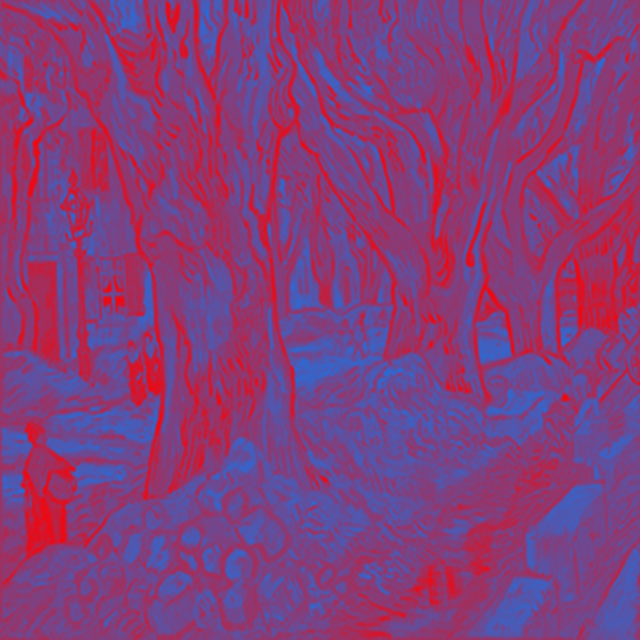

In [48]:
from PIL import Image, ImageOps
im = Image.open("crawler1/0010van_gogh.jpg").convert('LA').convert('RGB')
im.save('junk/gray_van_gogh.jpg')
im = Image.open("junk/gray_van_gogh.jpg").convert('L')
#im.load() # make sure it's loaded into memory
assert im.mode == "L"
# create a lookup table (r, g, b, r, g, b, r, g, b, ...)
lut = []
for i in range(256):
    lut.extend([255-i, i/2, i])
im.putpalette(lut)
assert im.mode == "P" # now has a palette
im.save("out.gif")
im

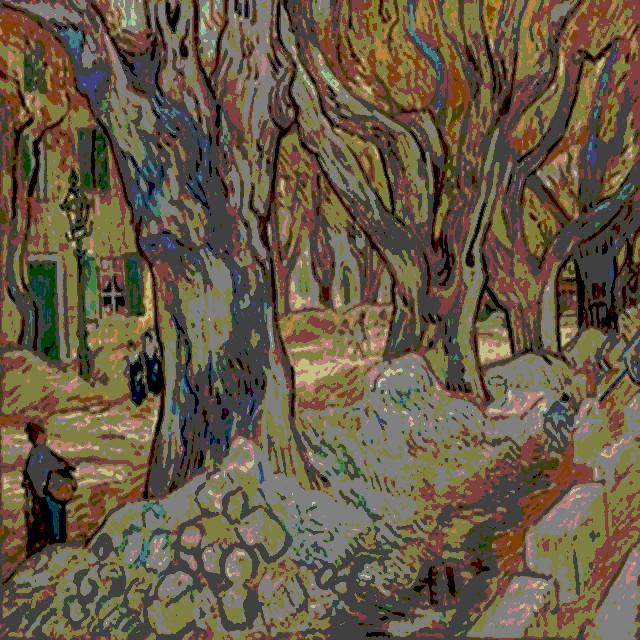

In [59]:
original_path = 'junk/posterize_gogh.jpg'
original = Image.open(original_path)
original

junk/PILStuff20170826172809.png


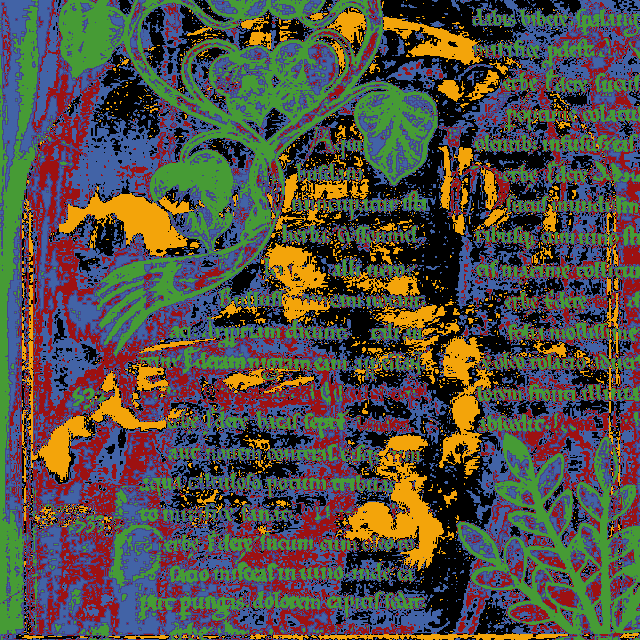

In [257]:
from PIL import Image, ImageFilter
import os
import cv2
import random
import time
path = r"AUGposT/"
#path = r"crawler4/"
base_image = random.choice([
    x for x in os.listdir(path)
    if os.path.isfile(os.path.join(path, x))
    ])
filename0=(path+base_image)
im = Image.open(filename0)
imP = im.convert('RGB').convert('P', palette=Image.ADAPTIVE, colors=6)
imP.putpalette([
     243,164,10,
     157,17,17,
     66,99,166,
     70,155,53,
     0,0,0,
     70,70,140,
     ])


im2 = Image.open(filename0)
mask0 = im2.convert('L') # need a greyscale image to create a mask
mask = Image.eval(mask0, lambda a: 255 if a == 0 else 0)
mask = mask.filter(ImageFilter.MinFilter(3))
imP.paste(2, mask) # Paste the color of index 2 using image2 as a mask
filename = time.strftime("junk/PILStuff%Y%m%d%H%M%S.png")
imP.save(filename)

print filename
imP

# USE FOR EXPERIMENT

In [259]:
from PIL import Image, ImageDraw, ImagePalette
list1 =  """ [0,0,0, 255,0,0, 0,255,0, 0,0,255, 125,125,125, 255,255,255,]
"""
palette = '%s' % (list1)
print palette

 [0,0,0, 255,0,0, 0,255,0, 0,0,255, 125,125,125, 255,255,255,]



from bitarray import bitarray
help(bitarray)

junk/PILStuff20170826172423.png


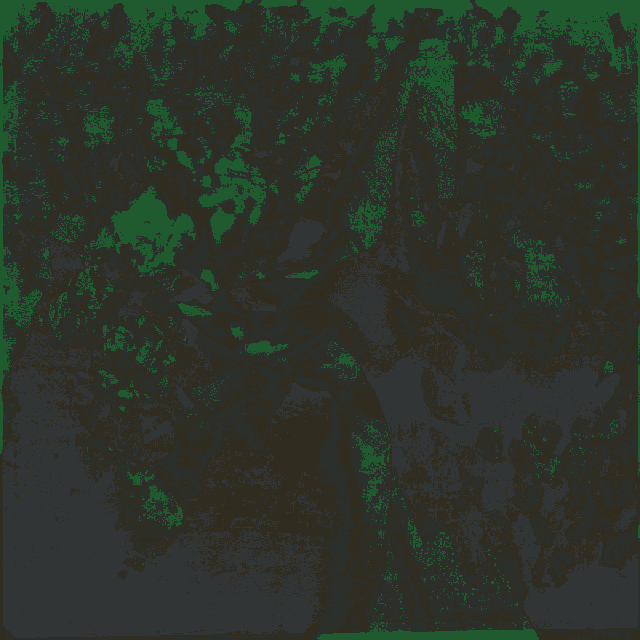

In [255]:
from PIL import Image, ImageFilter
import os
import cv2
import random
import time
path = r"AUGposT/"
#path = r"crawler4/"
base_image = random.choice([
    x for x in os.listdir(path)
    if os.path.isfile(os.path.join(path, x))
    ])
filename0=(path+base_image)
im = Image.open(filename0)
imP = im.convert('RGB').convert('P', palette=Image.ADAPTIVE, colors=6)
#imP.putpalette([
#     243,164,10,
#     157,17,17,
#     66,99,166,
#     70,155,53,
#     0,0,0,
#     70,70,140,
#     ])

list1 =  """ [0,0,0, 255,0,0, 0,255,0, 0,0,255, 125,125,125, 255,255,255,]
"""
imP.putpalette('%s' % (list1))




im2 = Image.open(filename0)
mask0 = im2.convert('L') # need a greyscale image to create a mask
mask = Image.eval(mask0, lambda a: 255 if a == 0 else 0)
mask = mask.filter(ImageFilter.MinFilter(3))
imP.paste(2, mask) # Paste the color of index 2 using image2 as a mask
filename = time.strftime("junk/PILStuff%Y%m%d%H%M%S.png")
imP.save(filename)

print filename
imP

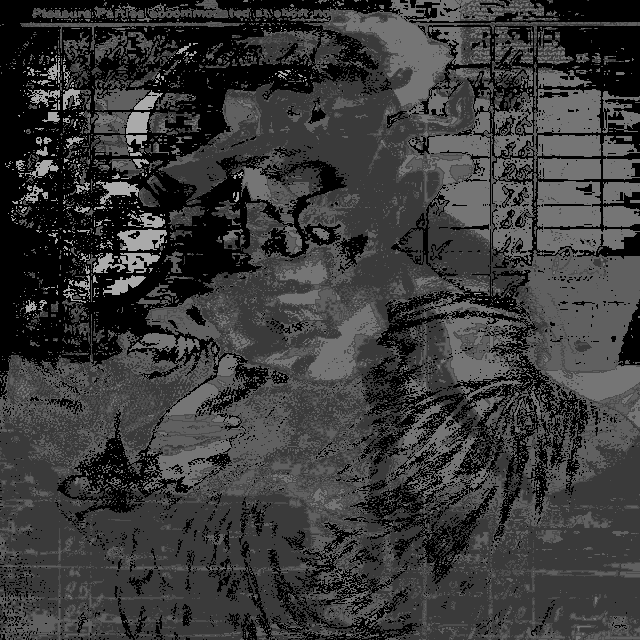

In [126]:
# appears to be NON RGB
from PIL import Image, ImageMath
im1 = Image.open("junk/PILStuff20170826124220.png").convert("L")
im2 = Image.open("junk/YTUG.png").convert("L")
#out = ImageMath.eval("convert(min(a, b), 'RGB')", a=im1, b=im2)
out = ImageMath.eval("convert(min(a, b), 'L')", a=im1, b=im2)
out.save("junk/newResult2.jpg")
out

#  ----- IMPORTANT BREAK THROUGH -----

In [215]:
import numpy as np
from PIL import Image

def palette(img):
    """
    Return palette in descending order of frequency
    """
    arr = np.asarray(img)
    palette, index = np.unique(asvoid(arr).ravel(), return_inverse=True)
    palette = palette.view(arr.dtype).reshape(-1, arr.shape[-1])
    count = np.bincount(index)
    order = np.argsort(count)
    return palette[order[::-1]]

def asvoid(arr):
    """View the array as dtype np.void (bytes)
    This collapses ND-arrays to 1D-arrays, so you can perform 1D operations on them.
    http://stackoverflow.com/a/16216866/190597 (Jaime)
    http://stackoverflow.com/a/16840350/190597 (Jaime)
    Warning:
    >>> asvoid([-0.]) == asvoid([0.])
    array([False], dtype=bool)
    """
    arr = np.ascontiguousarray(arr)
    return arr.view(np.dtype((np.void, arr.dtype.itemsize * arr.shape[-1])))


img = Image.open('junk/PILStuff20170826142340.png', 'r').convert('RGB')
print(palette(img))

[[32 91 48]
 [50 53 53]
 [48 44 32]
 [44 48 44]]


In [4]:
#https://codegolf.stackexchange.com/questions/33172/american-gothic-in-the-palette-of-mona-lisa-rearrange-the-pixels
from PIL import Image

def countColors(image):
    colorCounts = {}
    for color in image.getdata():
        if color in colorCounts:
            colorCounts[color] += 1
        else:
            colorCounts[color] = 1
    return colorCounts

def colorDist(c1, c2):
    def ds(c1, c2, i):
        return (c1[i] - c2[i])**2
    return (ds(c1, c2, 0) + ds(c1, c2, 1) + ds(c1, c2, 2))**0.5

def findClosestColor(palette, color):
    closest = None
    minDist = (3*255**2)**0.5
    for c in palette:
        dist = colorDist(color, c)
        if dist < minDist:
            minDist = dist
            closest = c
    return closest

def removeColor(palette, color):
    if palette[color] == 1:
        del palette[color]
    else:
        palette[color] -= 1

def go(paletteFile, sourceFile):
    palette = countColors(Image.open(paletteFile).convert('RGB'))
    source = Image.open(sourceFile).convert('RGB')
    copy = Image.new('RGB', source.size)
    w, h = copy.size

    for x in range(w):
        for y in range(h):
            c = findClosestColor(palette, source.getpixel((x, y)))
            removeColor(palette, c)
            copy.putpixel((x, y), c)
        #print x #print progress
    copy.save('copy.png')

#the respective file paths go here
go('crawler1/0032sexy.jpg', 'crawler1/0032myth.jpg')
!showme copy.png

KeyboardInterrupt: 

In [263]:
from PIL import Image
import time
def makePixelList(img):
    l = []
    for x in range(img.size[0]):
        for y in range(img.size[1]):
            l.append((x,y))
    return l

lsrc = makePixelList(src_handle)
ldst = makePixelList(dst_handle)

def sortAndDivide(coordlist,pixelimage,channel): #core
    global src,dst,n
    retlist = []
    #sort
    coordlist.sort(key=lambda t: pixelimage[t][channel])
    #divide
    partitionLength = int(len(coordlist)/n)
    if partitionLength <= 0:
        partitionLength = 1
    if channel < 2:
        for i in range(0,len(coordlist),partitionLength):
            retlist += sortAndDivide(coordlist[i:i+partitionLength],pixelimage,channel+1)
    else:
        retlist += coordlist
    return retlist

print(src[lsrc[0]])

lsrc = sortAndDivide(lsrc,src,0)
ldst = sortAndDivide(ldst,dst,0)

for i in range(len(ldst)):
    dst[ldst[i]] = src[lsrc[i]]

#dst_handle.save("exchange"+str(src_index)+str(dst_index)+".png")
filename = time.strftime("junk/exchange%Y%m%d%H%M%S.png")
dst_handle.save(filename)
print filename


(124, 96, 171)
junk/exchange20170826173902.png
No image data


In [264]:
!showme junk/exchange20170826173902.png

In [49]:
from colorthief import ColorThief
import string
import re
color_thief = ColorThief('photos/0028xxx.jpg')
# build a color palette
palette = color_thief.get_palette(color_count=6)
name = " ".join(str(x) for x in palette)
table = string.maketrans( ' ', ' ' )
print name.translate(table,"(){}<>")

130, 211, 226 215, 239, 236 38, 123, 212 121, 176, 95 74, 140, 212 28, 42, 60


In [298]:
from PIL import Image, ImageFilter
import colorsys

def getPixels(image):
    width, height = image.size
    pixels = []
    for x in range(width):
        for y in range(height):
            pixels.append([(x,y), image.getpixel((x,y))])
    return pixels

def yiq(pixel):
    # y is the luminance
    y,i,q = colorsys.rgb_to_yiq(pixel[1][0], pixel[1][6], pixel[1][7])
    # Change the weights accordingly to get different results
    return 10*y + 0*i + 0*q

# Open the images
source  = Image.open('junk/aa.png')
pallete = Image.open('junk/bb.png')

# Sharpen the source... It won't affect the palette anyway =D
source = source.filter(ImageFilter.SHARPEN)

# Sort the two lists by luminance
sourcePixels  = sorted(getPixels(source),  key=yiq)
palletePixels = sorted(getPixels(pallete), key=yiq)

copy = Image.new('RGB', source.size)

# Iterate through all the coordinates of source
# And set the new color
index = 0
for sourcePixel in sourcePixels:
    copy.putpixel(sourcePixel[0], palletePixels[index][8])
    index += 1

# Save the result
copy.save('junk/wwcopy.png')

IndexError: tuple index out of range

In [ ]:
imP = im.convert('RGB').convert('P', palette=Image.ADAPTIVE, colors=6)

In [57]:
from PIL import Image, ImageOps, ImagePalette

imm = Image.open("photos/0028xxx.jpg")
img2 = imm.getdata()
im3 = Image.open("photos/003.jpg").convert('L')

imP = im3.convert('RGB').convert('P', palette=Image.ADAPTIVE, colors=6)
imP.putpalette(img2)
#im3.putpalette(img2, '64')
imP


TypeError: an integer is required

junk/PILStuff20180909143744.png


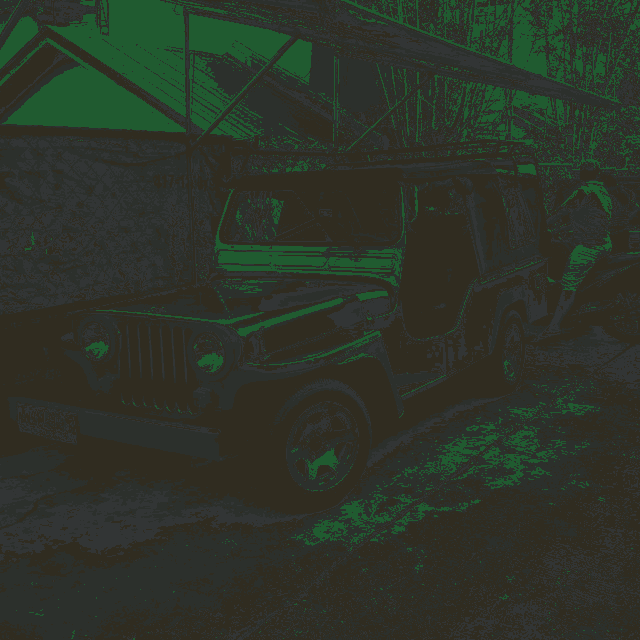

In [56]:
from PIL import Image, ImageFilter
import os
import cv2
import random
import time
path = r"photos/"
#path = r"crawler4/"
base_image = random.choice([
    x for x in os.listdir(path)
    if os.path.isfile(os.path.join(path, x))
    ])
filename0=(path+base_image)
im = Image.open(filename0)
imP = im.convert('RGB').convert('P', palette=Image.ADAPTIVE, colors=6)

list1 =  """ [0,0,0, 255,0,0, 0,255,0, 0,0,255, 125,125,125, 255,255,255,]
"""
imP.putpalette('%s' % (list1))


im2 = Image.open(filename0)
mask0 = im2.convert('L') # need a greyscale image to create a mask
mask = Image.eval(mask0, lambda a: 255 if a == 0 else 0)
mask = mask.filter(ImageFilter.MinFilter(3))
imP.paste(2, mask) # Paste the color of index 2 using image2 as a mask
filename = time.strftime("junk/PILStuff%Y%m%d%H%M%S.png")
imP.save(filename)

print filename
imP

junk/PILStuff20170826141511.png


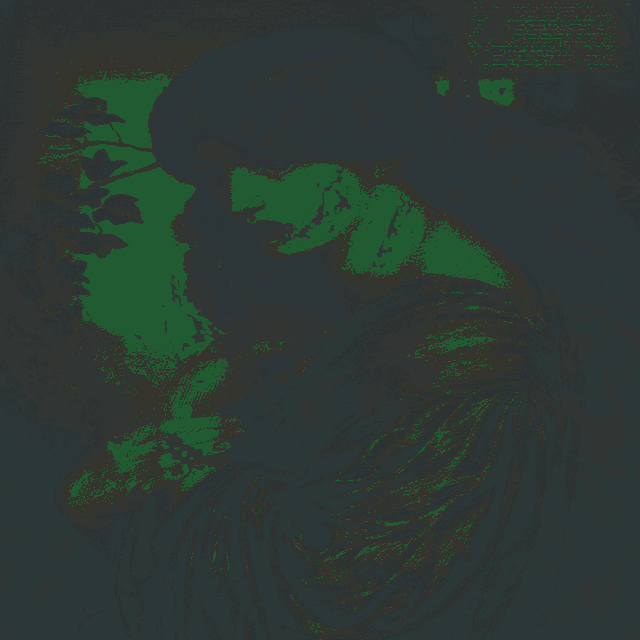

In [187]:
from PIL import Image, ImageFilter
import os
import cv2
import random
import time
"""
path = r"AUGposT/"
#path = r"crawler4/"
base_image = random.choice([
    x for x in os.listdir(path)
    if os.path.isfile(os.path.join(path, x))
    ])
filename0=(path+base_image)
im = Image.open(filename0)
"""
im= Image.open('crawler1/0032myth.jpg')
imP = im.convert('RGB').convert('P', palette=Image.ADAPTIVE, colors=6)

list1 =  """ [244,164,12,68,87,154,68,156,52,156,20,20,4,4,4,204,168,84,]
"""
imP.putpalette('%s' % (list1))

#name = 'marcog'
#number = 42
#print '%s %d' % (name, number)

#imP.putpalette(
#[244,164,12,68,87,154,68,156,52,156,20,20,4,4,4,204,168,84,]   
#)
# print "pasting at: (%s, %s)" % (paste_left, paste_top)
im2 = Image.open(filename0)
mask0 = im2.convert('L') # need a greyscale image to create a mask
mask = Image.eval(mask0, lambda a: 255 if a == 0 else 0)
mask = mask.filter(ImageFilter.MinFilter(3))
imP.paste(2, mask) # Paste the color of index 2 using image2 as a mask
filename = time.strftime("junk/PILStuff%Y%m%d%H%M%S.png")
imP.save(filename)

print filename
imP

In [ ]:
from PIL import Image
from optparse import OptionParser
def key_func(arr):
    # Sort the pixels by luminance
    r = 0.2126*arr[0] + 0.7152*arr[1] + 0.0722*arr[2]
    return r

def main():
    # Parse options from the command line
    parser = OptionParser()
    parser.add_option("-p", "--pixels", dest="pixels",
                      help="use pixels from FILE", metavar="FILE")
    parser.add_option("-i", "--input", dest="input", metavar="FILE",
                      help="recreate FILE")
    parser.add_option("-o", "--out", dest="output", metavar="FILE",
                      help="output to FILE", default="output.png")

    (options, args) = parser.parse_args()

    if not options.pixels or not options.input:
        raise Exception("Missing arguments. See help for more info.")

    # Load the images
    im1 = Image.open(options.pixels)
    im2 = Image.open(options.input)

    # Get the images into lists
    px1 = list(im1.getdata())
    px2 = list(im2.getdata())
    w1, h1 = im1.size
    w2, h2 = im2.size

    if w1*h1 != w2*h2:
        raise Exception("Images must have the same number of pixels.")

    # Sort the pixels lists by luminance
    px1_s = sorted(px1, key=key_func)
    px2_s = sorted(px2, key=key_func)

    # Create an array of nothing but black pixels
    arr = [(0, 0, 0)]*w2*h2

    # Create a dict that contains a list of locations with pixel value as key
    # This speeds up the process a lot, since before it was O(n^2)
    locations_cache = {}
    for index, val in enumerate(px2):
        v = str(val)
        if v in locations_cache:
            locations_cache[v].append(index)
        else:
            locations_cache[v] = [index]

    # Loop through each value of the sorted pixels
    for index, val in enumerate(px2_s):
        # Find the original location of the pixel
        # v = px2.index(val)
        v = locations_cache[str(val)].pop(0)
        # Set the value of the array at the given location to the pixel of the
        # equivalent luminance from the source image
        arr[v] = px1_s[index]
        # v2 = px1.index(px1_s[index])
        # Set the value of px2 to an arbitrary value outside of the RGB range
        # This prevents duplicate pixel locations
        # I would use "del px2[v]", but it wouldn't work for some reason
        px2[v] = (512, 512, 512)
        # px1[v2] = (512, 512, 512)
        # Print the percent progress
        print("%f%%" % (index/len(px2)*100))
        """if index % 500 == 0 or index == len(px2_s)-1:
            if h1 > h2:
                size = (w1+w2, h1)
            else:
                size = (w1+w2, h2)
            temp_im1 = Image.new("RGB", im2.size)
            temp_im1.putdata(arr)

            temp_im2 = Image.new("RGB", im1.size)
            temp_im2.putdata(px1)

            temp_im3 = Image.new("RGB", size)
            temp_im3.paste(temp_im1, (0, 0))
            temp_im3.paste(temp_im2, (w2, 0))
            temp_im3.save("still_frames/img_%04d.png" % (index/500))"""

    # Save the image
    im3 = Image.new('RGB', im2.size)
    im3.putdata(arr)
    im3.save(options.output)

if __name__ == '__main__':
    main()


In [188]:
!showme junk/PILStuff20170826124220.png

In [189]:
from colorthief import ColorThief
import string
import re
color_thief = ColorThief('junk/PILStuff20170826124220.png')
# build a color palette
palette = color_thief.get_palette(color_count=6)
name = " ".join(str(x) for x in palette)
table = string.maketrans( '', '' )
newT = name.translate(table,",(){}<>")
palette = newT.replace(" ", ",")
print palette

244,164,12,68,87,154,68,156,52,156,20,20,4,4,4,204,168,84


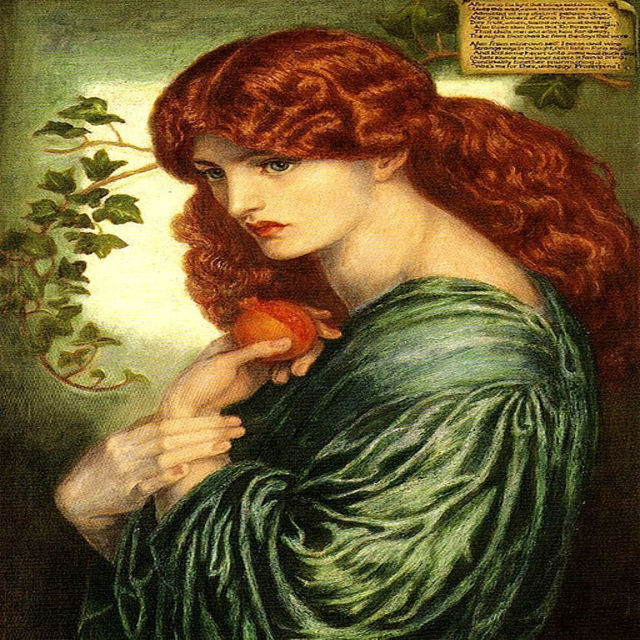

In [166]:
bmp = Image.open('crawler1/0032myth.jpg')
bmp

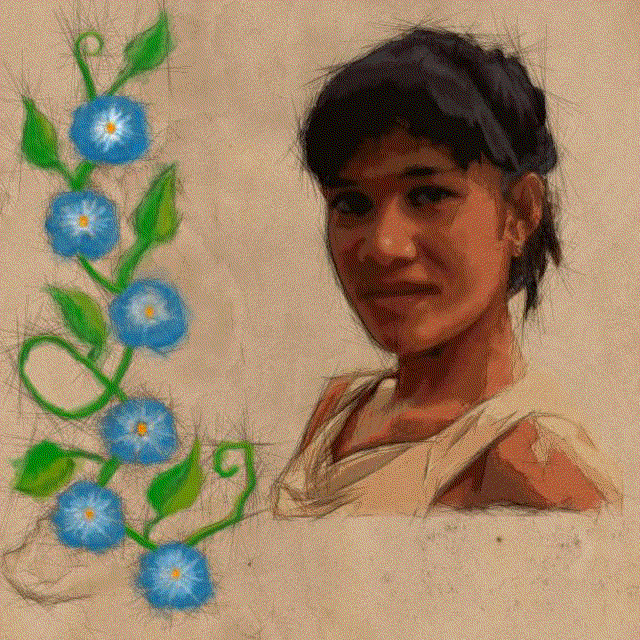

In [59]:
from PIL import Image, ImageFilter
import os
import cv2
import numpy as np
import random
import time
bmp = Image.open('photos/0037xxx.jpg')
bmp_P_web = bmp.convert('P', palette=Image.WEB)
web_palette = bmp_P_web.getpalette()  # <---
data = np.array(bmp_P_web)

# second part
bmp = Image.fromarray(data)
bmp.putpalette(web_palette) 
bmp

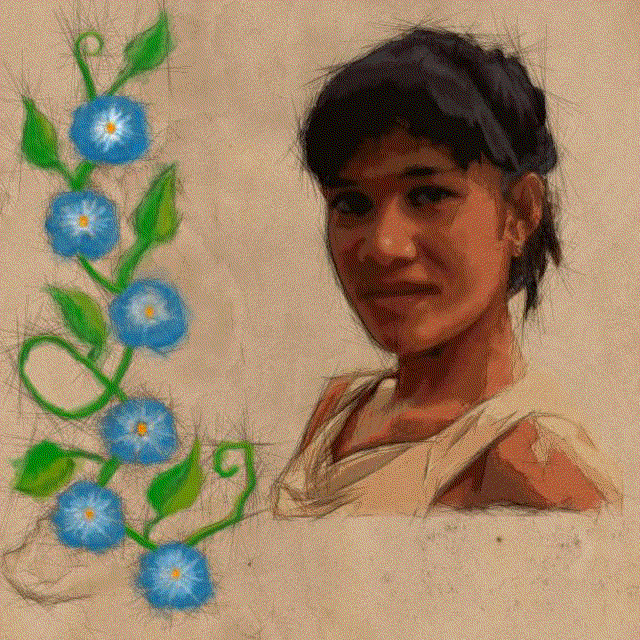

In [60]:
from PIL import Image, ImageFilter
import os
import cv2
import random
import time
list1="""
[244,164,12,68,87,154,68,156,52,156,20,20,4,4,4,204,168,84]
"""


bmp = Image.open('photos/0037xxx.jpg')
bmp_P_web = bmp.convert('P', palette=Image.WEB)
web_palette = bmp_P_web.getpalette()  # <---
data = np.array(bmp_P_web)

# second part
bmp = Image.fromarray(data)
bmp.putpalette(web_palette) 
bmp

In [63]:
# first part
#bmp = Image.open('junk/PILStuff20170826124220.png')
bmp = Image.open('photos/0037xxx.jpg')
list1="""
[244,164,12,68,87,154,68,156,52,156,20,20,4,4,4,204,168,84]
"""
bmp_P_web = bmp.convert('P', palette=list1)
web_palette = bmp_P_web.getpalette() 
# <---
data = np.array(bmp_P_web)
data2 = np.array(list1)
print data2

# second part
#bmp = Image.fromarray(data2)
bmp.putpalette(data2) 
bmp


[244,164,12,68,87,154,68,156,52,156,20,20,4,4,4,204,168,84]



ValueError: illegal image mode

In [169]:
import PIL
from PIL import Image
import numpy as np
#web_palette = np.zeros(3*256, int)
web_palette = np.zeros(3*256, int)
print web_palette

[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 

In [172]:
import PIL
from PIL import Image
import numpy as np
#web_palette = np.zeros(3*256, int)
web_palette = np.zeros(3*256, int)
web_palette[30:-90] = np.mgrid[0:256:51, 0:256:51, 0:256:51].ravel('F')
pal = web_palette[30:-90] 
print pal

[  0   0   0  51   0   0 102   0   0 153   0   0 204   0   0 255   0   0
   0  51   0  51  51   0 102  51   0 153  51   0 204  51   0 255  51   0
   0 102   0  51 102   0 102 102   0 153 102   0 204 102   0 255 102   0
   0 153   0  51 153   0 102 153   0 153 153   0 204 153   0 255 153   0
   0 204   0  51 204   0 102 204   0 153 204   0 204 204   0 255 204   0
   0 255   0  51 255   0 102 255   0 153 255   0 204 255   0 255 255   0
   0   0  51  51   0  51 102   0  51 153   0  51 204   0  51 255   0  51
   0  51  51  51  51  51 102  51  51 153  51  51 204  51  51 255  51  51
   0 102  51  51 102  51 102 102  51 153 102  51 204 102  51 255 102  51
   0 153  51  51 153  51 102 153  51 153 153  51 204 153  51 255 153  51
   0 204  51  51 204  51 102 204  51 153 204  51 204 204  51 255 204  51
   0 255  51  51 255  51 102 255  51 153 255  51 204 255  51 255 255  51
   0   0 102  51   0 102 102   0 102 153   0 102 204   0 102 255   0 102
   0  51 102  51  51 102 102  51 102 153  51 102 20

In [64]:
import PIL
from PIL import Image
import numpy as np
#web_palette = np.zeros(3*256, int)
web_palette = np.zeros(3*256, int)
web_palette[30:-90] = np.mgrid[0:256:51, 0:256:51, 0:256:51].ravel('F')
#bmp = Image.open('AUGpost/20170825114404.jpg')
bmp = Image.open(''photos/0037xxx.jpg')
list1 = """
[  0   0   0  51   0   0 102   0   0 153   0   0 204   0   0 255   0   0
   0  51   0  51  51   0 102  51   0 153  51   0 204  51   0 255  51   0
   0 102   0  51 102   0 102 102   0 153 102   0 204 102   0 255 102   0
   0 153   0  51 153   0 102 153   0 153 153   0 204 153   0 255 153   0
   0 204   0  51 204   0 102 204   0 153 204   0 204 204   0 255 204   0
   0 255   0  51 255   0 102 255   0 153 255   0 204 255   0 255 255   0
   0   0  51  51   0  51 102   0  51 153   0  51 204   0  51 255   0  51
   0  51  51  51  51  51 102  51  51 153  51  51 204  51  51 255  51  51
   0 102  51  51 102  51 102 102  51 153 102  51 204 102  51 255 102  51
   0 153  51  51 153  51 102 153  51 153 153  51 204 153  51 255 153  51
   0 204  51  51 204  51 102 204  51 153 204  51 204 204  51 255 204  51
   0 255  51  51 255  51 102 255  51 153 255  51 204 255  51 255 255  51
   0   0 102  51   0 102 102   0 102 153   0 102 204   0 102 255   0 102
   0  51 102  51  51 102 102  51 102 153  51 102 204  51 102 255  51 102
   0 102 102  51 102 102 102 102 102 153 102 102 204 102 102 255 102 102
   0 153 102  51 153 102 102 153 102 153 153 102 204 153 102 255 153 102
   0 204 102  51 204 102 102 204 102 153 204 102 204 204 102 255 204 102
   0 255 102  51 255 102 102 255 102 153 255 102 204 255 102 255 255 102
   0   0 153  51   0 153 102   0 153 153   0 153 204   0 153 255   0 153
   0  51 153  51  51 153 102  51 153 153  51 153 204  51 153 255  51 153
   0 102 153  51 102 153 102 102 153 153 102 153 204 102 153 255 102 153
   0 153 153  51 153 153 102 153 153 153 153 153 204 153 153 255 153 153
   0 204 153  51 204 153 102 204 153 153 204 153 204 204 153 255 204 153
   0 255 153  51 255 153 102 255 153 153 255 153 204 255 153 255 255 153
   0   0 204  51   0 204 102   0 204 153   0 204 204   0 204 255   0 204
   0  51 204  51  51 204 102  51 204 153  51 204 204  51 204 255  51 204
   0 102 204  51 102 204 102 102 204 153 102 204 204 102 204 255 102 204
   0 153 204  51 153 204 102 153 204 153 153 204 204 153 204 255 153 204
   0 204 204  51 204 204 102 204 204 153 204 204 204 204 204 255 204 204
   0 255 204  51 255 204 102 255 204 153 255 204 204 255 204 255 255 204
   0   0 255  51   0 255 102   0 255 153   0 255 204   0 255 255   0 255
   0  51 255  51  51 255 102  51 255 153  51 255 204  51 255 255  51 255
   0 102 255  51 102 255 102 102 255 153 102 255 204 102 255 255 102 255
   0 153 255  51 153 255 102 153 255 153 153 255 204 153 255 255 153 255
   0 204 255  51 204 255 102 204 255 153 204 255 204 204 255 255 204 255
   0 255 255  51 255 255 102 255 255 153 255 255 204 255 255 255 255 255]
"""

bmp_P_web = bmp.convert('P', palette=list1)
web_palette = bmp_P_web.getpalette()  # <---
data = np.array(bmp_P_web)

# second part
bmp = Image.fromarray(data)
bmp.putpalette(web_palette)  # <---



bmp

SyntaxError: invalid syntax (<ipython-input-64-258c84855982>, line 8)

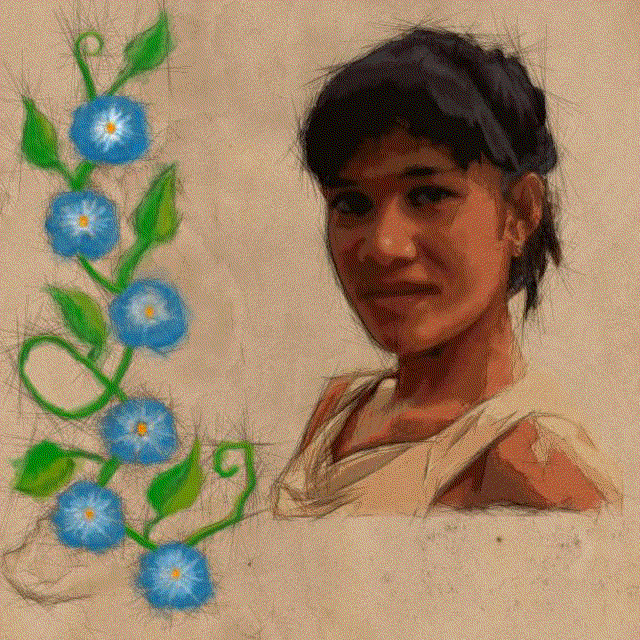

In [66]:
import PIL
from PIL import Image
import numpy as np
#web_palette = np.zeros(3*256, int)
web_palette = np.zeros(3*256, int)
web_palette[30:-90] = np.mgrid[0:256:51, 0:256:51, 0:256:51].ravel('F')
#bmp = Image.open('AUGpost/20170825114404.jpg')
bmp = Image.open('photos/0037xxx.jpg')
list1 = """
[  0   0   0  51   0   0 102   0   0 153   0   0 204   0   0 255   0   0
   0  51   0  51  51   0 102  51   0 153  51   0 204  51   0 255  51   0
   0 102   0  51 102   0 102 102   0 153 102   0 204 102   0 255 102   0
   0 153   0  51 153   0 102 153   0 153 153   0 204 153   0 255 153   0
   0 204   0  51 204   0 102 204   0 153 204   0 204 204   0 255 204   0
   0 255   0  51 255   0 102 255   0 153 255   0 204 255   0 255 255   0
   0   0  51  51   0  51 102   0  51 153   0  51 204   0  51 255   0  51
   0  51  51  51  51  51 102  51  51 153  51  51 204  51  51 255  51  51
   0 102  51  51 102  51 102 102  51 153 102  51 204 102  51 255 102  51
   0 153  51  51 153  51 102 153  51 153 153  51 204 153  51 255 153  51
   0 204  51  51 204  51 102 204  51 153 204  51 204 204  51 255 204  51
   0 255  51  51 255  51 102 255  51 153 255  51 204 255  51 255 255  51
   0   0 102  51   0 102 102   0 102 153   0 102 204   0 102 255   0 102
   0  51 102  51  51 102 102  51 102 153  51 102 204  51 102 255  51 102
   0 102 102  51 102 102 102 102 102 153 102 102 204 102 102 255 102 102
   0 153 102  51 153 102 102 153 102 153 153 102 204 153 102 255 153 102
   0 204 102  51 204 102 102 204 102 153 204 102 204 204 102 255 204 102
   0 255 102  51 255 102 102 255 102 153 255 102 204 255 102 255 255 102
   0   0 153  51   0 153 102   0 153 153   0 153 204   0 153 255   0 153
   0  51 153  51  51 153 102  51 153 153  51 153 204  51 153 255  51 153
   0 102 153  51 102 153 102 102 153 153 102 153 204 102 153 255 102 153
   0 153 153  51 153 153 102 153 153 153 153 153 204 153 153 255 153 153
   0 204 153  51 204 153 102 204 153 153 204 153 204 204 153 255 204 153
   0 255 153  51 255 153 102 255 153 153 255 153 204 255 153 255 255 153
   0   0 204  51   0 204 102   0 204 153   0 204 204   0 204 255   0 204
   0  51 204  51  51 204 102  51 204 153  51 204 204  51 204 255  51 204
   0 102 204  51 102 204 102 102 204 153 102 204 204 102 204 255 102 204
   0 153 204  51 153 204 102 153 204 153 153 204 204 153 204 255 153 204
   0 204 204  51 204 204 102 204 204 153 204 204 204 204 204 255 204 204
   0 255 204  51 255 204 102 255 204 153 255 204 204 255 204 255 255 204
   0   0 255  51   0 255 102   0 255 153   0 255 204   0 255 255   0 255
   0  51 255  51  51 255 102  51 255 153  51 255 204  51 255 255  51 255
   0 102 255  51 102 255 102 102 255 153 102 255 204 102 255 255 102 255
   0 153 255  51 153 255 102 153 255 153 153 255 204 153 255 255 153 255
   0 204 255  51 204 255 102 204 255 153 204 255 204 204 255 255 204 255
   0 255 255  51 255 255 102 255 255 153 255 255 204 255 255 255 255 255]
"""

bmp_P_web = bmp.convert('P', palette=list1)
web_palette = bmp_P_web.getpalette()  # <---
data = np.array(bmp_P_web)

# second part
bmp = Image.fromarray(data)
bmp.putpalette(web_palette)  # <---



bmp

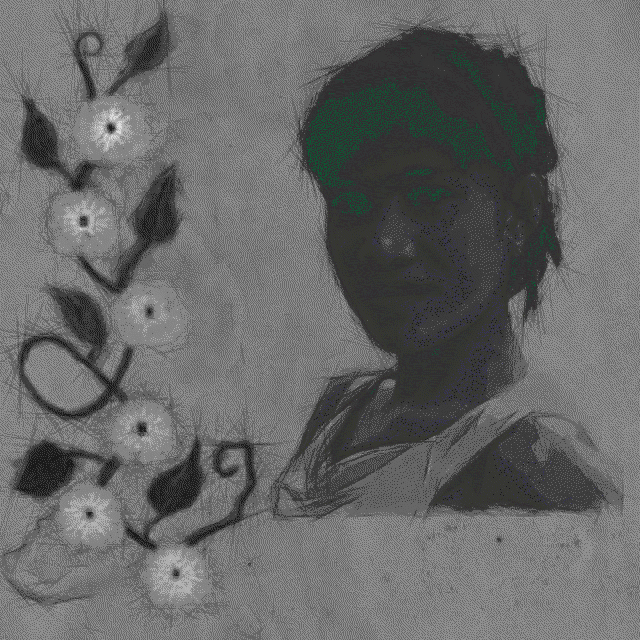

In [67]:
# first part
#bmp = Image.open('junk/PILStuff20170826124220.png')
bmp = Image.open('photos/0037xxx.jpg')
list1="""
[244,164,12,68,87,154,68,156,52,156,20,20,4,4,4,204,168,84]
"""
bmp_P_web = bmp.convert('P', palette=list1)
web_palette = bmp_P_web.getpalette() 
# <---
data = np.array(bmp_P_web)

#putpalette(data, rawmode='RGB')
# second part
bmp = Image.fromarray(data)
bmp.putpalette(list1, rawmode='RGB') 
bmp

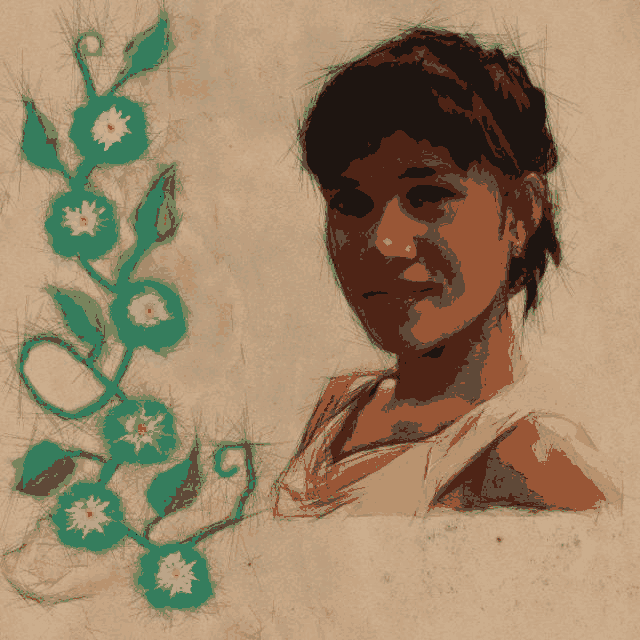

In [68]:
# Works Fine
import PIL
from PIL import Image
file='photos/0037xxx.jpg'
im = Image.open(file)
im_web = im.convert("P")
im_256 = im.convert("P", palette=PIL.Image.ADAPTIVE, colors=256)
im_16 = im.convert("P", palette=PIL.Image.ADAPTIVE, colors=16)
im_16

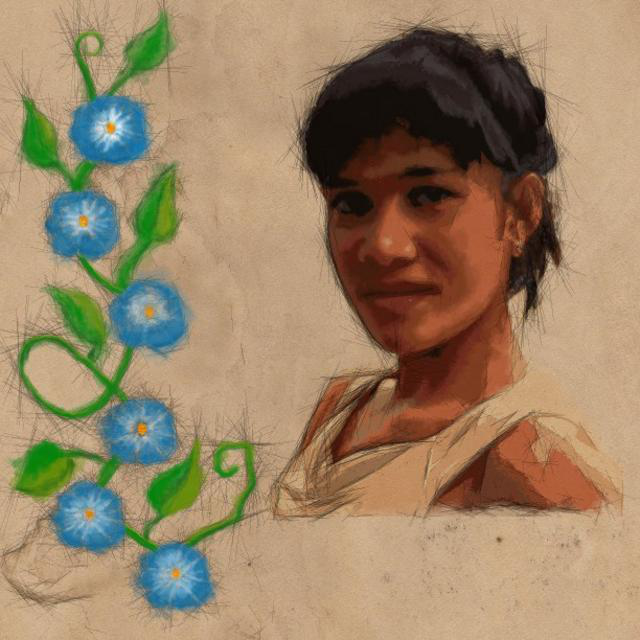

In [69]:
# Works Fine
import PIL
from PIL import Image
file="photos/0037xxx.jpg"
im = Image.open(file)
im2 = im.convert("P")
list1 =  """ 123,32,134, 23,185,25, 124,45,45, 273,128,12,
"""
im_16 = im.convert(mode=None, matrix=None, dither=None, palette=list1, colors=4)

#im_16 = im2.convert("P", palette=list, colors=2)
im_16

In [88]:
from __future__ import division
from PIL import Image
original_path="/home/jack/Desktop/deep-dream-generator/notebooks/bugs/DemonologyMagic/8405901824_5ff32f4bd8_o-540x362.jpg"
original = Image.open(original_path)
palette = original.getpalette()
print palette

None


In [134]:
list1 =  """ 123,32,134, 23,185,25, 124,45,45, 273,128,12,
"""

print list1

 123,32,134, 23,185,25, 124,45,45, 273,128,12,



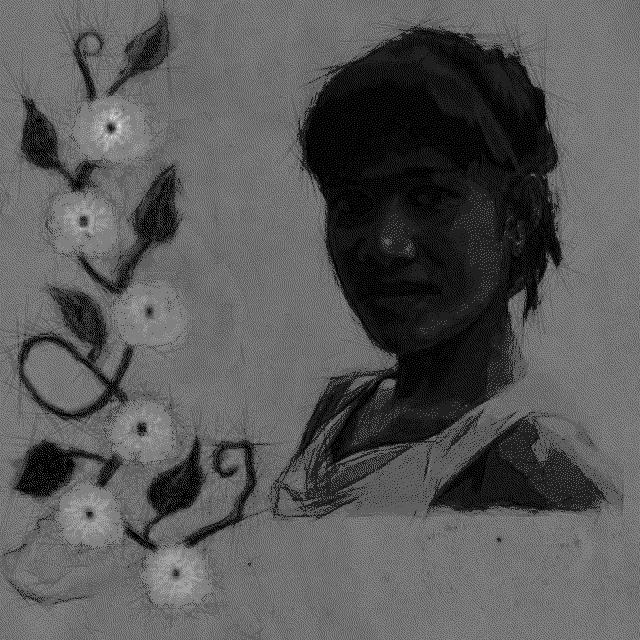

In [71]:
from __future__ import division
from PIL import Image

palette = []
levels = 8
stepsize = 256 // levels
for i in range(256):
    v = i // stepsize * stepsize
    palette.extend((v, v, v))

assert len(palette) == 768
original_path="photos/0037xxx.jpg"
original = Image.open(original_path)
converted = Image.new('P', original.size)
converted.putpalette(palette)
converted.paste(original, (0, 0))
#converted.show()
converted

In [95]:
from PIL import Image,ImageOps,ImagePalette
original_path="/home/jack/Desktop/deep-dream-generator/notebooks/bugs/DemonologyMagic/8405901824_5ff32f4bd8_o-540x362.jpg"
im = Image.open(original_path)
ni = ImagePalette(im)

TypeError: 'module' object is not callable

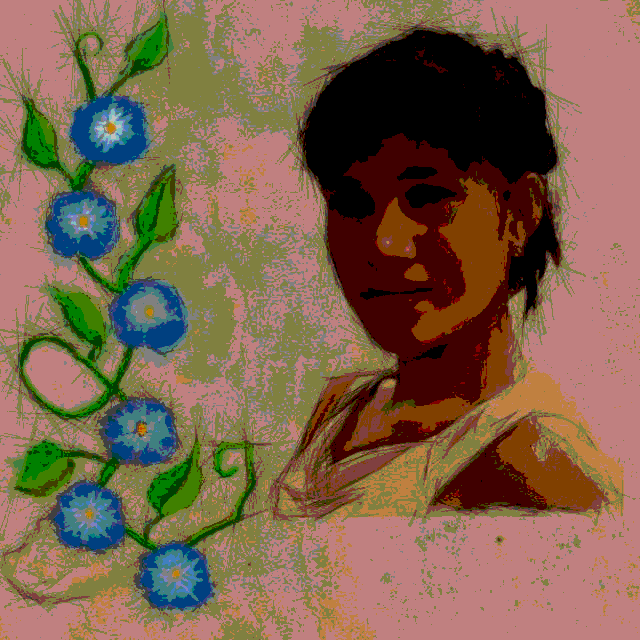

In [73]:
from PIL import Image,ImageOps
im = Image.open("photos/0037xxx.jpg")
gray = ImageOps.posterize(im, 2)
gray.save("junk/posterize_0037.jpg")
gray

In [ ]:
# ImageOps.
def _border(border):
def _color(color, mode):
def _lut(image, lut):
def autocontrast(image, cutoff=0, ignore=None):
def colorize(image, black, white):
def crop(image, border=0):
def deform(image, deformer, resample=Image.BILINEAR):
def equalize(image, mask=None):
def expand(image, border=0, fill=0):
def fit(image, size, method=Image.NEAREST, bleed=0.0, centering=(0.5, 0.5)):
def flip(image):
def grayscale(image):
def invert(image):
def mirror(image):
def posterize(image, bits):
def solarize(image, threshold=128):
def gaussian_blur(im, radius=None):
def unsharp_mask(im, radius=None, percent=None, threshold=None):

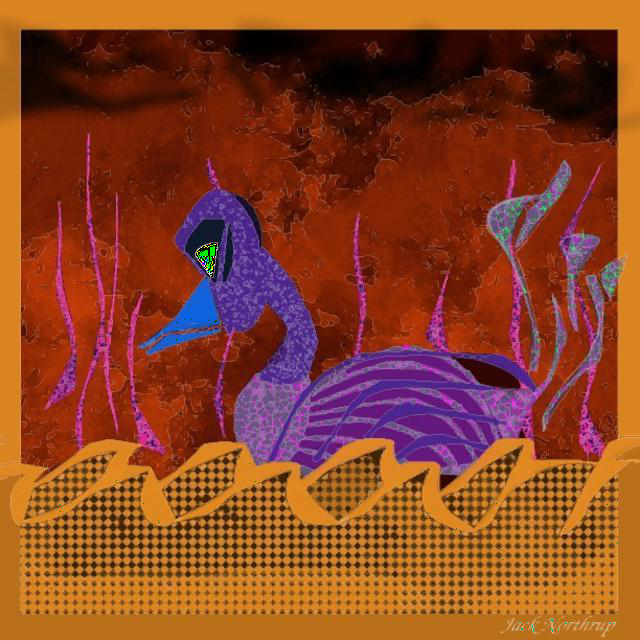

In [74]:
from PIL import Image,ImageOps
im = Image.open("photos/0028xxx.jpg")
solar=ImageOps.solarize(im, threshold=12)
solar

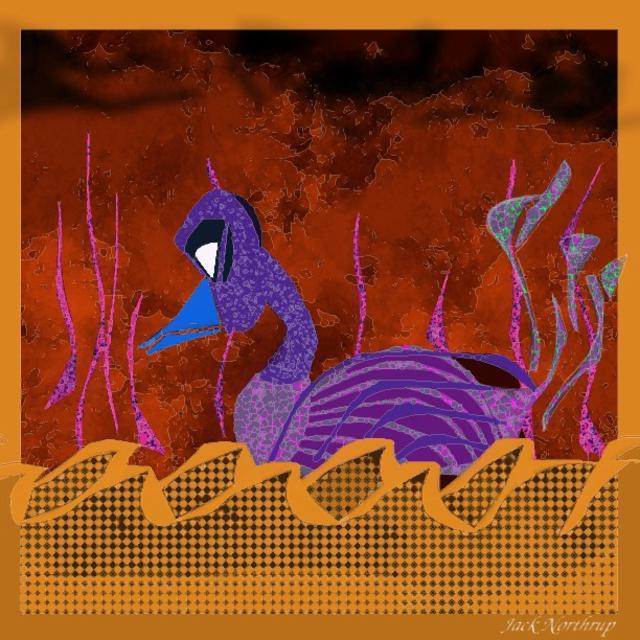

In [75]:
from PIL import Image,ImageOps
im = Image.open("photos/0028xxx.jpg")
gray = ImageOps.invert(im)
gray

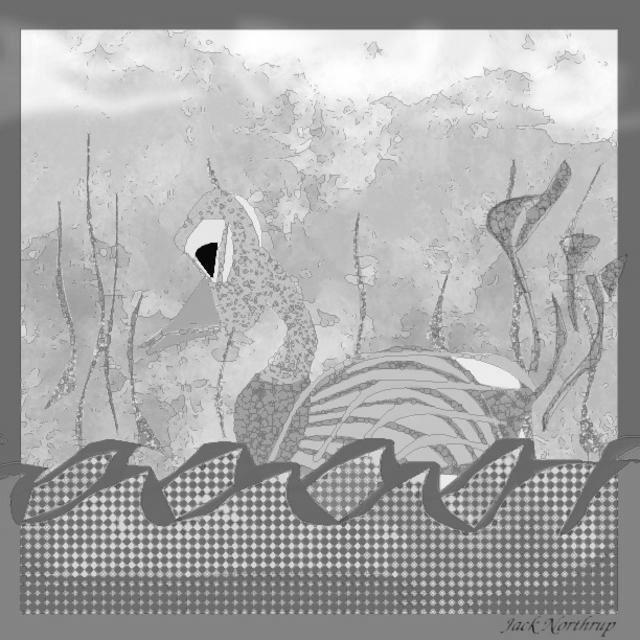

In [76]:
from PIL import Image,ImageOps
im = Image.open("photos/0028xxx.jpg")
gray = ImageOps.grayscale(im)
gray

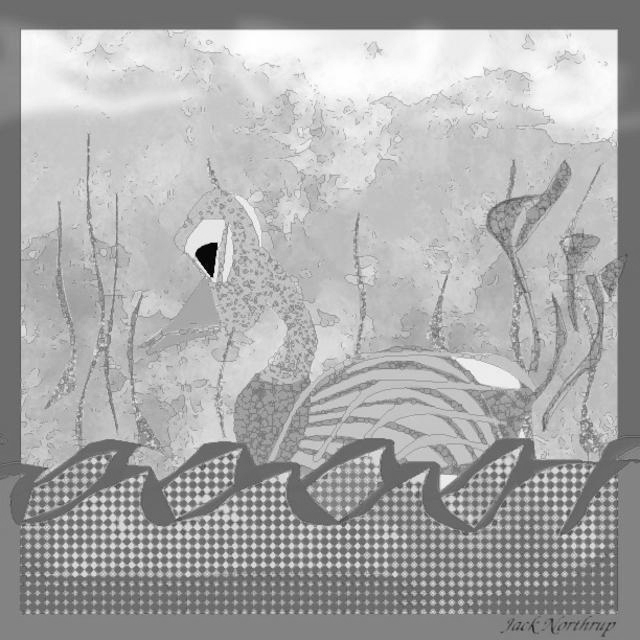

In [78]:
from PIL import Image
im = Image.open("photos/0028xxx.jpg").convert('LA').convert('RGB')
im.save('junk/gray_0028xxx.jpg')
im

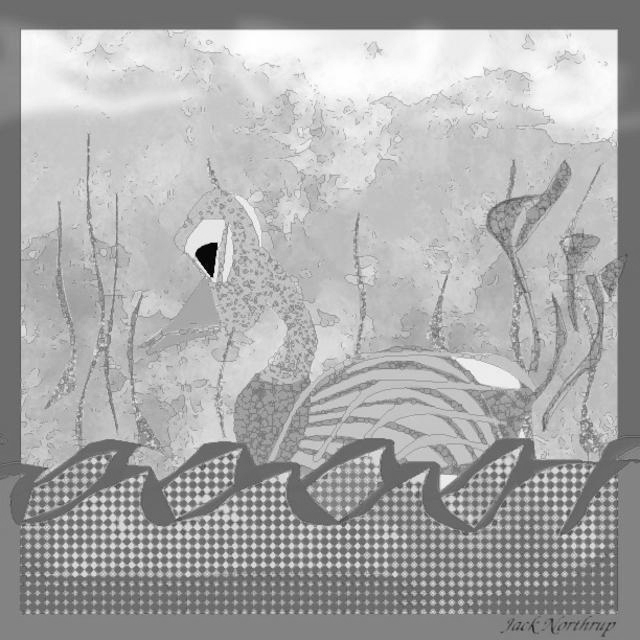

In [77]:
from PIL import Image
im = Image.open("photos/0028xxx.jpg").convert('LA').convert('RGB')
im.load() # make sure it's loaded into memory
im

In [28]:
from PIL import Image
Bp=Image.open("BorgPalette.jpg")
width, height = Bp.size

wc = width/2
hc =height/2
w1 = (width-wc)/2
w2 = (width-w1)/2
#     (1920-1200)/2, 1920-((1920-1200)/2)
print (width-wc)/2, width-((width-wc)/2)

480 1440


In [46]:
%%writefile resize640.py
#!/home/jack/anaconda2/bin
from PIL import Image
import sys
sys.argv
def resize640(image, output):
    Bp=Image.open(image)
    width, height = Bp.size
    w1=int((width-height)/2)
    w2 = int(width-w1)
    h1=height-height
    h2=height
    Cc=Bp.crop((w1,h1,w2,h2))
    result = Cc.resize((640,640), Image.NEAREST)
    result.save(output)
if __name__ == '__main__':
    image = sys.arg[1:]
    output = sys.arg[2:]
    resize640(image, output)        

Overwriting resize640.py


In [20]:
!python resize640.py 'BorgPalette.jpg', 'newBorgPalette.jpg'

Input file :  and output file: 


In [21]:
!showme newBorgPalette.jpg

No image data


In [28]:
%%writefile test002.py
#!/usr/bin/python
__author__ = 'Jack Northrup'
import sys, getopt
from PIL import Image 
image=''
output=''
 
###############################
# o == option
# a == argument passed to the o
###############################
# Cache an error with try..except 
# Note: options is the string of option letters that the script wants to recognize, with 
# options that require an argument followed by a colon (':') i.e. -i fileName
#
try:
    myopts, args = getopt.getopt(sys.argv[1:],"i:o:")
except getopt.GetoptError as e:
    print (str(e))
    print("Usage: %s -i input -o output" % sys.argv[0])
    sys.exit(2)

for o, a in myopts:
    if o == '-i':
        image=a
    elif o == '-o':
        output=a

# Display input and output file name passed as the args
print ("Input file : %s and output file: %s" % (image,output) )

Overwriting test002.py


In [38]:
%%writefile test002.py
#!/usr/bin/python
__author__ = 'Jack Northrup'
import sys, getopt
from PIL import Image 
image=''
output=''
 
###############################
# o == option
# a == argument passed to the o
###############################
# Cache an error with try..except 
# Note: options is the string of option letters that the script wants to recognize, with 
# options that require an argument followed by a colon (':') i.e. -i fileName
#
try:
    myopts, args = getopt.getopt(sys.argv[1:],"i:o:")
except getopt.GetoptError as e:
    print (str(e))
    print("Usage: %s -i input -o output" % sys.argv[0])
    sys.exit(2)

for o, a in myopts:
    if o == '-i':
        image=a
    elif o == '-o':
        output=a

def resize640(image, output):
    Bp=Image.open(image)
    width, height = Bp.size
    w1=(width-height)/2
    w2 = width-w1
    h1=height-height
    h2=height
    Cc=Bp.crop((w1,h1,w2,h2))
    result = Cc.resize((640,640), Image.NEAREST)
    result.save(output)
if __name__ == '__main__':
    resize640(image, output)
    print "CREATED: ",output

Overwriting test002.py


In [82]:
from PIL import Image
Bp=Image.open("photos/0028xxx.jpg")
width, height = Bp.size
wc = width/4
hc =height/4

print width, height, wc, hc
# I want to crop 640x640 from the center


640 640 160.0 160.0
